In [96]:
#############################################   importing packages     #############################################
import sqlite3
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np 
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test
import os 
from matplotlib_venn import venn3
import pyper as pr
import statistics
from lifelines import CoxPHFitter
import plotly
from plotly.offline import plot
import plotly.graph_objs as go
from decimal import Decimal

In [97]:
##########################################   defining functions      ##############################################
import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler
from itertools import permutations
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

## special class built for SurvSHAP
class Dataset:

    def __init__(self, dataset_file_path=None, number_of_splits=5,
                 drop_percentage=0, events_only=True, drop_feature=None,
                 random_seed=20, drop_corr_level=None):

        self.random_seed = random_seed
        self.dataset_file_path = dataset_file_path
        self.number_of_splits = number_of_splits
        self.drop_percentage = drop_percentage
        self.events_only = events_only
        self.drop_feature = drop_feature
        self.drop_corr_level = drop_corr_level
        self._load_data()
        self._get_n_splits(seed=random_seed)

        self.features_names = list(self.df.columns.drop(['T', 'E']))


        self.print_dataset_summery()

    @staticmethod
    def _get_corrolated_columns(ohdf, corr_level=0.999):
        # Dropping corrolated features
        cor = ohdf.corr()
        cor = cor[(cor >= corr_level) | (cor <= -corr_level)]
        cor = cor.dropna(thresh=2).dropna(how='all', axis=1).fillna(0)

        cols_to_drop = []
        for col in cor.columns:
            # print('Col:', col)
            # print('Dropped Cols', cols_to_drop)
            # print(not (col in cols_to_drop))
            if not (col in cols_to_drop):
                cor_cols = cor.loc[cor[col] != 0, [col]].index.to_list()
                print('Col:', col)
                print('Corrolated with:', cor_cols)
                cor_cols.remove(col)
                # print(cor_cols)
                cols_to_drop.extend(cor_cols)
        for col in ['T', 'E']:
            if col in cols_to_drop: cols_to_drop.remove(col)
        return cols_to_drop

    def get_dataset_name(self):
        pass

    def _preprocess_x(self, x_df):
        pass

    def _preprocess_y(self, y_df, normalizing_val=None):
        pass

    def _preprocess_e(self, e_df):
        pass

    def _fill_missing_values(self, x_train_df, x_val_df, x_test_df=None, x_tune_df=None):
        pass

    def _load_data(self):
        pass

    def get_x_dim(self):
        return self.df.shape[1]-2

    def _scale_x(self, x_train_df, x_val_df, x_test_df=None, x_tune_df=None):
        if (x_test_df is not None) & (x_tune_df is not None):
            return x_train_df.to_numpy(), x_val_df.to_numpy(), x_test_df.to_numpy(), x_tune_df.to_numpy()
        elif x_test_df is not None:
            return x_train_df.to_numpy(), x_val_df.to_numpy(), x_test_df.to_numpy()
        else:
            return x_train_df.to_numpy(), x_val_df.to_numpy()

    def print_dataset_summery(self):
        s = 'Dataset Description =======================\n'
        s += 'Dataset Name: {}\n'.format(self.get_dataset_name())
        s += 'Dataset Shape: {}\n'.format(self.df.shape)
        s += 'Events: %.2f %%\n' % (self.df['E'].sum()*100 / len(self.df))
        s += 'NaN Values: %.2f %%\n' % (self.df.isnull().sum().sum()*100 / self.df.size)
        s += f'Events % in splits: '
        for split in self.n_splits:
            s += '{:.2f}, '.format((split["E"].mean()*100))
        s += '\n'
        s += '===========================================\n'
        print(s)
        return s

    @staticmethod
    def max_transform(df, cols, powr):
        df_transformed = df.copy()
        for col in cols:
            df_transformed[col] = ((df_transformed[col]) / df_transformed[col].max()) ** powr
        return df_transformed

    @staticmethod
    def log_transform(df, cols):
        df_transformed = df.copy()
        for col in cols:
            df_transformed[col] = np.abs(np.log(df_transformed[col] + 1e-8))
        return df_transformed

    @staticmethod
    def power_transform(df, cols, powr):
        df_transformed = df.copy()
        for col in cols:
            df_transformed[col] = df_transformed[col] ** powr
        return df_transformed

    def _get_n_splits(self, seed=20):
        k = self.number_of_splits
        train_df = self.df
        df_splits = []
        for i in range(k, 1, -1):
            train_df, test_df = train_test_split(train_df, test_size=(1 / i), random_state=seed, shuffle=True,
                                                 stratify=train_df['E'])
            df_splits.append(test_df)
            if i == 2:
                df_splits.append(train_df)
        self.n_splits = df_splits
        #return df_splits

    def get_train_val_test_from_splits(self, val_id, test_id):
        df_splits_temp = self.n_splits.copy()
        val_df = df_splits_temp[val_id]
        test_df = df_splits_temp[test_id]
        train_df_splits = [df_splits_temp[i] for i in range(len(df_splits_temp)) if i not in [val_id, test_id]]
        train_df = pd.concat(train_df_splits)

        self.train_df = train_df
        self.val_df = val_df
        self.test_df = test_df

        x_train_df, y_train_df, e_train_df = self._split_columns(train_df)
        x_val_df, y_val_df, e_val_df = self._split_columns(val_df)
        x_test_df, y_test_df, e_test_df = self._split_columns(test_df)

        self._fill_missing_values(x_train_df, x_val_df, x_test_df)

        x_train, x_val, x_test = self._preprocess_x(x_train_df), \
                                 self._preprocess_x(x_val_df), \
                                 self._preprocess_x(x_test_df)

        x_train, x_val, x_test = self._scale_x(x_train, x_val, x_test)

        y_normalizing_val = y_train_df.max()

        y_train, y_val, y_test = self._preprocess_y(y_train_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_val_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_test_df, normalizing_val=y_normalizing_val)

        e_train, e_val, e_test = self._preprocess_e(e_train_df), \
                                 self._preprocess_e(e_val_df), \
                                 self._preprocess_e(e_test_df)

        ye_train, ye_val, ye_test = np.array(list(zip(y_train, e_train))), \
                                    np.array(list(zip(y_val, e_val))), \
                                    np.array(list(zip(y_test, e_test)))

        return (x_train, ye_train, y_train, e_train,
                x_val, ye_val, y_val, e_val,
                x_test, ye_test, y_test, e_test)

    def get_val_test_train_exclude_one_from_splits(self, val_id, test_id, excluded_id):
        df_splits_temp = self.n_splits.copy()
        val_df = df_splits_temp[val_id]
        test_df = df_splits_temp[test_id]
        train_df_splits = [df_splits_temp[i] for i in range(len(df_splits_temp)) if i not in [val_id, test_id, excluded_id]]
        train_df = pd.concat(train_df_splits)

        x_train_df, y_train_df, e_train_df = self._split_columns(train_df)
        x_val_df, y_val_df, e_val_df = self._split_columns(val_df)
        x_test_df, y_test_df, e_test_df = self._split_columns(test_df)

        self._fill_missing_values(x_train_df, x_val_df, x_test_df)

        x_train, x_val, x_test = self._preprocess_x(x_train_df), \
                                 self._preprocess_x(x_val_df), \
                                 self._preprocess_x(x_test_df)

        x_train, x_val, x_test = self._scale_x(x_train, x_val, x_test)

        y_normalizing_val = y_train_df.max()

        y_train, y_val, y_test = self._preprocess_y(y_train_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_val_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_test_df, normalizing_val=y_normalizing_val)

        e_train, e_val, e_test = self._preprocess_e(e_train_df), \
                                 self._preprocess_e(e_val_df), \
                                 self._preprocess_e(e_test_df)

        ye_train, ye_val, ye_test = np.array(list(zip(y_train, e_train))), \
                                    np.array(list(zip(y_val, e_val))), \
                                    np.array(list(zip(y_test, e_test)))

        return (x_train, ye_train, y_train, e_train,
                x_val, ye_val, y_val, e_val,
                x_test, ye_test, y_test, e_test)

    def get_val_test_sampled_train_from_splits(self, val_id, test_id, frac=0.8, replace=True, seed=20):
        df_splits_temp = self.n_splits.copy()
        val_df = df_splits_temp[val_id]
        test_df = df_splits_temp[test_id]
        train_df_splits = [df_splits_temp[i] for i in range(len(df_splits_temp)) if i not in [val_id, test_id]]
        train_df = pd.concat(train_df_splits)

        sampled_train_df = train_df.sample(frac=frac, replace=replace, random_state=seed)

        x_train_df, y_train_df, e_train_df = self._split_columns(sampled_train_df)
        x_val_df, y_val_df, e_val_df = self._split_columns(val_df)
        x_test_df, y_test_df, e_test_df = self._split_columns(test_df)

        self._fill_missing_values(x_train_df, x_val_df, x_test_df)

        x_train, x_val, x_test = self._preprocess_x(x_train_df), \
                                 self._preprocess_x(x_val_df), \
                                 self._preprocess_x(x_test_df)

        x_train, x_val, x_test = self._scale_x(x_train, x_val, x_test)

        y_normalizing_val = y_train_df.max()

        y_train, y_val, y_test = self._preprocess_y(y_train_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_val_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_test_df, normalizing_val=y_normalizing_val)

        e_train, e_val, e_test = self._preprocess_e(e_train_df), \
                                 self._preprocess_e(e_val_df), \
                                 self._preprocess_e(e_test_df)

        ye_train, ye_val, ye_test = np.array(list(zip(y_train, e_train))), \
                                    np.array(list(zip(y_val, e_val))), \
                                    np.array(list(zip(y_test, e_test)))

        return (x_train, ye_train, y_train, e_train,
                x_val, ye_val, y_val, e_val,
                x_test, ye_test, y_test, e_test)

    def get_train_val_test_tune_from_splits(self, val_id, test_id, tune_id):
        df_splits_temp = self.n_splits.copy()
        val_df = df_splits_temp[val_id]
        tune_df = df_splits_temp[tune_id]
        test_df = df_splits_temp[test_id]
        train_df_splits = [df_splits_temp[i] for i in range(len(df_splits_temp)) if i not in [val_id, test_id, tune_id]]
        train_df = pd.concat(train_df_splits)

        x_train_df, y_train_df, e_train_df = self._split_columns(train_df)
        x_val_df, y_val_df, e_val_df = self._split_columns(val_df)
        x_test_df, y_test_df, e_test_df = self._split_columns(test_df)
        x_tune_df, y_tune_df, e_tune_df = self._split_columns(tune_df)

        self._fill_missing_values(x_train_df, x_val_df, x_test_df, x_tune_df)

        x_train, x_val, x_test, x_tune = self._preprocess_x(x_train_df), \
                                         self._preprocess_x(x_val_df), \
                                         self._preprocess_x(x_test_df), \
                                         self._preprocess_x(x_tune_df)

        x_train, x_val, x_test = self._scale_x(x_train, x_val, x_test)

        y_normalizing_val = y_train_df.max()

        y_train, y_val, y_test, y_tune = self._preprocess_y(y_train_df, normalizing_val=y_normalizing_val), \
                                         self._preprocess_y(y_val_df, normalizing_val=y_normalizing_val), \
                                         self._preprocess_y(y_test_df, normalizing_val=y_normalizing_val), \
                                         self._preprocess_y(y_tune_df, normalizing_val=y_normalizing_val)

        e_train, e_val, e_test, e_tune = self._preprocess_e(e_train_df), \
                                         self._preprocess_e(e_val_df), \
                                         self._preprocess_e(e_test_df), \
                                         self._preprocess_e(e_tune_df)

        ye_train, ye_val, ye_test, ye_tune = np.array(list(zip(y_train, e_train))), \
                                             np.array(list(zip(y_val, e_val))), \
                                             np.array(list(zip(y_test, e_test))), \
                                             np.array(list(zip(y_tune, e_tune)))

        return (x_train, ye_train, y_train, e_train,
                x_val, ye_val, y_val, e_val,
                x_test, ye_test, y_test, e_test,
                x_tune, ye_tune, y_tune, e_tune)


    @staticmethod
    def get_shuffled_pairs(x, y, e, seed=None):
        x_sh, y_sh, e_sh = shuffle(x, y, e, random_state=seed)
        y_diff = y_sh - y
        fltr = (e == 1) & (y_diff > 0)  # choose the first item in the pair to be an event
        return x[fltr], y[fltr], x_sh[fltr], y_sh[fltr], y_diff[fltr]

    def get_train_val_from_splits(self, val_id):
        df_splits_temp = self.n_splits.copy()
        val_df = df_splits_temp[val_id]
        train_df_splits = [df_splits_temp[i] for i in range(len(df_splits_temp)) if i not in [val_id]]
        train_df = pd.concat(train_df_splits)

        x_train_df, y_train_df, e_train_df = self._split_columns(train_df)
        x_val_df, y_val_df, e_val_df = self._split_columns(val_df)

        self._fill_missing_values(x_train_df, x_val_df)

        x_train, x_val = self._preprocess_x(x_train_df), self._preprocess_x(x_val_df)

        x_train, x_val = self._scale_x(x_train, x_val)

        y_train, y_val = self._preprocess_y(y_train_df), self._preprocess_y(y_val_df)

        e_train, e_val = self._preprocess_e(e_train_df), self._preprocess_e(e_val_df)

        ye_train, ye_val = np.array(list(zip(y_train, e_train))), np.array(list(zip(y_val, e_val)))

        return (x_train, ye_train, y_train, e_train,
                x_val, ye_val, y_val, e_val)

    @staticmethod
    def _split_columns(df):
        y_df = df['T']
        e_df = df['E']
        x_df = df.drop(['T', 'E'], axis=1)
        return x_df, y_df, e_df

    def test_dataset(self):
        combs = list(permutations(range(self.number_of_splits), 2))
        for i, j in combs:
            (x_train, ye_train, y_train, e_train,
             x_val, ye_val, y_val, e_val,
             x_test, ye_test, y_test, e_test) = self.get_train_val_test_from_splits(i, j)
            assert np.isnan(x_train).sum() == 0
            assert np.isnan(x_val).sum() == 0
            assert np.isnan(x_test).sum() == 0


class Flchain(Dataset):
    def _load_data(self):
        df = pd.read_csv(self.dataset_file_path, index_col='idx')
        df['sex'] = df['sex'].map(lambda x: 0 if x == 'M' else 1)
        df.drop('chapter', axis=1, inplace=True)
        df['sample.yr'] = df['sample.yr'].astype('category')
        df['flc.grp'] = df['flc.grp'].astype('category')
        df.rename(columns={'futime': 'T', 'death': 'E'}, inplace=True)
        ohdf = pd.get_dummies(df)
        self.df = ohdf
        #return ohdf

    def get_dataset_name(self):
        return 'flchain'

    def _fill_missing_values(self, x_train_df, x_val_df, x_test_df=None, x_tune_df=None):
        m = x_train_df['creatinine'].median()
        x_train_df['creatinine'].fillna(m, inplace=True)
        x_val_df['creatinine'].fillna(m, inplace=True)
        if x_test_df is not None:
            x_test_df['creatinine'].fillna(m, inplace=True)
        if x_tune_df is not None:
            x_tune_df['creatinine'].fillna(m, inplace=True)

    def _preprocess_x(self, x_df):
        return x_df

    def _preprocess_y(self, y_df, normalizing_val=None):
        if normalizing_val is None:
            normalizing_val = y_df.max()
        return ((y_df / normalizing_val).to_numpy() ** 0.5).astype('float32')

    def _preprocess_e(self, e_df):
        return e_df.to_numpy().astype('float32')

    def _scale_x(self, x_train_df, x_val_df, x_test_df=None, x_tune_df=None):
        scaler = StandardScaler().fit(x_train_df)
        x_train = scaler.transform(x_train_df)
        x_val = scaler.transform(x_val_df)
        if (x_tune_df is not None) & (x_test_df is not None):
            x_test = scaler.transform(x_test_df)
            x_tune = scaler.transform(x_tune_df)
            return x_train, x_val, x_test, x_tune
        elif x_test_df is not None:
            x_test = scaler.transform(x_test_df)
            return x_train, x_val, x_test
        else:
            return x_train, x_val


class FlchainSub1(Flchain):
    def _load_data(self):
        df = pd.read_csv(self.dataset_file_path, index_col='idx')
        df['sex'] = df['sex'].map(lambda x: 0 if x == 'M' else 1)
        df['SigmaFLC'] = df['kappa'] + df['lambda']
        df.drop(['chapter', 'sample.yr', 'flc.grp', 'kappa', 'lambda', 'mgus'], axis=1, inplace=True)

        df.rename(columns={'futime': 'T', 'death': 'E'}, inplace=True)
        ohdf = pd.get_dummies(df)
        self.df = ohdf

    def get_dataset_name(self):
        return 'flchain_sub1'
    
# Mostly used function
def Drop(space):
    space['INTERVAL_DIAG_TO_VS'].replace(r'', np.nan, inplace = True)
    space.dropna(axis = 0, subset=['INTERVAL_DIAG_TO_VS', 'VITALSTATUS'], inplace = True)
    return(space)

def Fetch_first(df):
    df['PRIMARY_DIAGNOSIS']=df['PRIMARY_DIAGNOSIS'].astype(str)
    df['site_ICD10']=df['PRIMARY_DIAGNOSIS'].astype(str).str[:3]
    return df

def grouping(df,column):
    
    grouped_df = df.groupby(column)['PSEUDO_PATIENTID'].nunique()
    
    return grouped_df

# not usually used, since G1 G4 GX were also allowed to exist
def replace(a):
    if a['GRADE'] == 'GX':
        return ('G3')
    elif a['GRADE'] == 'G4':
        return ('G3')
    elif a['GRADE'] == 'G3':
        return ('G3')
    elif a['GRADE'] == 'G2':
        return ('G2')
    elif a['GRADE'] == 'G1':
        return ('G2')
    else:
        return('G3')
    
# do not add return NA
def conditions(s):
    if s['VITALSTATUS'] == 'D':
        return(1)
    elif s['VITALSTATUS'] == 'A':
        return(0)

def SurvivalDrug(df, group):
    g=df.loc[(df['seq'] == group) & (df['INTERVAL_DIAG_TO_VS'] != '')]
    g['VITALSTATUS_NEW'] = g.apply(conditions, axis=1)
    kmf = KaplanMeierFitter()
    kmf.fit(durations = g['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = g['VITALSTATUS_NEW'], label = group)
    kmf.plot(ci_show=False)
    plt.xlabel('days')
    plt.ylabel('Survival Probability')
    
def SurvivalGrade(df, grade):
    g = df.loc[(df['GRADE'] == grade) & (df['INTERVAL_DIAG_TO_VS'] != '')]
    g['VITALSTATUS_new'] = g.apply(conditions, axis=1)
    kmf.fit(durations = g['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = g['VITALSTATUS_new'], label = grade)
    kmf.plot(title='Survival curve by Grade')
    plt.ylim(0,1)
    plt.xlabel('days')
    plt.ylabel("Survival probability")
    print(kmf.survival_function_at_times([365, 730, 1095,1460,1825]))
    
# concrete detail about survival time and censored number
def SurvivalAGE(df, AG):
    g = df.loc[(df['Agroup'] == AG) & (df['INTERVAL_DIAG_TO_VS'] != '')]
    g['VITALSTATUS_new'] = g.apply(conditions, axis=1)
    kmf = KaplanMeierFitter()
    kmf.fit(durations = g['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = g['VITALSTATUS_new'], label = AG)
    # kmf.plot_survival_function(at_risk_counts=True)
    kmf.plot(title='Survival curve by age')
    plt.ylim(0,1)
    plt.xlabel('days')
    plt.ylabel("Survival probability")
    print(kmf.survival_function_at_times([365, 730, 1095,1460,1825]))
   
# JUST curious
def SurvivalSEX(df, SEX):
    g = df.loc[(df['Sgroup'] == SEX) & (df['INTERVAL_DIAG_TO_VS'] != '')]
    g['VITALSTATUS_new'] = g.apply(conditions, axis=1)
    kmf = KaplanMeierFitter()
    kmf.fit(durations = g['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = g['VITALSTATUS_new'], label = SEX)
  
    kmf.plot(title='Survival curve by sex', ci_show=False)
    plt.ylim(0,1)
    plt.xlabel('days')
    plt.ylabel("Survival probability")
    print('Median survival', SEX, ': ', kmf.median_survival_time_)
    
# JUST curious
def SurvivalINCOME(df, INCOME):
    g = df.loc[(df['Igroup'] == INCOME) & (df['INTERVAL_DIAG_TO_VS'] != '')]
    g['VITALSTATUS_new'] = g.apply(conditions, axis=1)
    kmf = KaplanMeierFitter()
    kmf.fit(durations = g['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = g['VITALSTATUS_new'], label = INCOME)
    kmf.plot(title='Survival curve by income', ci_show=False)
    plt.ylim(0,1)
    plt.xlabel('days')
    plt.ylabel("Survival probability")
       
# JUST curious
def SurvivalSITE(df, SITE):
    g = df.loc[(df['OPERTN_'] == SITE) & (df['INTERVAL_DIAG_TO_VS'] != '')]
    g['VITALSTATUS_new'] = g.apply(conditions, axis=1)
    kmf = KaplanMeierFitter()
    kmf.fit(durations = g['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = g['VITALSTATUS_new'], label = SITE)
    # kmf.plot_survival_function(at_risk_counts=True)
    kmf.plot(title='Survival curve by Top 5 Surgeries in oligo', ci_show=False)
    plt.ylim(0,1)
    plt.xlabel('days')
    plt.ylabel("Survival probability")
    print('Median survival', SITE, ': ', kmf.median_survival_time_)

        

In [98]:
############################ Change the working directory to connect to the database ###############################
print(os.getcwd())
os.chdir('/data/master/DS175/share/0_Database')
print(os.getcwd())

# Connect to the database
conn = sqlite3.connect('Gliocova.db')
cur = conn.cursor()

tum_pat = pd.read_sql('SELECT * FROM TUM_PAT;', conn)

/data/master/DS175/share/0_Database
/data/master/DS175/share/0_Database


## Seems like there is really no Code starting with D

In [99]:
df = pd.read_sql("SELECT * FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_') AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_');",conn)
df['PSEUDO_PATIENTID'].nunique()
### 0 patients is not in Diagnosis year 2013,2014,2015,2016,2017,2018

1364

In [100]:
df = pd.read_sql("SELECT * FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_')  AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_');",conn)
df['PSEUDO_PATIENTID'].nunique()
### 9 patients had no records of Ethnicity

1364

In [101]:
df = pd.read_sql("SELECT * FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_') AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_');",conn)
df['PSEUDO_PATIENTID'].nunique()
### 5 patients had no records of VITALSTATUS

1355

In [102]:
df = pd.read_sql("SELECT * FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_');",conn)
df['PSEUDO_PATIENTID'].nunique()
### 15 patients had no records of INTERVAL_DIAG_TO_VS

1350

In [103]:
df = pd.read_sql("SELECT * FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_');",conn)
df['PSEUDO_PATIENTID'].nunique()
### 3 patients' SITE ICD were from D32 

1335

In [104]:
df = pd.read_sql("SELECT * FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (GRADE IN ('G2','G3','GX','')) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_') AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (SITE_ICD10_O2 LIKE 'C70_' OR SITE_ICD10_O2 lIKE'C71_' OR SITE_ICD10_O2 LIKE 'C72_');",conn)
df.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)
df['PSEUDO_PATIENTID'].nunique()
### 48 patients were not in (G2,G3,GX,NA)

1287

## check patients with mutiple morphology codes

In [105]:
tum_pat = pd.read_sql('SELECT * FROM TUM_PAT;', conn)
multi_oligo=tum_pat[tum_pat['PSEUDO_PATIENTID'].isin(df['PSEUDO_PATIENTID'])]
multi_oligo.groupby('MORPH_ICD10_O2')['PSEUDO_PATIENTID'].nunique()

MORPH_ICD10_O2
9380      1
9382      1
9401      3
9420      1
9440      5
9450    773
9451    522
9530      2
9537      1
Name: PSEUDO_PATIENTID, dtype: int64

In [106]:
EX=('9380', '9382', '9401', '9420', '9440', '9530', '9537')

oligo_withOther=multi_oligo.query('MORPH_ICD10_O2 in @EX') 
print('patient number with mixed tumour', oligo_withOther['PSEUDO_PATIENTID'].nunique())

patient number with mixed tumour 14


In [107]:
df=multi_oligo[~multi_oligo['PSEUDO_PATIENTID'].isin(oligo_withOther['PSEUDO_PATIENTID'])]
df.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)

# drop NA of INTERVAL
df['INTERVAL_DIAG_TO_VS'].replace('', np.nan,inplace=True)
df.dropna(subset='INTERVAL_DIAG_TO_VS', inplace=True)
df['VITALSTATUS'].replace('', np.nan,inplace=True)
df.dropna(subset='VITALSTATUS', inplace=True)
df['PSEUDO_PATIENTID'].nunique()

/tmp/ipykernel_1637963/4103953176.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/4103953176.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/4103953176.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/4103953176.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pa

1271

## Look into details of Site codes

In [108]:
################################ Index from TUM_PAT to get the ICD10_O2 diagnosis code ##############################

df['S'] = df['SITE_ICD10_O2'].astype(str).str[:3]

C = ('C70', 'C71', 'C72')
df_SiteC = df[df['S'].isin(C)]
df_SiteC.groupby(['SEX', 'SITE_ICD10_O2'])['PSEUDO_PATIENTID'].nunique()

/tmp/ipykernel_1637963/3326364496.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



SEX  SITE_ICD10_O2
1    C710              22
     C711             363
     C712             104
     C713              79
     C714              15
     C718              16
     C719              65
2    C710              24
     C711             368
     C712              80
     C713              60
     C714               7
     C716               1
     C718              13
     C719              53
     C725               1
Name: PSEUDO_PATIENTID, dtype: int64

In [109]:
df_SiteC['PSEUDO_PATIENTID'].nunique()

1271

In [110]:
D = ('D32', 'D33', 'D35')
df_SiteD = df[df.S.isin(D)]
df_SiteD.groupby(['SEX', 'SITE_ICD10_O2'])['PSEUDO_PATIENTID'].nunique()

## There should not be any benign tumour for oligo

Series([], Name: PSEUDO_PATIENTID, dtype: int64)

## Reassign df_SiteC to df again, remember to run the cells in order

In [111]:
df=df_SiteC
df['PSEUDO_PATIENTID'].nunique()

1271

# Treatments

In [112]:
## new version of Surgeries codes, from PHE, ICHT, GC
surgery=('A012', 'A013', 'A018', 'A019', 'A021', 'A022', 'A023', 'A024', 'A025', 'A026', 'A027', 'A028', 
         'A029', 'A073', 'A078', 'A108', 'A118', 'A168', 'A171', 'A208', 'A291', 'A293', 'A295', 'A298',
         'A381', 'A382', 'A383', 'A384', 'A385', 'A386', 'A388', 'A389', 'A428', 'A431', 'A432', 'A438',
         'A441', 'A442', 'A443', 'A444', 'A445', 'A448', 'A449', 'A511', 'A518', 'A571', 'A599', 'A611', 
         'B012', 'B068', 'C021', 'E158', 'T962', 'V031', 'V038', 'V039', 'V051', 'V058', 'V431', 'V433', 
         'V498', 'V499', 'Y059', 'Y068', 'Y069', 'Y461', 'Y463', 'Y464', 'Y465', 'Y467', 'Y468', 'Y469')

biopsy=('A041', 'A042', 'A043', 'A044', 'A045', 'A046', 'A048', 'A049', 'A081', 'A082', 'A083', 'A084', 
         'A085', 'A086', 'A088', 'A089', 'A104', 'A105', 'A181', 'A188', 'A363', 'A422', 'A454', 'A456', 
         'A481', 'A482', 'A513', 'A578', 'A731', 'B042', 'T968', 'V036', 'V052', 'Y201', 'Y202', 'Y208', 
         'Y462', 'Y466', 'Y471', 'Y472', 'Y473', 'Y474', 'Y475', 'Y476', 'Y478', 'Y479', 'Y698')

In [113]:
################## Only look at patients undergone surgeries and check their basis of diagnosis #########################
HESIP=pd.read_sql("SELECT * FROM HESAPC WHERE PSEUDO_PATIENTID IN (SELECT PSEUDO_PATIENTID FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (GRADE IN ('G2','G3','GX','')) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (SEX IN (1,2)));",conn)

# No need to run drop duplicates here, id is the new index
# HESIP.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)

HESIP=pd.merge(HESIP,df,on='PSEUDO_PATIENTID')
print('Number of oligo patients in hes apc table :')
    
print(HESIP['PSEUDO_PATIENTID'].nunique())
HESIP['id'] = HESIP.index

# reshape the dataframe to make the surgeries in one column 
HESNEW = pd.wide_to_long(HESIP,['OPERTN_','DAY_FROM_DIAG_TO_OP_'], i="id",j="column number")


Number of oligo patients in hes apc table :
1262


In [114]:
# build new index in case there is duplicates in SPEUDO_PATIENTID
# hesapc['id']=hesapc.index
# hes_all=pd.wide_to_long(hesapc, ['OPERTN_', 'DAY_FROM_DIAG_TO_OP'], i="id", j = "column number")
# hes_all.head()


In [115]:
### choose the columns we might need 
# hes_all=hes_all[['PSEUDO_PATIENTID', 'OPERTN_', 'DAY_FROM_DIAG_TO_OP', 'INTERVAL_ADMISION_DISCHARGE']]

## Surgery of oligo patients

In [116]:
## hes carry the columns that we might need
hes=HESNEW[['PSEUDO_PATIENTID', 'OPERTN_', 'DAY_FROM_DIAG_TO_OP_', 'INTERVAL_ADMISION_DISCHARGE']]

## surgery and biopsy codes came from PHE, ICHT and GC  
oligo_biopsy = hes.query('OPERTN_ in @biopsy')
oligo_surgery = hes.query('OPERTN_ in @surgery')
print('biopsy oligo:', oligo_biopsy['PSEUDO_PATIENTID'].nunique())
print('Surgery oligo:', oligo_surgery['PSEUDO_PATIENTID'].nunique())

# use concat to get patient number who had undergone surgery or biopsy
surgery_or_bio=pd.concat([oligo_surgery, oligo_biopsy])

# use merge to get patient number who had undergone surgery and biopsy
surgery_and_bio=pd.merge(oligo_surgery, oligo_biopsy, on='PSEUDO_PATIENTID')

# merge with df to ensure Site Code in C71 C72 again
df_biopsy=pd.merge(oligo_biopsy, df, on='PSEUDO_PATIENTID')
df_surgery=pd.merge(oligo_surgery, df, on='PSEUDO_PATIENTID')

surgery_or_bio=pd.merge(surgery_or_bio, df, on='PSEUDO_PATIENTID')
surgery_and_bio=pd.merge(surgery_and_bio, df, on='PSEUDO_PATIENTID')


biopsy oligo: 644
Surgery oligo: 1015


In [117]:
print('oligo patients underwent biopsies:',df_biopsy['PSEUDO_PATIENTID'].nunique())
print('biopsy participant ratio:', 644/1262)

oligo patients underwent biopsies: 644
biopsy participant ratio: 0.5103011093502378


In [118]:
print('oligo patients underwent resections',df_surgery['PSEUDO_PATIENTID'].nunique())
print('resection participant ratio:', 1015/1262)

oligo patients underwent resections 1015
resection participant ratio: 0.8042789223454834


### Number of patients who underwent a surgery or biopsy 

In [119]:
print('oligo patients underwent a surgery',surgery_or_bio['PSEUDO_PATIENTID'].nunique())
print('surgery participant ratio', 1192/1262)

oligo patients underwent a surgery 1192
surgery participant ratio 0.9445324881141046


In [120]:
print('oligo patients underwent both resections and biopsies',surgery_and_bio['PSEUDO_PATIENTID'].nunique())
print('Both participant ratio',467/1262)

oligo patients underwent both resections and biopsies 467
Both participant ratio 0.37004754358161646


## Check waiting time for resection/biopsy

(0.0, 900.0)

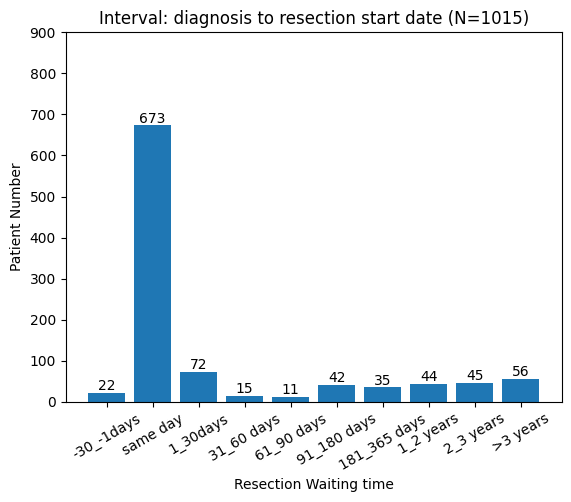

In [121]:
bin = [-31,-1, 0, 30, 60, 90, 180, 365, 730, 1095, 100000]
df_surgery.drop_duplicates(subset=['PSEUDO_PATIENTID'], inplace=True)
df_surgery['DAY_FROM_DIAG_TO_OP_'].replace(r'', np.nan, inplace = True)
df_surgery.dropna(axis=0, subset=['DAY_FROM_DIAG_TO_OP_'], inplace=True)

df_surgery['SafterD'] = pd.cut(df_surgery['DAY_FROM_DIAG_TO_OP_'].astype(float).astype(int), bins = bin, labels=('<-30days','-29_0days','1_30days', '31_60days', '61_90days', '91_180days', '181_365days', '1_2years', '2_3years', '>3years'))
df_surgery.groupby('SafterD')['PSEUDO_PATIENTID'].nunique()

BAR=plt.bar(np.arange(len(df_surgery.groupby('SafterD')['PSEUDO_PATIENTID'].nunique())), df_surgery.groupby('SafterD')['PSEUDO_PATIENTID'].nunique())
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],rotation=30,labels=['-30_-1days','same day','1_30days', '31_60 days', '61_90 days', '91_180 days', '181_365 days', '1_2 years', '2_3 years', '>3 years'])
plt.bar_label(BAR)
plt.xlabel('Resection Waiting time')
plt.ylabel('Patient Number')
plt.title('Interval: diagnosis to resection start date (N=1015)')
plt.ylim(0,900)

In [122]:
sd_sameday=df_surgery[df_surgery['DAY_FROM_DIAG_TO_OP_']==0]
sd_sameday['PSEUDO_PATIENTID'].nunique()

673

In [214]:
df4=df[df.BIGTUMOURCOUNT==4]
df4.groupby('GRADE')['PSEUDO_PATIENTID'].nunique()

GRADE
G3     1
NOS    1
Name: PSEUDO_PATIENTID, dtype: int64

(0.0, 600.0)

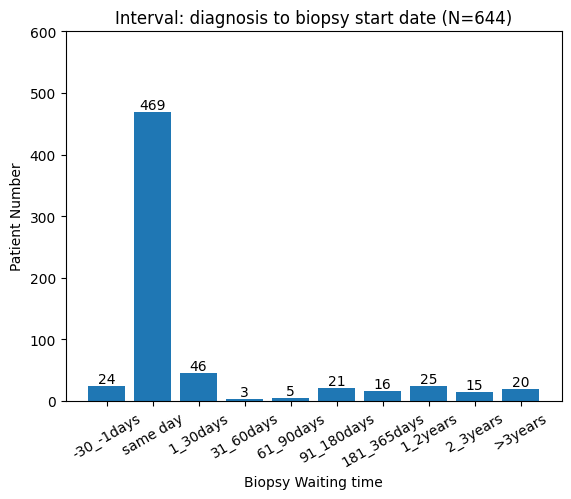

In [123]:
bin = [-31,-1, 0, 30, 60, 90, 180, 365, 730, 1095, 100000]
df_biopsy.drop_duplicates(subset=['PSEUDO_PATIENTID'], inplace=True)
df_biopsy['DAY_FROM_DIAG_TO_OP_'].replace(r'', np.nan, inplace = True)
df_biopsy.dropna(axis=0, subset=['DAY_FROM_DIAG_TO_OP_'], inplace=True)

df_biopsy['SafterD'] = pd.cut(df_biopsy['DAY_FROM_DIAG_TO_OP_'].astype(float).astype(int), bins = bin, labels=('_-30days','-29_0days','1_30days', '31_60days', '61_90days', '91_180days', '181_365days', '1_2years', '2_3years', '>3years'))
df_biopsy.groupby('SafterD')['PSEUDO_PATIENTID'].nunique()

BAR=plt.bar(np.arange(len(df_biopsy.groupby('SafterD')['PSEUDO_PATIENTID'].nunique())), df_biopsy.groupby('SafterD')['PSEUDO_PATIENTID'].nunique())
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],rotation=30,labels=['-30_-1days','same day','1_30days', '31_60days', '61_90days', '91_180days', '181_365days', '1_2years', '2_3years', '>3years'])
plt.bar_label(BAR)
plt.xlabel('Biopsy Waiting time')
plt.ylabel('Patient Number')
plt.title('Interval: diagnosis to biopsy start date (N=644)')
plt.ylim(0,600)

(0.0, 900.0)

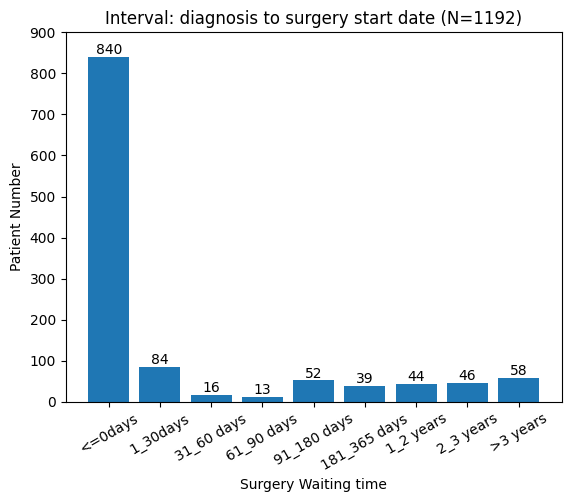

In [124]:
bin = [-31, 0, 30, 60, 90, 180, 365, 730, 1095, 100000]
surgery_or_bio.drop_duplicates(subset=['PSEUDO_PATIENTID'], inplace=True)
surgery_or_bio['DAY_FROM_DIAG_TO_OP_'].replace(r'', np.nan, inplace = True)
surgery_or_bio.dropna(axis=0, subset=['DAY_FROM_DIAG_TO_OP_'], inplace=True)

surgery_or_bio['SafterD'] = pd.cut(surgery_or_bio['DAY_FROM_DIAG_TO_OP_'].astype(float).astype(int), bins = bin, labels=('-29_0days','1_30days', '31_60days', '61_90days', '91_180days', '181_365days', '1_2years', '2_3years', '>3years'))
surgery_or_bio.groupby('SafterD')['PSEUDO_PATIENTID'].nunique()

BAR=plt.bar(np.arange(len(surgery_or_bio.groupby('SafterD')['PSEUDO_PATIENTID'].nunique())), surgery_or_bio.groupby('SafterD')['PSEUDO_PATIENTID'].nunique())
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8],rotation=30,labels=['<=0days','1_30days', '31_60 days', '61_90 days', '91_180 days', '181_365 days', '1_2 years', '2_3 years', '>3 years'])
plt.bar_label(BAR)
plt.xlabel('Surgery Waiting time')
plt.ylabel('Patient Number')
plt.title('Interval: diagnosis to surgery start date (N=1192)')
plt.ylim(0,900)

## RTDS

In [125]:
##################### FOCUS ON fraction and does in RTDS table ####################################
radio_oligo = pd.read_sql("SELECT * FROM RTDS WHERE PSEUDO_PATIENTID IN (SELECT PSEUDO_PATIENTID FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (GRADE IN ('G2', 'G3', 'GX','')) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)) );",conn)
print('Total number of patients with oligodendro in RTDS table:', radio_oligo['PSEUDO_PATIENTID'].nunique())
radio_oligo.drop_duplicates(subset=['PSEUDO_PATIENTID'], inplace=True)


Total number of patients with oligodendro in RTDS table: 823


### oligo could grow on C70 and C72, but we dont have record of C70

In [126]:
######################## Fetch the first 3 characters to get Primary diagnosis start with C71 C72 ###############

radio_oligo['PRIMARYDIAGNOSISICD']=radio_oligo['PRIMARYDIAGNOSISICD'].astype(str)
radio_oligo['ICD10']=radio_oligo['PRIMARYDIAGNOSISICD'].astype(str).str[:3]

# Creating a dataframe that locks from the original dataframe the patient id and the new ICD10 column
radio_P=radio_oligo[['PSEUDO_PATIENTID','ICD10', 'RTTREATMENTREGION', 'RTPRESCRIBEDDOSE','ACTUALFRACTIONS', 'RTACTUALDOSE','INTERVAL_DIAG_TO_TREAT_START']]

rtds2=pd.read_sql("SELECT * FROM RTDS WHERE PSEUDO_PATIENTID IN (SELECT PSEUDO_PATIENTID FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (GRADE IN ('G2', 'G3', 'GX', '')) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)) );",conn)
rtds2['PRIMARYDIAGNOSISICD']=rtds2['PRIMARYDIAGNOSISICD'].astype(str)
rtds2['ICD10']=rtds2['PRIMARYDIAGNOSISICD'].astype(str).str[:3]

# Creating three dataframes capturing the patients with different ICD10 codes for brain tumours in each 
rtdsnew=radio_P.loc[(radio_P['ICD10'] == 'C71')]
rtds2new=rtds2.loc[(rtds2['ICD10'] == 'C72' )]

# combining the three dataframes 
rtds=pd.concat([rtdsnew, rtds2new])
print('Number of patients that had an ICD 10 code of C71 or C72:', rtds['PSEUDO_PATIENTID'].nunique())

print('Number of patients without a brain tumour diagnosis in RTDS:', radio_oligo['PSEUDO_PATIENTID'].nunique() - rtds['PSEUDO_PATIENTID'].nunique())


Number of patients that had an ICD 10 code of C71 or C72: 791
Number of patients without a brain tumour diagnosis in RTDS: 32


In [127]:
# Substracting patients that were not treated for their primary diagnosis
region=rtds[['PSEUDO_PATIENTID','RTTREATMENTREGION', 'INTERVAL_DIAG_TO_TREAT_START', 'ACTUALFRACTIONS', 'RTACTUALDOSE', 'RTPRESCRIBEDDOSE']]
region=region.drop_duplicates()
a=(region['PSEUDO_PATIENTID'].nunique())
print('Total number of oligo patients with a brain tumour diagnosis in RTDS:', a)

# Creating a list with the values of the variable (region of treatment) that we want to get numbers for
primary=('P', 'R', 'PR')
# Creating a dataframe that retains only the rows with the values we selected before in the list
prim=region[region.RTTREATMENTREGION.isin(primary)]
# Printing the  number of patients assigned those selected treatments
print(prim['RTTREATMENTREGION'].value_counts())
print('Number of patients with a brain tumour diagnosis in RTDS receiving treatment to their primary site:', prim['PSEUDO_PATIENTID'].nunique())

Total number of oligo patients with a brain tumour diagnosis in RTDS: 791
P     760
PR      1
Name: RTTREATMENTREGION, dtype: int64
Number of patients with a brain tumour diagnosis in RTDS receiving treatment to their primary site: 760


In [128]:
# reassignment: from RTDS patients who had ICD10 code of C70 C71 and C72, and received treatment to their primary sites
r_oligo=prim
r_oligo.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)
r_oligo['PSEUDO_PATIENTID'].nunique()

/tmp/ipykernel_1637963/3793976419.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



760

## Combine cleaned rtds data with data in TUM_PAT

In [129]:
r_oligo=pd.merge(r_oligo, df, on='PSEUDO_PATIENTID')

In [130]:
r_oligo['PSEUDO_PATIENTID'].nunique()

749

In [131]:
r_oligo['RTPRESCRIBEDDOSE'].replace(r'',np.nan,inplace=True)
r_oligo.dropna(subset='RTPRESCRIBEDDOSE', inplace=True)
print(r_oligo['PSEUDO_PATIENTID'].nunique())

748


In [132]:
r_oligo['RTACTUALDOSE'].replace(r'',np.nan,inplace=True)
r_oligo.dropna(subset='RTACTUALDOSE', inplace=True)
print(r_oligo['PSEUDO_PATIENTID'].nunique())

475


In [133]:
r_oligo['ACTUALFRACTIONS'].replace(r'',np.nan,inplace=True)
r_oligo.dropna(subset='ACTUALFRACTIONS', inplace=True)
print(r_oligo['PSEUDO_PATIENTID'].nunique())

475


In [134]:
r_oligo.groupby('SEX')['PSEUDO_PATIENTID'].nunique()

SEX
1    250
2    225
Name: PSEUDO_PATIENTID, dtype: int64

## RT Doses oligo patients received

In [135]:
# ACtual Fractions
bin = [0, 10, 20, 30, 40, 50, 60]
r_oligo.drop_duplicates(subset=['PSEUDO_PATIENTID'], inplace=True)
r_oligo['ACTUALFRACTIONS'].replace(r'', np.nan, inplace = True)
r_oligo.dropna(axis=0, subset=['ACTUALFRACTIONS'], inplace=True)

DOSE = pd.cut(r_oligo['ACTUALFRACTIONS'].astype(float).astype(int), bins = bin)
DOSE.value_counts(sort=False).to_frame()

,ACTUALFRACTIONS
"(0, 10]",23
"(10, 20]",20
"(20, 30]",321
"(30, 40]",106
"(40, 50]",5
"(50, 60]",0


In [136]:
r_oligo['RTACTUALDOSE'].describe()

count    475.000000
mean      27.273003
std       16.000902
min        1.800000
25%       14.400000
50%       26.000000
75%       36.000000
max       60.156342
Name: RTACTUALDOSE, dtype: float64

## RT fractions oligo patients  received

In [137]:
# Fractions describe
r_oligo['ACTUALFRACTIONS'].describe()

count     475
unique     35
top        30
freq      263
Name: ACTUALFRACTIONS, dtype: int64

In [138]:
# Fractions median
statistics.median(r_oligo['ACTUALFRACTIONS'])

30

## DOSEby grades

/tmp/ipykernel_1637963/3536779182.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/3536779182.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/3536779182.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/3536779182.py:16: SettingWithCopyWarning:



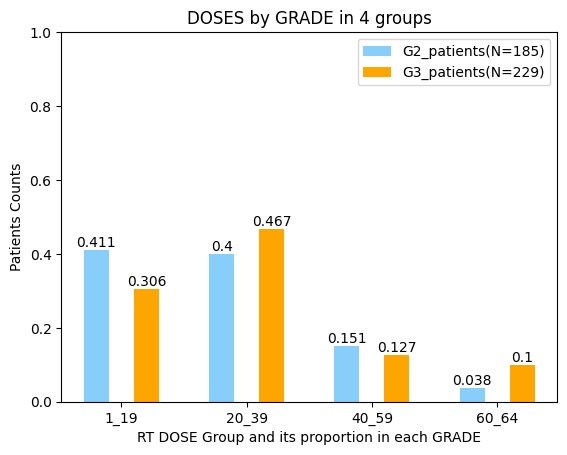

In [139]:
radio_G2=r_oligo[r_oligo.GRADE=='G2']
radio_G3=r_oligo[r_oligo.GRADE=='G3']

radio_G2.loc[(0 < radio_G2.RTACTUALDOSE) & (radio_G2.RTACTUALDOSE < 20), 'RTgroup'] = '1_19'
radio_G2.loc[(19 < radio_G2.RTACTUALDOSE) & (radio_G2.RTACTUALDOSE < 40), 'RTgroup'] = '20_39'
radio_G2.loc[(39 < radio_G2.RTACTUALDOSE) & (radio_G2.RTACTUALDOSE < 60), 'RTgroup'] = '40_59'
radio_G2.loc[(59 < radio_G2.RTACTUALDOSE) & (radio_G2.RTACTUALDOSE < 65), 'RTgroup'] = '60_64'

radio_G3.loc[(0 < radio_G3.RTACTUALDOSE) & (radio_G3.RTACTUALDOSE < 20), 'RTgroup'] = '1_19'
radio_G3.loc[(19 < radio_G3.RTACTUALDOSE) & (radio_G3.RTACTUALDOSE < 40), 'RTgroup'] = '20_39'
radio_G3.loc[(39 < radio_G3.RTACTUALDOSE) & (radio_G3.RTACTUALDOSE < 60), 'RTgroup'] = '40_59'
radio_G3.loc[(59 < radio_G3.RTACTUALDOSE) & (radio_G3.RTACTUALDOSE < 65), 'RTgroup'] = '60_64'

# drop_duplicates in case any repeat
radio_G2.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)
radio_G3.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)


# use one charc to carry the bar plot
G2 = plt.bar(np.arange(len(radio_G2.groupby('RTgroup')['SEX'].count()))-0.2, [round(i,3) for i in (radio_G2.groupby('RTgroup')['SEX'].count())/185], width=0.2,color='lightskyblue', label = 'G2_patients(N=185)')
G3 = plt.bar(np.arange(len(radio_G3.groupby('RTgroup')['SEX'].count()))+0.2, [round(i,3) for i in (radio_G3.groupby('RTgroup')['SEX'].count())/229],width=0.2, color='orange', label = 'G3_patients(N=229)')

# Show statistics
plt.xticks([0, 1, 2, 3],labels=['1_19', '20_39', '40_59', '60_64'])
plt.ylim(0, 1)
plt.xlabel('RT DOSE Group and its proportion in each GRADE')
plt.ylabel('Patients Counts')
plt.title('DOSES by GRADE in 4 groups')
plt.bar_label(G2)
plt.bar_label(G3)
plt.legend()


In [140]:
from scipy.stats import kstest
kstest(radio_G2['RTACTUALDOSE'],'norm')

KstestResult(statistic=0.9728076339922529, pvalue=4.7176365183617e-290)

In [141]:
# stat_val, p_val = stats.ttest_ind(radio_G2['RTACTUALDOSE'], radio_G3['RTACTUALDOSE'], equal_var=False)
# print('2 sample t test p value,', p_val)

In [142]:
from scipy import stats
stat_val, p_val = stats.mannwhitneyu(radio_G2['RTACTUALDOSE'], radio_G3['RTACTUALDOSE'])
print('2 sample Mann Whitney test p value,', p_val)

2 sample Mann Whitney test p value, 0.05808501987326427


(0.0, 200.0)

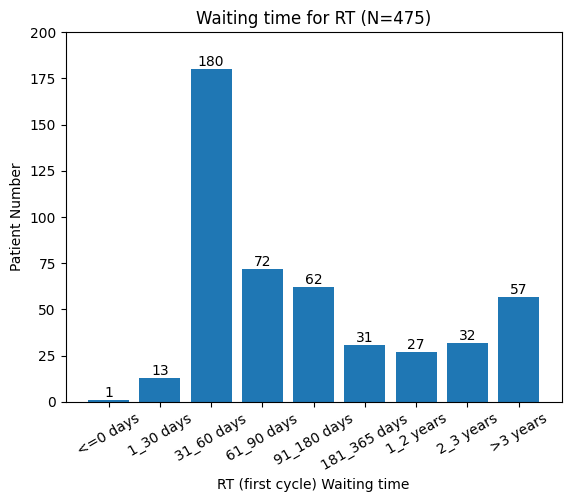

In [211]:
bin = [-100000, 0, 30, 60, 90, 180, 365, 730, 1095, 100000]
r_oligo.drop_duplicates(subset=['PSEUDO_PATIENTID'], inplace=True)
r_oligo['INTERVAL_DIAG_TO_TREAT_START'].replace(r'', np.nan, inplace = True)
r_oligo.dropna(axis=0, subset=['INTERVAL_DIAG_TO_TREAT_START'], inplace=True)

r_oligo['RTafterD'] = pd.cut(r_oligo['INTERVAL_DIAG_TO_TREAT_START'].astype(float).astype(int), bins = bin, labels=('SACT before Diag','0_29days', '30_59days', '60_89days', '90_179days', '180_364days', '1_2years', '2_3years', '>3years'))
r_oligo.groupby('RTafterD')['PSEUDO_PATIENTID'].nunique()

BAR=plt.bar(np.arange(len(r_oligo.groupby('RTafterD')['PSEUDO_PATIENTID'].nunique())), r_oligo.groupby('RTafterD')['PSEUDO_PATIENTID'].nunique())
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8],rotation=30,labels=['<=0 days','1_30 days', '31_60 days', '61_90 days', '91_180 days', '181_365 days', '1_2 years', '2_3 years', '>3 years'])
plt.bar_label(BAR)
plt.xlabel('RT (first cycle) Waiting time')
plt.ylabel('Patient Number')
plt.title('Waiting time for RT (N=475)')
plt.ylim(0,200)


# SACT

In [144]:
# fetch the first 3 characters to get patients diagnosis code starting with C70/C71/C72
c_oligo = pd.read_sql("SELECT * FROM SACT WHERE PSEUDO_PATIENTID IN (SELECT PSEUDO_PATIENTID FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (GRADE IN ('G2', 'G3', 'GX', '')) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)));",conn)
c_oligo.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)
c_oligo['PRIMARY_DIAGNOSIS']=c_oligo['PRIMARY_DIAGNOSIS'].astype(str)
c_oligo['site_ICD10']=c_oligo['PRIMARY_DIAGNOSIS'].astype(str).str[:3]

print('Patients number in SACT before cleaning:', c_oligo['PSEUDO_PATIENTID'].nunique())

# Choose the columns that we may need
chemo_icd=c_oligo[['PSEUDO_PATIENTID','site_ICD10','INTENT_OF_TREATMENT','MORPHOLOGY_CLEAN', 'BENCHMARK_GROUP','CYCLE_NUMBER','INTERVAL_DIAG_START_REGIMEN', 'DRUG_GROUP']]
chemo_icd.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)

# Selecting patients that have a brain tumour diagnosis code in SACT 
diagnosis=('C71', 'C72')
chemo_bt=chemo_icd[chemo_icd.site_ICD10.isin(diagnosis)]
print(chemo_bt['site_ICD10'].value_counts())
print('Number of patients with a brain tumour diagnosis in SACT:', chemo_bt['PSEUDO_PATIENTID'].nunique())

Patients number in SACT before cleaning: 749
C71    697
C72      3
Name: site_ICD10, dtype: int64
Number of patients with a brain tumour diagnosis in SACT: 700


/tmp/ipykernel_1637963/2990457426.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [145]:
## reassign chemo_bt to chemo_oligo
chemo_oligo=pd.merge(chemo_bt, df,on='PSEUDO_PATIENTID')
chemo_oligo['PSEUDO_PATIENTID'].nunique()

691

## Check waiting time for SACT

(0.0, 350.0)

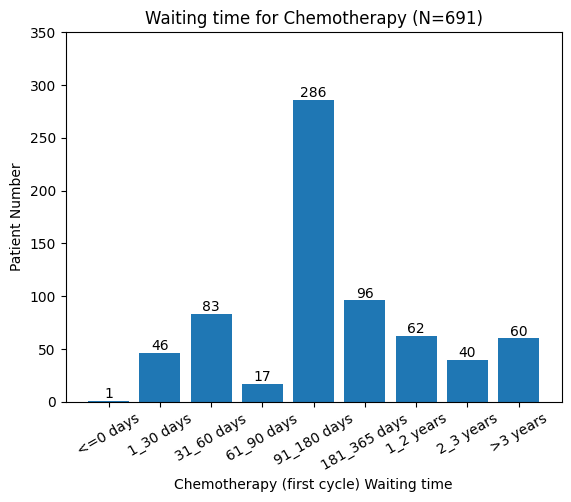

In [210]:
bin = [-100000, 0, 30, 60, 90, 180, 365, 730, 1095, 100000]
chemo_oligo.drop_duplicates(subset=['PSEUDO_PATIENTID'], inplace=True)
chemo_oligo['INTERVAL_DIAG_START_REGIMEN'].replace(r'', np.nan, inplace = True)
chemo_oligo.dropna(axis=0, subset=['INTERVAL_DIAG_START_REGIMEN'], inplace=True)

chemo_oligo['TafterD'] = pd.cut(chemo_oligo['INTERVAL_DIAG_START_REGIMEN'].astype(float).astype(int), bins = bin, labels=('SACT before Diag','0_29days', '30_59days', '60_89days', '90_179days', '180_364days', '1_2years', '2_3years', '>3years'))
chemo_oligo.groupby('TafterD')['PSEUDO_PATIENTID'].nunique()

BAR=plt.bar(np.arange(len(chemo_oligo.groupby('TafterD')['PSEUDO_PATIENTID'].nunique())), chemo_oligo.groupby('TafterD')['PSEUDO_PATIENTID'].nunique())
plt.xticks([0, 1, 2, 3, 4, 5, 6, 7, 8],rotation=30,labels=['<=0 days','1_30 days', '31_60 days', '61_90 days', '91_180 days', '181_365 days', '1_2 years', '2_3 years', '>3 years'])
plt.bar_label(BAR)
plt.xlabel('Chemotherapy (first cycle) Waiting time')
plt.ylabel('Patient Number')
plt.title('Waiting time for Chemotherapy (N=691)')
plt.ylim(0, 350)


## PCV + RT vs RT only, after patients underwent surgery

In [147]:
# Meihua Wang's paper(2009) has mentioned that PCV+RT could increase median sirvival time
# let's check if PCV+RT group's survival curve is really better than RT only

# use ~.isin() to clear patients who might underwent other chemo_therapy
RT_only_stillhave_surgery = r_oligo[~r_oligo['PSEUDO_PATIENTID'].isin(chemo_oligo['PSEUDO_PATIENTID'])]

# ~isin surgery_or_biopsy is not recommended since surgery is the basis of all kinds of treatments
RT_only = RT_only_stillhave_surgery[RT_only_stillhave_surgery['PSEUDO_PATIENTID'].isin(surgery_or_bio['PSEUDO_PATIENTID'])]

print('Number of patients who only had RT after surgery:',RT_only['PSEUDO_PATIENTID'].nunique())



Number of patients who only had RT after surgery: 96


In [148]:
## pcv have 2 drug groups, PCV and 'procarbazine + lomustine + vincristine

pcv = pd.read_sql("SELECT * FROM SACT WHERE BENCHMARK_GROUP IN ('PCV', 'LOMUSTINE + PROCARBAZINE + VINCRISTINE') AND PSEUDO_PATIENTID IN (SELECT PSEUDO_PATIENTID FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)));",conn)
PCV_RT = pd.merge(pcv, r_oligo, on = 'PSEUDO_PATIENTID')

# don't forget to choose those in C70/C71/C72 diagnosis
# diagnosis=('C70', 'C71', 'C72'), fetch the first 3 characters in Primary diagnosis column of new dataframe to double check
PCV_RT=Fetch_first(PCV_RT)
PCV_RT=PCV_RT[PCV_RT.site_ICD10.isin(diagnosis)]

# and choose those also underwent surgery in new version of codes
PCV_RT = PCV_RT[PCV_RT['PSEUDO_PATIENTID'].isin(surgery_or_bio['PSEUDO_PATIENTID'])]

print('Number of patients who have only undergone pcv + RT treatment after surgery:',PCV_RT['PSEUDO_PATIENTID'].nunique())


Number of patients who have only undergone pcv + RT treatment after surgery: 275


In [149]:
# RT_only_exclude_Chemo['INTERVAL_DIAG_TO_VS'].replace(r'', np.nan, inplace = True)
# RT_only_exclude_Chemo.dropna(axis = 0, subset=['INTERVAL_DIAG_TO_VS', 'VITALSTATUS'], inplace = True)
# RT_only_exclude_Chemo['VITALSTATUS_NEW'] = RT_only_exclude_Chemo.apply(conditions, axis = 1)
# kmf = KaplanMeierFitter()
# kmf.fit(durations = RT_only_exclude_Chemo['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = RT_only_exclude_Chemo['VITALSTATUS_NEW'], label = 'RT only')
# kmf.plot()
# print('Median survival RT_only: ', kmf.median_survival_time_)

# PCV_RT_mighthave_S['INTERVAL_DIAG_TO_VS'].replace(r'', np.nan, inplace = True)
# PCV_RT_mighthave_S.dropna(axis = 0, subset=['INTERVAL_DIAG_TO_VS', 'VITALSTATUS'], inplace = True)
# PCV_RT_mighthave_S['VITALSTATUS_NEW'] = PCV_RT_mighthave_S.apply(conditions, axis = 1)
# kmf = KaplanMeierFitter()
# kmf.fit(durations = PCV_RT_mighthave_S['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = PCV_RT_mighthave_S['VITALSTATUS_NEW'], label = 'PCV + RT')
# kmf.plot()
# print('Median survival PCV_RT: ', kmf.median_survival_time_)

# plt.xlabel('Time(days)')
# plt.ylabel('Survival probability')
# plt.title('Survival of oligo patients: PCV+RT vs RT only')

# To note, these groups might contain surgeries as basis of treatments

# It is strange at the late stage of curves, maybe resections were already enough for recovery, and RT is a good adjuctive choice


Median survival RT_only:  inf
Median survival PCV_RT:  inf


/tmp/ipykernel_1637963/3268133030.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/3268133030.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/3268133030.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Text(0.5, 1.0, 'Survival of oligo patients: PCV+RT vs RT only')

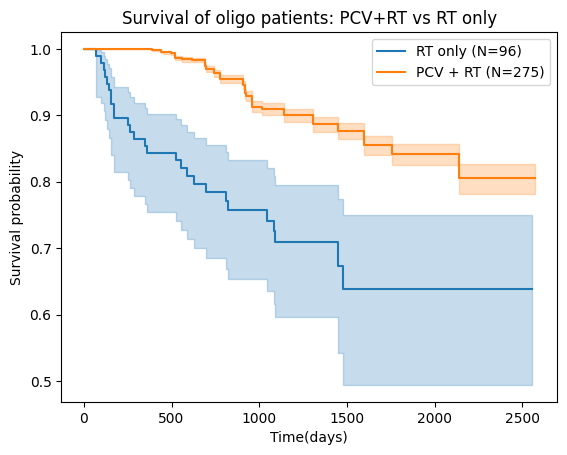

In [150]:
kmf=KaplanMeierFitter()
# never forget to drop NA before kmf
RT_only['INTERVAL_DIAG_TO_VS'].replace(r'', np.nan, inplace = True)
RT_only.dropna(axis = 0, subset=['INTERVAL_DIAG_TO_VS', 'VITALSTATUS'], inplace = True)
RT_only['VITALSTATUS_NEW'] = RT_only.apply(conditions, axis = 1)

# give a name to the fitter for later log_rank test
rt=kmf.fit(durations = RT_only['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = RT_only['VITALSTATUS_NEW'], label = 'RT only (N=96)')
kmf.plot()
print('Median survival RT_only: ', kmf.median_survival_time_)

PCV_RT['INTERVAL_DIAG_TO_VS'].replace(r'', np.nan, inplace = True)
PCV_RT.dropna(axis = 0, subset=['INTERVAL_DIAG_TO_VS', 'VITALSTATUS'], inplace = True)
PCV_RT['VITALSTATUS_NEW'] = PCV_RT.apply(conditions, axis = 1)

# give a name to the fitter for later log_rank test
pcv_rt=kmf.fit(durations = PCV_RT['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = PCV_RT['VITALSTATUS_NEW'], label = 'PCV + RT (N=275)')
kmf.plot()
print('Median survival PCV_RT: ', kmf.median_survival_time_)

plt.xlabel('Time(days)')
plt.ylabel('Survival probability')
plt.title('Survival of oligo patients: PCV+RT vs RT only')

# this comparison is way more clear 

In [151]:
PR_results = logrank_test(PCV_RT['INTERVAL_DIAG_TO_VS'], RT_only['INTERVAL_DIAG_TO_VS'],
                       event_observed_A = PCV_RT.apply(conditions,axis=1).astype(int),
                       event_observed_B = RT_only.apply(conditions,axis=1).astype(int))
PR_results.print_summary()
# Great, now this comparison can be defined as valid

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          46.77 <0.005     36.87

## To compare TMZ only vs TMZ+RT, the conservative way is to query only in benchmark_group, however it would make the patient number in TMZ+RT group looks too small

In [152]:
## left merge, same for TMZ+RT
tmz = pd.read_sql("SELECT * FROM SACT WHERE BENCHMARK_GROUP IN ('TEMOZOLOMIDE') AND PSEUDO_PATIENTID IN (SELECT PSEUDO_PATIENTID FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)));",conn)
TMZ = pd.merge(tmz, df, on = 'PSEUDO_PATIENTID')
print('before site_icd10 cleaning, patient number of TMZ only Group:', TMZ['PSEUDO_PATIENTID'].nunique())

# diagnosis=('C70', 'C71', 'C72'), fetch the first 3 characters in Primary diagnosis column of new dataframe to double check
TMZ['PRIMARY_DIAGNOSIS']=TMZ['PRIMARY_DIAGNOSIS'].astype(str)
TMZ['site_ICD10']=TMZ['PRIMARY_DIAGNOSIS'].astype(str).str[:3]
TMZ_clean=TMZ[TMZ.site_ICD10.isin(diagnosis)]
print('after cleaning patients who dont have C70/C71/C72 codes:', TMZ_clean['PSEUDO_PATIENTID'].nunique())

TMZ_clean_exradio = TMZ_clean[~TMZ_clean['PSEUDO_PATIENTID'].isin(r_oligo['PSEUDO_PATIENTID'])]
print('after excluding patients in RTDS, patient number:',TMZ_clean_exradio['PSEUDO_PATIENTID'].nunique())

# and choose those also underwent surgery in new version of codes
TMZ_final = TMZ_clean_exradio[TMZ_clean_exradio['PSEUDO_PATIENTID'].isin(surgery_or_bio['PSEUDO_PATIENTID'])]

print('Number of patients who have only undergone TMZ treatment after surgery:',TMZ_final['PSEUDO_PATIENTID'].nunique())


before site_icd10 cleaning, patient number of TMZ only Group: 326
after cleaning patients who dont have C70/C71/C72 codes: 307
after excluding patients in RTDS, patient number: 160
Number of patients who have only undergone TMZ treatment after surgery: 154


In [153]:
## add a group to TMZ_inradio since only quering TMZ+RT in Benchamark group, N is too small

TMZ_clean_inradio = TMZ_clean[TMZ_clean['PSEUDO_PATIENTID'].isin(r_oligo['PSEUDO_PATIENTID'])]
TMZ_clean_inradio['PSEUDO_PATIENTID'].nunique()


147

In [154]:
## TMZ+RT
tmz_rt = pd.read_sql("SELECT * FROM SACT WHERE BENCHMARK_GROUP IN ('TEMOZOLOMIDE + RT') AND PSEUDO_PATIENTID IN (SELECT PSEUDO_PATIENTID FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)));",conn)
TMZ_RT = pd.merge(tmz_rt, df, on = 'PSEUDO_PATIENTID', how='left')
print('before site_icd10 cleaning, patient number of TMZ+RT benchmark Group:', TMZ_RT['PSEUDO_PATIENTID'].nunique())

# diagnosis=('C70', 'C71', 'C72'), fetch the first 3 characters in Primary diagnosis column of new dataframe to double check
TMZ_RT['PRIMARY_DIAGNOSIS']=TMZ_RT['PRIMARY_DIAGNOSIS'].astype(str)
TMZ_RT['site_ICD10']=TMZ_RT['PRIMARY_DIAGNOSIS'].astype(str).str[:3]
TMZ_RTclean=TMZ_RT[TMZ_RT.site_ICD10.isin(diagnosis)]
print('after cleaning patients who dont have C70/C71/C72 codes, TMZ+RT benchmark Group:', TMZ_RTclean['PSEUDO_PATIENTID'].nunique())

# make sure no matter TMZ+RT benchmark group or TMZalsoinRTDS group all in RTDS table
TMZplusRT_clean = TMZ_RTclean[TMZ_RTclean['PSEUDO_PATIENTID'].isin(r_oligo['PSEUDO_PATIENTID'])]
TMZ_concat=pd.concat([TMZplusRT_clean, TMZ_clean_inradio])
print('after locking patients in RTDS and concat TMZinRTDS group, patient number:',TMZ_concat['PSEUDO_PATIENTID'].nunique())

# and choose those also underwent surgery in new version of codes
TMZ_RTfinal = TMZ_concat[TMZ_concat['PSEUDO_PATIENTID'].isin(surgery_or_bio['PSEUDO_PATIENTID'])]

print('Number of patients who have undergone TMZ and RTtreatment after surgery:',TMZ_RTfinal['PSEUDO_PATIENTID'].nunique())


before site_icd10 cleaning, patient number of TMZ+RT benchmark Group: 85
after cleaning patients who dont have C70/C71/C72 codes, TMZ+RT benchmark Group: 77
after locking patients in RTDS and concat TMZinRTDS group, patient number: 149
Number of patients who have undergone TMZ and RTtreatment after surgery: 145


/tmp/ipykernel_1637963/413356648.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/413356648.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/413356648.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/413356648.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFr

Text(0.5, 1.0, 'Survival of oligo patients: TMZ+RT vs TMZ only')

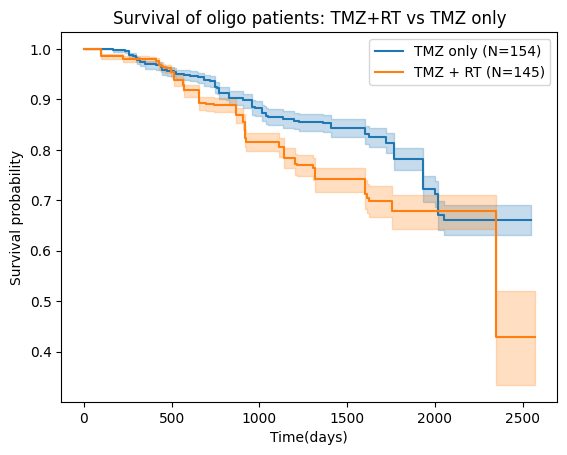

In [155]:
# never forget to drop NA before kmf
TMZ_final['INTERVAL_DIAG_TO_VS'].replace(r'', np.nan, inplace = True)
TMZ_final.dropna(axis = 0, subset=['INTERVAL_DIAG_TO_VS', 'VITALSTATUS'], inplace = True)
TMZ_final['VITALSTATUS_NEW'] = TMZ_final.apply(conditions, axis = 1)
kmf=KaplanMeierFitter()
tmz=kmf.fit(durations = TMZ_final['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = TMZ_final['VITALSTATUS_NEW'], label = 'TMZ only (N=154)')
kmf.plot()

TMZ_RTfinal['INTERVAL_DIAG_TO_VS'].replace(r'', np.nan, inplace = True)
TMZ_RTfinal.dropna(axis = 0, subset=['INTERVAL_DIAG_TO_VS', 'VITALSTATUS'], inplace = True)
TMZ_RTfinal['VITALSTATUS_NEW'] = TMZ_RTfinal.apply(conditions, axis = 1)
tmz_rt=kmf.fit(durations = TMZ_RTfinal['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = TMZ_RTfinal['VITALSTATUS_NEW'], label = 'TMZ + RT (N=145)')
kmf.plot()

plt.xlabel('Time(days)')
plt.ylabel('Survival probability')
plt.title('Survival of oligo patients: TMZ+RT vs TMZ only')


## Significant difference found, but we could also check their sequences later, since we don't know which contribute more to this result, TMZ+RT or RT+TMZ? 

In [156]:
TR_results = logrank_test(TMZ_final['INTERVAL_DIAG_TO_VS'], TMZ_RTfinal['INTERVAL_DIAG_TO_VS'],
                       event_observed_A = TMZ_final.apply(conditions,axis=1).astype(int),
                       event_observed_B = TMZ_RTfinal.apply(conditions,axis=1).astype(int))
TR_results.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          34.01 <0.005     27.44

## Build groups for seqs

In [157]:
## prim is almost same with r_oligo, just did not merge with df
rtds_oligo=prim

# and only select the useful column
rtds_oligo=rtds_oligo[['PSEUDO_PATIENTID', 'INTERVAL_DIAG_TO_TREAT_START']]
TMZ_RTfinal=TMZ_RTfinal[['PSEUDO_PATIENTID', 'INTERVAL_DIAG_START_REGIMEN']]

# drop NA and duplicates
TMZ_RTfinal.dropna(subset='INTERVAL_DIAG_START_REGIMEN', axis=0)
TMZ_RTfinal.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)
rtds_oligo.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)

/tmp/ipykernel_1637963/1198997592.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [158]:
# Merge TMZ_RTfinal with oligo patients in RTDS, and df in order to applay kmf
TMZ_RT_withT=pd.merge(TMZ_RTfinal, rtds_oligo)
TMZ_RT_withI=pd.merge(TMZ_RT_withT, df, how='left')
TMZ_RT_withI.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)
print('after merging with patients in RTDS and TUM_PAT, patient number:' ,TMZ_RT_withI['PSEUDO_PATIENTID'].nunique())


after merging with patients in RTDS and TUM_PAT, patient number: 145


In [159]:
TMZ_RT_withI.loc[(TMZ_RT_withI.INTERVAL_DIAG_TO_TREAT_START > TMZ_RT_withI.INTERVAL_DIAG_START_REGIMEN), 'seq'] = 'TMZ_then_RT'
TMZ_RT_withI.loc[(TMZ_RT_withI.INTERVAL_DIAG_TO_TREAT_START < TMZ_RT_withI.INTERVAL_DIAG_START_REGIMEN), 'seq'] = 'RT_then_TMZ'
TMZ_RT_withI.loc[(TMZ_RT_withI.INTERVAL_DIAG_TO_TREAT_START == TMZ_RT_withI.INTERVAL_DIAG_START_REGIMEN), 'seq'] = 'RT_TMZsame'
# os.chdir('/home/ll6222/Documents/DS175/share/19_Rare tumours')
# TMZ_RT_withT.to_csv('TMZ RT seq survival comparison.csv')

# these codes looks very repeated but practical
tmz_then_rt='TMZ_then_RT'
tmz_then_rt=TMZ_RT_withI.query('seq in @tmz_then_rt')
print('tmz,then rt',tmz_then_rt['PSEUDO_PATIENTID'].nunique())

rt_then_tmz='RT_then_TMZ'
rt_then_tmz=TMZ_RT_withI.query('seq in @rt_then_tmz')
print('rt,then tmz',rt_then_tmz['PSEUDO_PATIENTID'].nunique())

tmz_rt_s='RT_TMZsame'
tmz_rt_s=TMZ_RT_withI.query('seq in @tmz_rt_s')
print('tmz and rt smae time',tmz_rt_s['PSEUDO_PATIENTID'].nunique())


tmz,then rt 60
rt,then tmz 79
tmz and rt smae time 6


/tmp/ipykernel_1637963/597192751.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/597192751.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/597192751.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/597192751.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFr

Text(0, 0.5, 'Survival Probability')

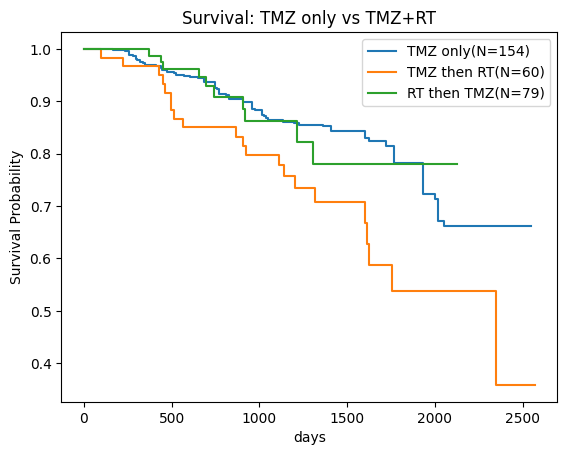

In [160]:

TMZ_final['INTERVAL_DIAG_TO_VS'].replace(r'', np.nan, inplace = True)
TMZ_final.dropna(axis = 0, subset=['INTERVAL_DIAG_TO_VS', 'VITALSTATUS'], inplace = True)
TMZ_final['VITALSTATUS_NEW'] = TMZ_final.apply(conditions, axis = 1)
tmz=kmf.fit(durations = TMZ_final['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = TMZ_final['VITALSTATUS_NEW'], label = 'TMZ only(N=154)')
kmf.plot(ci_show=False)

tmz_then_rt['VITALSTATUS_NEW'] = tmz_then_rt.apply(conditions, axis = 1)
TMZ_RT=kmf.fit(durations = tmz_then_rt['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = tmz_then_rt['VITALSTATUS_NEW'], label = 'TMZ then RT(N=60)')
kmf.plot(ci_show=False)

rt_then_tmz['VITALSTATUS_NEW'] = rt_then_tmz.apply(conditions, axis = 1)
rt_tmz=kmf.fit(durations = rt_then_tmz['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = rt_then_tmz['VITALSTATUS_NEW'], label = 'RT then TMZ(N=79)')
kmf.plot(ci_show=False)

# tmz_rt_s['VITALSTATUS_NEW'] = tmz_rt_s.apply(conditions, axis = 1)
# tmz_rt_same=kmf.fit(durations = tmz_rt_s['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = tmz_rt_s['VITALSTATUS_NEW'], label = 'TMZ_RT same time(N=6)')
# kmf.plot(ci_show=False)

plt.title('Survival: TMZ only vs TMZ+RT')
plt.xlabel('days')
plt.ylabel('Survival Probability')

In [161]:
Tonly_RTthenTMZ_results = logrank_test(TMZ_final['INTERVAL_DIAG_TO_VS'], rt_then_tmz['INTERVAL_DIAG_TO_VS'],
                       event_observed_A = TMZ_final.apply(conditions,axis=1).astype(int),
                       event_observed_B = rt_then_tmz.apply(conditions,axis=1).astype(int))
Tonly_RTthenTMZ_results.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.17 0.68      0.56

In [162]:
Tonly_TMZthenRT_results = logrank_test(TMZ_final['INTERVAL_DIAG_TO_VS'], tmz_then_rt['INTERVAL_DIAG_TO_VS'],
                       event_observed_A = TMZ_final.apply(conditions,axis=1).astype(int),
                       event_observed_B = tmz_then_rt.apply(conditions,axis=1).astype(int))
Tonly_TMZthenRT_results.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          10.97 <0.005     10.08

## Discovery into PCV comparing with TMZ (plus RT or not)

In [163]:
## build a group for PCV only
pcv = pd.read_sql("SELECT * FROM SACT WHERE BENCHMARK_GROUP IN ('PCV', 'LOMUSTINE + PROCARBAZINE + VINCRISTINE') AND PSEUDO_PATIENTID IN (SELECT PSEUDO_PATIENTID FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)));",conn)

## not in RTDS
pcv_only = pcv[~pcv['PSEUDO_PATIENTID'].isin(r_oligo['PSEUDO_PATIENTID'])]

# don't forget to choose those in C70/C71/C72 diagnosis
# diagnosis=('C70', 'C71', 'C72'), fetch the first 3 characters in Primary diagnosis column of new dataframe to double check
pcv_only=Fetch_first(pcv_only)

pcv_only=pcv_only[pcv_only.site_ICD10.isin(diagnosis)]

# and choose those also underwent surgery in new version of codes
pcv_only = pcv_only[pcv_only['PSEUDO_PATIENTID'].isin(surgery_or_bio['PSEUDO_PATIENTID'])]

# and merge it with TUM_PAT for KaplanMeier 's applicaiton
pcv_only=pd.merge(df,pcv_only, on='PSEUDO_PATIENTID')
print('pcv only patients count',pcv_only['PSEUDO_PATIENTID'].nunique())

pcv only patients count 194


/tmp/ipykernel_1637963/3125133434.py:414: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/3125133434.py:415: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [215]:
TMZ_RT_withI.groupby('GRADE')['PSEUDO_PATIENTID'].nunique()

GRADE
       5
G2    45
G3    83
GX    12
Name: PSEUDO_PATIENTID, dtype: int64

In [216]:
TMZ_RT_withI['AGE'].describe()

count    145.000000
mean      45.855172
std       12.377163
min       19.000000
25%       38.000000
50%       45.000000
75%       54.000000
max       78.000000
Name: AGE, dtype: float64


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(0.0, 1.0302169052325554)

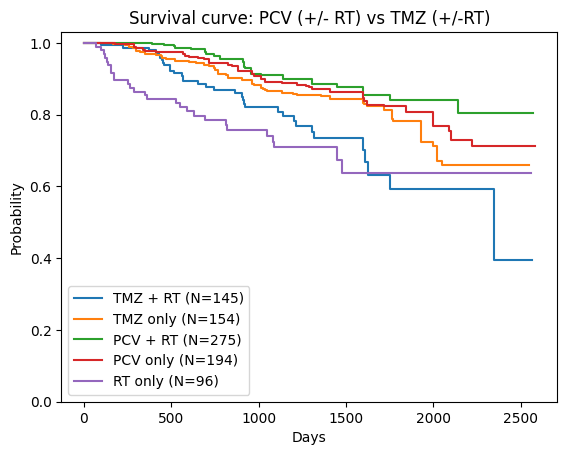

In [203]:
## PCV RT vs TMZ RT vs TMZ only vs PCV only
TMZ_RT_withI=Drop(TMZ_RT_withI)
TMZ_RT_withI['VITALSTATUS_NEW'] = TMZ_RT_withI.apply(conditions, axis = 1)
tmz_rt=kmf.fit(durations = TMZ_RT_withI['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = TMZ_RT_withI['VITALSTATUS_NEW'], label = 'TMZ + RT (N=145)')
kmf.plot(ci_show=False)

TMZ_final=Drop(TMZ_final)
TMZ_final['VITALSTATUS_NEW'] = TMZ_final.apply(conditions, axis = 1)
tmz=kmf.fit(durations = TMZ_final['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = TMZ_final['VITALSTATUS_NEW'], label = 'TMZ only (N=154)')
kmf.plot(ci_show=False)

PCV_RT=Drop(PCV_RT)
PCV_RT['VITALSTATUS_NEW'] = PCV_RT.apply(conditions, axis = 1)
pcv_rt=kmf.fit(durations = PCV_RT['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = PCV_RT['VITALSTATUS_NEW'], label = 'PCV + RT (N=275)')
kmf.plot(ci_show=False)

pcv_only=Drop(pcv_only)
pcv_only['VITALSTATUS_NEW'] = pcv_only.apply(conditions, axis = 1)
pcv=kmf.fit(durations = pcv_only['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = pcv_only['VITALSTATUS_NEW'], label = 'PCV only (N=194)')
kmf.plot(ci_show=False)

RT_only['VITALSTATUS_NEW'] = RT_only.apply(conditions, axis = 1)
rt=kmf.fit(durations = RT_only['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = RT_only['VITALSTATUS_NEW'], label = 'RT only (N=96)')
kmf.plot(ci_show=False)

plt.xlabel('Days')
plt.title('Survival curve: PCV (+/- RT) vs TMZ (+/-RT)')
plt.ylabel('Probability')
plt.ylim(0,)

In [165]:
TMZ_RT_3=TMZ_RT_withI[TMZ_RT_withI.GRADE=='G3'] # N=83
TMZ_RT_2=TMZ_RT_withI[TMZ_RT_withI.GRADE=='G2'] # N=45

In [166]:
TMZ_3=TMZ_final[TMZ_final.GRADE=='G3'] # N=97
TMZ_2=TMZ_final[TMZ_final.GRADE=='G2'] # N=44

In [167]:
pcv_3=pcv_only[pcv_only.GRADE=='G3'] # N=114
pcv_2=pcv_only[pcv_only.GRADE=='G2'] # N=56

In [168]:
pcv_rt3=PCV_RT[PCV_RT.GRADE=='G3'] # N=141
pcv_rt2=PCV_RT[PCV_RT.GRADE=='G2'] # N=101

/tmp/ipykernel_1637963/2699188926.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/2699188926.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/2699188926.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipyk

(0.0, 1.021418832428555)

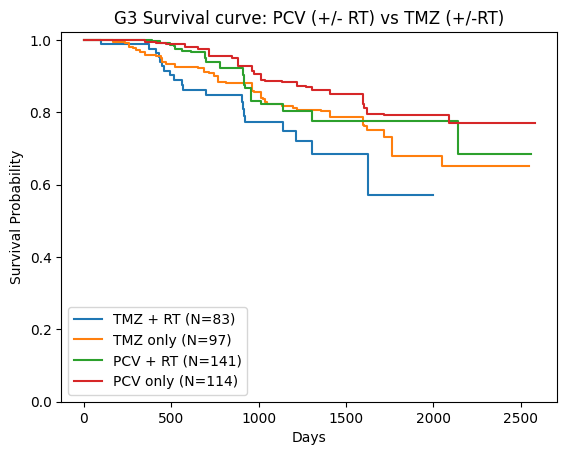

In [169]:
## PCV RT vs TMZ RT vs TMZ only vs PCV only ---------- G3
# TMZ_RT_withI=Drop(TMZ_RT_withI)
TMZ_RT_3['VITALSTATUS_NEW'] = TMZ_RT_3.apply(conditions, axis = 1)
tmz_rt=kmf.fit(durations = TMZ_RT_3['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = TMZ_RT_3['VITALSTATUS_NEW'], label = 'TMZ + RT (N=83)')
kmf.plot(ci_show=False)

# TMZ_final=Drop(TMZ_final)
TMZ_3['VITALSTATUS_NEW'] = TMZ_3.apply(conditions, axis = 1)
tmz=kmf.fit(durations = TMZ_3['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = TMZ_3['VITALSTATUS_NEW'], label = 'TMZ only (N=97)')
kmf.plot(ci_show=False)

# PCV_RT=Drop(PCV_RT)
pcv_rt3['VITALSTATUS_NEW'] = pcv_rt3.apply(conditions, axis = 1)
pcv_rt=kmf.fit(durations = pcv_rt3['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = pcv_rt3['VITALSTATUS_NEW'], label = 'PCV + RT (N=141)')
kmf.plot(ci_show=False)

# pcv_only=Drop(pcv_only)
pcv_3['VITALSTATUS_NEW'] = pcv_3.apply(conditions, axis = 1)
pcv=kmf.fit(durations = pcv_3['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = pcv_3['VITALSTATUS_NEW'], label = 'PCV only (N=114)')
kmf.plot(ci_show=False)

plt.xlabel('Days')
plt.title('G3 Survival curve: PCV (+/- RT) vs TMZ (+/-RT)')
plt.ylabel('Survival Probability')
plt.ylim(0,)

/tmp/ipykernel_1637963/3184283602.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/3184283602.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_1637963/3184283602.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipyk

(0.0, 1.0274179611057255)

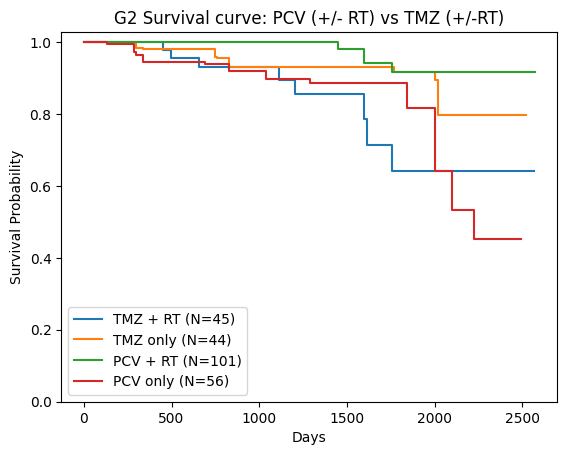

In [170]:
## PCV RT vs TMZ RT vs TMZ only vs PCV only ---------- G2
# TMZ_RT_withI=Drop(TMZ_RT_withI)
TMZ_RT_2['VITALSTATUS_NEW'] = TMZ_RT_2.apply(conditions, axis = 1)
tmz_rt=kmf.fit(durations = TMZ_RT_2['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = TMZ_RT_2['VITALSTATUS_NEW'], label = 'TMZ + RT (N=45)')
kmf.plot(ci_show=False)

# TMZ_final=Drop(TMZ_final)
TMZ_2['VITALSTATUS_NEW'] = TMZ_2.apply(conditions, axis = 1)
tmz=kmf.fit(durations = TMZ_2['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = TMZ_2['VITALSTATUS_NEW'], label = 'TMZ only (N=44)')
kmf.plot(ci_show=False)

# PCV_RT=Drop(PCV_RT)
pcv_rt2['VITALSTATUS_NEW'] = pcv_rt2.apply(conditions, axis = 1)
pcv_rt=kmf.fit(durations = pcv_rt2['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = pcv_rt2['VITALSTATUS_NEW'], label = 'PCV + RT (N=101)')
kmf.plot(ci_show=False)

# pcv_only=Drop(pcv_only)
pcv_2['VITALSTATUS_NEW'] = pcv_2.apply(conditions, axis = 1)
pcv=kmf.fit(durations = pcv_2['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = pcv_2['VITALSTATUS_NEW'], label = 'PCV only (N=56)')
kmf.plot(ci_show=False)

plt.xlabel('Days')
plt.title('G2 Survival curve: PCV (+/- RT) vs TMZ (+/-RT)')
plt.ylabel('Survival Probability')
plt.ylim(0,)

In [171]:
PCVRT_PCVonly_results = logrank_test(PCV_RT['INTERVAL_DIAG_TO_VS'], pcv_only['INTERVAL_DIAG_TO_VS'],
                       event_observed_A = PCV_RT.apply(conditions,axis=1).astype(int),
                       event_observed_B = pcv_only.apply(conditions,axis=1).astype(int))
PCVRT_PCVonly_results.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          18.95 <0.005     16.19

In [172]:
PCVRT_TMZonly_results = logrank_test(PCV_RT['INTERVAL_DIAG_TO_VS'], TMZ_final['INTERVAL_DIAG_TO_VS'],
                       event_observed_A = PCV_RT.apply(conditions,axis=1).astype(int),
                       event_observed_B = TMZ_final.apply(conditions,axis=1).astype(int))
PCVRT_TMZonly_results.print_summary()

<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          62.72 <0.005     48.57

In [237]:
pcv = pd.read_sql("SELECT * FROM SACT WHERE (PRIMARY_DIAGNOSIS LIKE 'C71_' or 'C72_') AND BENCHMARK_GROUP IN ('PCV', 'LOMUSTINE + PROCARBAZINE + VINCRISTINE') AND PSEUDO_PATIENTID IN (SELECT PSEUDO_PATIENTID FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)));",conn)
pcv=pd.merge(pcv,df,on='PSEUDO_PATIENTID')

pcv.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)
print('after SITE_ICD10 cleaning, PCV patient number',pcv['PSEUDO_PATIENTID'].nunique())

tmz = pd.read_sql("SELECT * FROM SACT WHERE (PRIMARY_DIAGNOSIS LIKE 'C71_' or 'C72_') AND BENCHMARK_GROUP IN ('TEMOZOLOMIDE', 'TEMOZOLOMIDE + RT') AND PSEUDO_PATIENTID IN (SELECT PSEUDO_PATIENTID FROM TUM_PAT WHERE MORPH_ICD10_O2 IN (9450, 9451) AND (INTERVAL_DIAG_TO_VS != '') AND (VITALSTATUS IN ('A', 'D')) AND (ETHNICITY IN ('A','B', 'C', 'D', 'F', 'G', 'H', 'J', 'L', 'M', 'N', 'P', 'R', 'S', 'X', 'Z')) AND (DIAGNOSISYEAR IN (2013,2014,2015,2016,2017,2018)) AND (SEX IN (1,2)) AND (BASISOFDIAGNOSIS IN (1,2,7,9)));",conn)
tmz = pd.merge(tmz, df, on = 'PSEUDO_PATIENTID')

tmz.drop_duplicates(subset='PSEUDO_PATIENTID', inplace=True)
print('after SITE_ICD10 cleaning, TMZ patient number', tmz['PSEUDO_PATIENTID'].nunique())


after SITE_ICD10 cleaning, PCV patient number 458
after SITE_ICD10 cleaning, TMZ patient number 299


## Cox version 5

In [239]:
## firstly we need to deal with NA in GRADE
df['GRADE'].replace('','GX', inplace=True)
df['GRADE'].replace('GX','NOS', inplace=True)
df_cox=df[['PSEUDO_PATIENTID','BIGTUMOURCOUNT','AGE', 'SEX', 'INCOME_QUINTILE_2015', 'ETHNICITYNAME', 'GRADE', 'VITALSTATUS', 'INTERVAL_DIAG_TO_VS', 'SITE_ICD10_O2']]

# Clean data as usual
df_cox['VITALSTATUS'].replace(r'A', 0, inplace=True)
df_cox['VITALSTATUS'].replace(r'D', 1, inplace=True)

## black, asian, white and NOS
df_cox['ETHNICITYNAME'].replace('ANY OTHER BLACK BACKGROUND', 'BLACK', inplace=True)
df_cox['ETHNICITYNAME'].replace('BLACK AFRICAN', 'BLACK', inplace=True)
df_cox['ETHNICITYNAME'].replace('BLACK CARIBBEAN', 'BLACK', inplace=True)

df_cox['ETHNICITYNAME'].replace('CHINESE', 'ASIAN', inplace=True)
df_cox['ETHNICITYNAME'].replace('ASIAN INDIAN', 'ASIAN', inplace=True)
df_cox['ETHNICITYNAME'].replace('ASIAN PAKISTANI', 'ASIAN', inplace=True)
df_cox['ETHNICITYNAME'].replace('ANY OTHER ASIAN BACKGROUND', 'ASIAN', inplace=True)

df_cox['ETHNICITYNAME'].replace('WHITE IRISH', 'WHITE', inplace=True)
df_cox['ETHNICITYNAME'].replace('WHITE BRITISH', 'WHITE', inplace=True)
df_cox['ETHNICITYNAME'].replace('ANY OTHER WHITE BACKGROUND', 'WHITE', inplace=True)

df_cox['ETHNICITYNAME'].replace('NOT KNOWN', 'Ethnicity NOS', inplace=True)
df_cox['ETHNICITYNAME'].replace('NOT STATED', 'Ethnicity NOS', inplace=True)
df_cox['ETHNICITYNAME'].replace('ANY OTHER ETHNIC GROUP', 'Ethnicity NOS', inplace=True)
df_cox['ETHNICITYNAME'].replace('ANY OTHER MIXED BACKGROUND', 'Ethnicity NOS', inplace=True)
df_cox['ETHNICITYNAME'].replace('MIXED WHITE AND ASIAN', 'Ethnicity NOS', inplace=True)
df_cox['ETHNICITYNAME'].replace('MIXED WHITE AND BLACK CARIBBEAN', 'Ethnicity NOS', inplace=True)

## C71 and C72
df_cox['SITE_ICD10_O2'].replace('C725', 'C72', inplace=True)

df_cox['SITE_ICD10_O2'].replace('C710', 'C71', inplace=True)
df_cox['SITE_ICD10_O2'].replace('C711', 'C71', inplace=True)
df_cox['SITE_ICD10_O2'].replace('C712', 'C71', inplace=True)
df_cox['SITE_ICD10_O2'].replace('C713', 'C71', inplace=True)
df_cox['SITE_ICD10_O2'].replace('C714', 'C71', inplace=True)
df_cox['SITE_ICD10_O2'].replace('C716', 'C71', inplace=True)
df_cox['SITE_ICD10_O2'].replace('C718', 'C71', inplace=True)
df_cox['SITE_ICD10_O2'].replace('C719', 'C71', inplace=True)

## Most/middle/Least deprived
df_cox['INCOME_QUINTILE_2015'].replace('1 - Least deprived', 'Least deprived', inplace=True)
df_cox['INCOME_QUINTILE_2015'].replace('2', 'Least deprived', inplace=True)
df_cox['INCOME_QUINTILE_2015'].replace('3', 'Middle deprived', inplace=True)
df_cox['INCOME_QUINTILE_2015'].replace('4', 'Most deprived', inplace=True)
df_cox['INCOME_QUINTILE_2015'].replace('5 - Most deprived', 'Most deprived', inplace=True)


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

In [240]:
df_cox['curative_RT']=0
df_cox['palliative_RT']=0

df_cox['PCV-Palliative']=0
df_cox['PCV-Curative']=0
# df_cox['PCV-Adjuvant']=0

df_cox['TMZ-Palliative']=0
df_cox['TMZ-Curative']=0
# df_cox['TMZ-Adjuvant']=0

df_cox['Resection']=0
df_cox['Biopsy']=0


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

In [243]:
df_g2=df_cox[df_cox.GRADE=='G2']
df_g3=df_cox[df_cox.GRADE=='G3']
df_nos=df_cox[df_cox.GRADE=='NOS']
df_g2['INTERVAL_DIAG_TO_VS'].dropna(inplace=True)

df_g3['INTERVAL_DIAG_TO_VS'].dropna(inplace=True)

df_nos['INTERVAL_DIAG_TO_VS'].dropna(inplace=True)


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [246]:
df_nos['PSEUDO_PATIENTID'].nunique()

199

In [247]:
df_g2['VITALSTATUS_NEW'] = df_g2.apply(conditions, axis = 1)
df_g2=kmf.fit(durations = df_g2['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = df_g2['VITALSTATUS_NEW'], label = 'G2 Patients (N=548)')
kmf.plot(ci_show=False)

df_g3['VITALSTATUS_NEW'] = df_g3.apply(conditions, axis = 1)
df_g3=kmf.fit(durations = df_g3['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = df_g3['VITALSTATUS_NEW'], label = 'G3 Patients (N=524)')
kmf.plot(ci_show=False)

df_nos['VITALSTATUS_NEW'] = df_nos.apply(conditions, axis = 1)
df_nos=kmf.fit(durations = df_nos['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = df_nos['VITALSTATUS_NEW'], label = 'NOS Patients (N=199)')
kmf.plot(ci_show=False)

plt.title('Survival Curve: Grades')
plt.xlabel('days')
plt.ylabel('Survival Probability')


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


TypeError: NaNs were detected in the dataset. Try using pd.isnull to find the problematic values.

In [238]:
pcv_r=pcv[pcv.INTENT_OF_TREATMENT == 'C']
pcv_p=pcv[pcv.INTENT_OF_TREATMENT == 'P']
pcv_a=pcv[pcv.INTENT_OF_TREATMENT == 'A']
pcv_n=pcv[pcv.INTENT_OF_TREATMENT == 'N']

tmz_r=tmz[tmz.INTENT_OF_TREATMENT == 'C']
tmz_p=tmz[tmz.INTENT_OF_TREATMENT == 'P']
tmz_a=tmz[tmz.INTENT_OF_TREATMENT == 'A']
tmz_n=tmz[tmz.INTENT_OF_TREATMENT == 'N']

radio_oligo['RTACTUALDOSE'].replace('',np.nan,inplace=True)
radio_oligo.dropna(subset='RTACTUALDOSE', axis=0, inplace=True)

curative_r = radio_oligo.query('RTACTUALDOSE > 40')
palliative_r = radio_oligo.query('RTACTUALDOSE <= 40')

In [221]:
df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(curative_r['PSEUDO_PATIENTID']), 'curative_RT'] = 1 # N=89
df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(palliative_r['PSEUDO_PATIENTID']), 'palliative_RT'] = 1 # N=386

df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(pcv_p['PSEUDO_PATIENTID']), 'PCV-Palliative'] = 1  # N=59
df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(pcv_r['PSEUDO_PATIENTID']), 'PCV-Curative'] = 1 # N=17
df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(pcv_a['PSEUDO_PATIENTID']), 'PCV-Curative'] = 1 # N=203
df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(pcv_n['PSEUDO_PATIENTID']), 'PCV-Curative'] = 1 # N=2, N(curative)=222

df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(tmz_p['PSEUDO_PATIENTID']), 'TMZ-Palliative'] = 1  # N=102
df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(tmz_r['PSEUDO_PATIENTID']), 'TMZ-Curative'] = 1 # N=52
df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(tmz_a['PSEUDO_PATIENTID']), 'TMZ-Curative'] = 1 # N=83
df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(tmz_n['PSEUDO_PATIENTID']), 'TMZ-Curative'] = 1 # N=7, N(curative)=142

df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(df_surgery['PSEUDO_PATIENTID']), 'Resection'] = 1  # N=1015
df_cox.loc[df_cox['PSEUDO_PATIENTID'].isin(df_biopsy['PSEUDO_PATIENTID']), 'Biopsy'] = 1  # N=644

In [178]:
# drop id ad get dummies, SEX is removed from get_dummies to apply survshap source code
df_cox.drop(columns='PSEUDO_PATIENTID', inplace=True)
df_cox=pd.get_dummies(df_cox, columns=['INCOME_QUINTILE_2015', 'ETHNICITYNAME', 'GRADE','palliative_RT','curative_RT' ,'SITE_ICD10_O2','TMZ-Palliative','TMZ-Curative','PCV-Palliative', 'PCV-Curative'])

cph=CoxPHFitter(penalizer=0.1)
cox=cph.fit(df_cox, "INTERVAL_DIAG_TO_VS", event_col="VITALSTATUS")
cox.print_summary()


/tmp/ipykernel_1637963/2574929358.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



<lifelines.CoxPHFitter: fitted with 1271 total observations, 978 right-censored observations>
             duration col = 'INTERVAL_DIAG_TO_VS'
                event col = 'VITALSTATUS'
                penalizer = 0.1
                 l1 ratio = 0.0
      baseline estimation = breslow
   number of observations = 1271
number of events observed = 293
   partial log-likelihood = -1840.00
         time fit was run = 2023-03-10 19:22:06 UTC

---
                                       coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                                    
BIGTUMOURCOUNT                         0.39       1.48       0.11             0.18             0.61                 1.19                 1.83
AGE                                    0.03       1.03       0.00             0.02             0.04                 1.02                 1.04
SEX                                   -0.02       0.98       0.10            -0.21             0.17                 0.81                 1.19
Resection                             -0.41       0.66       0.12            -0.64            -0.18                 0.53                 0.84
Biopsy                                 0.10       1.10       0.10            -0.10             0.29                 0.90                 1.34
INCOME_QUINTILE_2015_Least deprived   -0.04       0.96       0.13            -0.29             0.21                 0.75                 1.24
INCOME_QUINTILE_2015_Middle deprived  -0.10       0.91       0.15            -0.39             0.19                 0.68                 1.21
INCOME_QUINTILE_2015_Most deprived     0.11       1.12       0.13            -0.14             0.37                 0.87                 1.44
ETHNICITYNAME_ASIAN                    0.01       1.01       0.25            -0.47             0.50                 0.62                 1.64
ETHNICITYNAME_BLACK                   -0.02       0.98       0.50            -1.00             0.96                 0.37                 2.61
ETHNICITYNAME_Ethnicity NOS           -0.07       0.93       0.27            -0.61             0.46                 0.54                 1.59
ETHNICITYNAME_WHITE                    0.03       1.03       0.20            -0.37             0.43                 0.69                 1.53
GRADE_G2                              -0.46       0.63       0.13            -0.72            -0.20                 0.49                 0.82
GRADE_G3                               0.31       1.37       0.13             0.06             0.57                 1.06                 1.77
GRADE_NOS                              0.28       1.32       0.15            -0.02             0.58                 0.98                 1.79
palliative_RT_0                        0.07       1.08       0.15            -0.22             0.36                 0.81                 1.44
palliative_RT_1                       -0.07       0.93       0.15            -0.36             0.22                 0.70                 1.24
curative_RT_0                         -0.08       0.93       0.25            -0.57             0.42                 0.56                 1.52
curative_RT_1                          0.08       1.08       0.25            -0.42             0.57                 0.66                 1.78
SITE_ICD10_O2_C71                      1.13       3.09       2.56            -3.89             6.14                 0.02               464.66
SITE_ICD10_O2_C72                     -1.13       0.32       2.56            -6.14             3.89                 0.00                48.73
TMZ-Palliative_0                      -0.20       0.82       0.25            -0.68             0.28                 0.50                 1.32
TMZ-Palliative_1                       0.20       1.23       0.25            -0.28             0.68                 0.76                 1.98
TMZ-C

## Elastic Net COX

In [179]:
import warnings
from sklearn.exceptions import FitFailedWarning
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sksurv.datasets import get_x_y

## incase forget
X, y = get_x_y(df_cox, attr_labels=['VITALSTATUS','INTERVAL_DIAG_TO_VS'], pos_label=True, survival=True)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=8)
X_val=X_train.sample(frac=0.25)
# coxnet_pipe = make_pipeline(
#     StandardScaler(),
#     CoxnetSurvivalAnalysis(l1_ratio=0.1, alpha_min_ratio=0.01, max_iter=100)
# )
# warnings.simplefilter("ignore", UserWarning)
# warnings.simplefilter("ignore", FitFailedWarning)
# coxnet_pipe.fit(X_train, y_train)

In [180]:
df_train=df_cox[df_cox.index.isin(X_train.index)]
df_test=df_cox[df_cox.index.isin(X_test.index)]


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.22 0.64      0.65

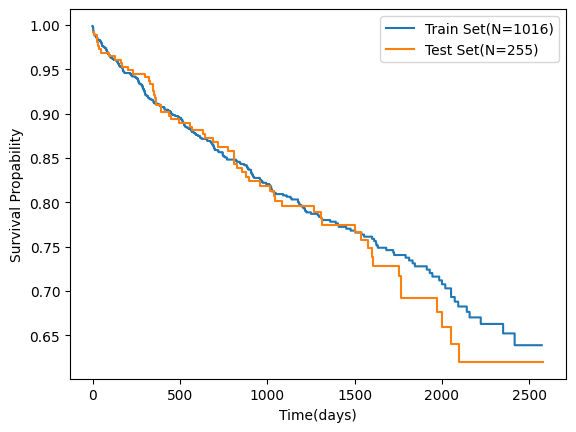

In [181]:
train=kmf.fit(durations = df_train['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = df_train['VITALSTATUS'], label = 'Train Set(N=1016)')
kmf.plot(ci_show=False)

test=kmf.fit(durations = df_test['INTERVAL_DIAG_TO_VS'].astype(int), event_observed = df_test['VITALSTATUS'], label = 'Test Set(N=255)')
kmf.plot(ci_show=False)
plt.xlabel('Time(days)')
plt.ylabel('Survival Propability')

TTresults = logrank_test(df_train['INTERVAL_DIAG_TO_VS'], df_test['INTERVAL_DIAG_TO_VS'],
                       event_observed_A = df_train['VITALSTATUS'].astype(int),
                       event_observed_B = df_test['VITALSTATUS'].astype(int))
TTresults.print_summary()

In [182]:
from sklearn.model_selection import StratifiedKFold

def objective(trial):
    X_train, X_test, y_train, y_test=train_test_split(X, y, train_size=0.8, shuffle=True, random_state=8)
    
    param_grid = {
        "n_alphas": trial.suggest_int("n_alphas", 1, 500),
        "l1_ratio": trial.suggest_float("l1_ratio", 0.001, 0.999),
        "max_iter": trial.suggest_int("max_iter", 30000, 200000),
       
    }
    coxnet = CoxnetSurvivalAnalysis(fit_baseline_model=True, **param_grid)
    coxnet.fit(
        X_train,
        y_train,
             
    )
#     survs = coxnet.predict_survival_function(X)
#     times=np.arange(0.001, 2191)
#     preds=np.asarray([[fn(t) for t in times] for fn in survs])
#     BS=integrated_brier_score(y, y, preds, times)
#     scores=BS
    scores = coxnet.score(X_test, y_test)
    pred_gb = coxnet.predict(X_test)
    return scores

## not much change with CV, not necessary to try

In [183]:
# from sklearn.model_selection import StratifiedKFold

# def objective(trial):
# #     X_train, X_test, y_train, y_test=train_test_split(X, y, train_size=0.8)
    
#     param_grid = {
#         "n_alphas": trial.suggest_int("n_alphas", 1, 1000),
#         "l1_ratio": trial.suggest_float("l1_ratio", 0.001, 0.999),
#         "max_iter": trial.suggest_int("max_iter", 300, 200000),
       
#     }
#     cv=StratifiedKFold(n_splits=5,shuffle=True, random_state=8)
#     cv_scores=np.empty(5)
#     for idx, (train_idx, test_idx) in enumerate(cv.split(X,y)):
#         X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
#         y_train, y_val = y[train_idx], y[test_idx]
    
#         coxnet = CoxnetSurvivalAnalysis(fit_baseline_model=True, **param_grid)
#         coxnet.fit(
#             X_train,
#             y_train,
             
#     )
# #     preds = model.predict(X_val)
#         cv_scores = coxnet.score(X_train, y_train)
    
#     return np.mean(cv_scores)

In [184]:
from sksurv.linear_model import CoxnetSurvivalAnalysis
import optuna
study = optuna.create_study(direction="maximize", study_name="Cox Net") 
study.optimize(objective, n_trials=50)

[I 2023-03-10 19:22:12,246] A new study created in memory with name: Cox Net
[I 2023-03-10 19:22:12,596] Trial 0 finished with value: 0.6950434940195723 and parameters: {'n_alphas': 254, 'l1_ratio': 0.9235714350721478, 'max_iter': 110169}. Best is trial 0 with value: 0.6950434940195723.
[I 2023-03-10 19:22:12,990] Trial 1 finished with value: 0.6950434940195723 and parameters: {'n_alphas': 373, 'l1_ratio': 0.34253801643047965, 'max_iter': 109387}. Best is trial 0 with value: 0.6950434940195723.
[I 2023-03-10 19:22:13,274] Trial 2 finished with value: 0.6950434940195723 and parameters: {'n_alphas': 186, 'l1_ratio': 0.9844451103860835, 'max_iter': 152663}. Best is trial 0 with value: 0.6950434940195723.
[I 2023-03-10 19:22:13,478] Trial 3 finished with value: 0.6950434940195723 and parameters: {'n_alphas': 104, 'l1_ratio': 0.40267636833748116, 'max_iter': 112083}. Best is trial 0 with value: 0.6950434940195723.
[I 2023-03-10 19:22:13,853] Trial 4 finished with value: 0.6950434940195723 a

[I 2023-03-10 19:22:23,462] Trial 36 finished with value: 0.6950434940195723 and parameters: {'n_alphas': 404, 'l1_ratio': 0.07532897208481579, 'max_iter': 141519}. Best is trial 25 with value: 0.7439289597680319.
[I 2023-03-10 19:22:23,596] Trial 37 finished with value: 0.7412105835447625 and parameters: {'n_alphas': 32, 'l1_ratio': 0.15401462114952705, 'max_iter': 122084}. Best is trial 25 with value: 0.7439289597680319.
[I 2023-03-10 19:22:23,874] Trial 38 finished with value: 0.6950434940195723 and parameters: {'n_alphas': 189, 'l1_ratio': 0.0855022002072725, 'max_iter': 136125}. Best is trial 25 with value: 0.7439289597680319.
[I 2023-03-10 19:22:24,222] Trial 39 finished with value: 0.6950434940195723 and parameters: {'n_alphas': 305, 'l1_ratio': 0.29471437424168995, 'max_iter': 101600}. Best is trial 25 with value: 0.7439289597680319.
[I 2023-03-10 19:22:24,535] Trial 40 finished with value: 0.6950434940195723 and parameters: {'n_alphas': 245, 'l1_ratio': 0.18822675812331072, 'm

In [185]:
for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

		n_alphas: 197
		l1_ratio: 0.008273657786296842
		max_iter: 135658


In [186]:
coxnet=CoxnetSurvivalAnalysis(fit_baseline_model=True, **study.best_params).fit(X_train,y_train)

In [187]:
coxnet.score(X_train, y_train)

0.793789504067483

In [188]:
coxnet.score(X_test, y_test)

0.7439289597680319

In [189]:
from sksurv.metrics import brier_score, integrated_brier_score, cumulative_dynamic_auc
survs = coxnet.predict_survival_function(X)
times=np.arange(0.001, 2191)
preds=np.asarray([[fn(t) for t in times] for fn in survs])
BS=integrated_brier_score(y, y, preds, times)
BS

0.11244252494546256

In [190]:
times=np.arange(0.001, 2191, 100)
net_chf = coxnet.predict_cumulative_hazard_function(X_val,return_array=False)
net_risk_scores = np.row_stack([chf(times) for chf in net_chf])

net_auc, net_mean_auc = cumulative_dynamic_auc(y_train, y_val, net_risk_scores, times)

# plot cumulative dynamic auc
fig, ax = plt.subplots()
plt.plot(times, net_auc, "o-", label="Elastic Net COX (mean AUC = {:.3f})".format(net_mean_auc))
plt.xlabel('days from Diagnosis')
plt.ylabel('time-dependent AUC')
plt.legend(loc='lower center')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

NameError: name 'y_val' is not defined

In [108]:
optuna.visualization.plot_param_importances(study)

In [109]:
fig=optuna.visualization.plot_optimization_history(study)
fig.update_layout(title='Cox Net Optimizing C-index history')

## RSF

In [97]:
# constrcut df
df_rsf=df_cox  
df_rsf['VITALSTATUS'].replace('1','True',inplace=True)
df_rsf['VITALSTATUS'].replace('0','False',inplace=True)

In [98]:
# build train and test
from sksurv.datasets import get_x_y
X, y = get_x_y(df_rsf, attr_labels=['VITALSTATUS','INTERVAL_DIAG_TO_VS'], pos_label=True, survival=True)

# Save feature names as a list, if eli5 package could run
X_list=list(X.columns)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=8)
# val is just for SurvSHAP's setting, does not influence formal training
X_val=X_train.sample(frac=0.25)

## Try optuna on RSF

In [99]:
from sksurv.ensemble import RandomSurvivalForest
from sklearn.model_selection import StratifiedKFold

def objective(trial):
    X_train, X_test, y_train, y_test=train_test_split(X, y, train_size=0.8)
    
    param_grid = {
        "n_estimators": trial.suggest_int("n_estimators", 50, 2000),
        "max_features": trial.suggest_categorical("max_features", ['sqrt', 'log2', 'auto']),
        "max_depth": trial.suggest_int("max_depth", 3, 48),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 16),
        "min_samples_split": trial.suggest_int("min_samples_split", 2, 16),
        "random_state": 8,
    }
    model = RandomSurvivalForest(oob_score=True, **param_grid)
    model.fit(
        X_train,
        y_train,
             
    )
#     gb_chf = model.predict_cumulative_hazard_function(X_val,return_array=False)
#     gb_risk_scores = np.row_stack([chf(times) for chf in gb_chf])
#     gb_auc, gb_mean_auc = cumulative_dynamic_auc(y_train, y_val, gb_risk_scores, times)
#     scores = gb_mean_auc
    
#     survs = model.predict_survival_function(X)
#     times=np.arange(0.001, 2191)
#     preds=np.asarray([[fn(t) for t in times] for fn in survs])
#     BS=integrated_brier_score(y, y, preds, times)
    scores=model.score(X_test,y_test)
    pred_gb = model.predict(X_test)
    return scores

In [100]:
import optuna
study = optuna.create_study(direction="maximize", study_name="Random Forest") 
study.optimize(objective, n_trials=50)

[I 2023-02-17 06:22:35,588] A new study created in memory with name: Random Forest
[I 2023-02-17 06:22:38,122] Trial 0 finished with value: 0.810315993310448 and parameters: {'n_estimators': 561, 'max_features': 'sqrt', 'max_depth': 5, 'min_samples_leaf': 7, 'min_samples_split': 13}. Best is trial 0 with value: 0.810315993310448.
[I 2023-02-17 06:22:48,366] Trial 1 finished with value: 0.7595293486041518 and parameters: {'n_estimators': 1712, 'max_features': 'sqrt', 'max_depth': 33, 'min_samples_leaf': 5, 'min_samples_split': 5}. Best is trial 0 with value: 0.810315993310448.
[I 2023-02-17 06:22:52,077] Trial 2 finished with value: 0.7442305850809154 and parameters: {'n_estimators': 804, 'max_features': 'sqrt', 'max_depth': 26, 'min_samples_leaf': 12, 'min_samples_split': 14}. Best is trial 0 with value: 0.810315993310448.
[I 2023-02-17 06:22:52,417] Trial 3 finished with value: 0.8288941859260027 and parameters: {'n_estimators': 74, 'max_features': 'auto', 'max_depth': 42, 'min_sample

[I 2023-02-17 06:24:32,057] Trial 31 finished with value: 0.7569224265482984 and parameters: {'n_estimators': 1234, 'max_features': 'sqrt', 'max_depth': 29, 'min_samples_leaf': 11, 'min_samples_split': 5}. Best is trial 3 with value: 0.8288941859260027.
[I 2023-02-17 06:24:37,349] Trial 32 finished with value: 0.8471598672652743 and parameters: {'n_estimators': 1223, 'max_features': 'sqrt', 'max_depth': 23, 'min_samples_leaf': 14, 'min_samples_split': 4}. Best is trial 32 with value: 0.8471598672652743.
[I 2023-02-17 06:24:44,118] Trial 33 finished with value: 0.76361585562359 and parameters: {'n_estimators': 1524, 'max_features': 'sqrt', 'max_depth': 22, 'min_samples_leaf': 14, 'min_samples_split': 4}. Best is trial 32 with value: 0.8471598672652743.
[I 2023-02-17 06:24:49,181] Trial 34 finished with value: 0.7805492208285822 and parameters: {'n_estimators': 1177, 'max_features': 'sqrt', 'max_depth': 7, 'min_samples_leaf': 16, 'min_samples_split': 2}. Best is trial 32 with value: 0.84

In [101]:
fig=optuna.visualization.plot_optimization_history(study)
fig.update_layout(title='RSF Optimizing C-index history')

In [102]:
for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

		n_estimators: 1001
		max_features: sqrt
		max_depth: 23
		min_samples_leaf: 14
		min_samples_split: 3


In [103]:
RSF=RandomSurvivalForest(oob_score=True, **study.best_params).fit(X_train,y_train)

In [104]:
optuna.visualization.plot_param_importances(study)

In [105]:
RSF.score(X_train, y_train)

0.8282762236320474

In [107]:
RSF.score(X_test, y_test)

0.768031895614353

In [160]:
from sksurv.metrics import integrated_brier_score, cumulative_dynamic_auc
survs = RSF.predict_survival_function(X)
times=np.arange(0.001, 2191)
preds=np.asarray([[fn(t) for t in times] for fn in survs])
BS=integrated_brier_score(y, y, preds, times)
BS

0.0434893741390117

Text(0, 0.5, 'Survival Probability')

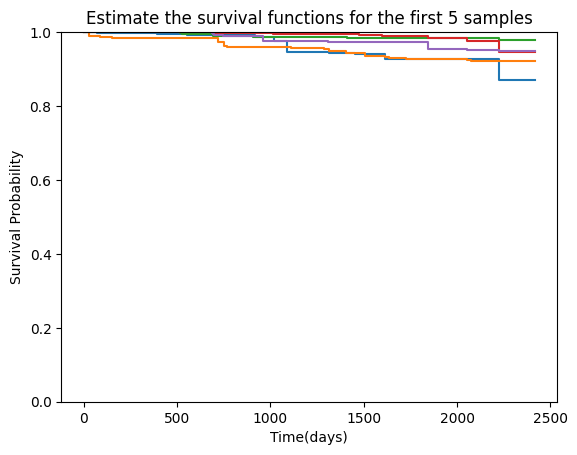

In [161]:
surv_funcs=RSF.predict_survival_function(X.iloc[:5])
for fn in surv_funcs:
    plt.step(fn.x, fn(fn.x), where='post')
plt.ylim(0,1)
plt.title('Estimate the survival functions for the first 5 samples')
plt.xlabel('Time(days)')
plt.ylabel('Survival Probability')

### time dependent auc

In [ ]:
# in train/test set the max interval is 2416
times=np.arange(0.001, 2191, 100)
rsf_chf = RSF.predict_cumulative_hazard_function(X_val,return_array=False)
rsf_risk_scores = np.row_stack([chf(times) for chf in rsf_chf])

rsf_auc, rsf_mean_auc = cumulative_dynamic_auc(y_train, y_val, rsf_risk_scores, times)

# plot cumulative dynamic auc
fig, ax = plt.subplots()
plt.plot(times, rsf_auc, "o-", label="RSF (mean AUC = {:.3f})".format(rsf_mean_auc))
plt.xlabel('days from Diagnosis')
plt.ylabel('time-dependent AUC')
plt.legend(loc='lower center')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)


## Feature importance rank

In [ ]:
from sklearn.inspection import permutation_importance

result=permutation_importance(RSF, X_val, y_val, n_repeats=15, random_state=8)

In [ ]:
pd.DataFrame({k: result[k] for k in ("importances_mean", "importances_std")},
            index=X_val.columns).sort_values(by='importances_mean', ascending=False)

## Kernel SVM + GridSearch

### linear kernel

In [ ]:
from sklearn.model_selection import ShuffleSplit,StratifiedKFold
from sksurv.metrics import concordance_index_censored
from sksurv.datasets import get_x_y
from sksurv.svm import FastKernelSurvivalSVM

def objective(trial):
    X_train, X_test, y_train, y_test=train_test_split(X, y, train_size=0.8)
    
    param_grid = {
        "alpha": trial.suggest_float("alpha", 0.0000001, 10000000),
        "optimizer": trial.suggest_categorical("optimizer", ['avltree', 'rbtree']),
        "max_iter": trial.suggest_int("max_iter", 10, 100),
        "fit_intercept": trial.suggest_categorical("fit_intercept", ['True', 'False']),
        "rank_ratio": trial.suggest_float("rank_ratio", 0.01, 1),
        "random_state": 8,
    }
    model = FastKernelSurvivalSVM(kernel='linear', **param_grid)
    model.fit(
        X_train,
        y_train,
             
    )
    scores=model.score(X_val,y_val)
    return scores


In [184]:
import optuna
study = optuna.create_study(direction="maximize", study_name="Linear SVM") 
func= lambda trial: objective(trial, X, y)
study.optimize(objective, n_trials=50)

[I 2023-02-02 14:10:33,973] A new study created in memory with name: Linear SVM
[I 2023-02-02 14:10:34,157] Trial 0 finished with value: 0.6952700253715114 and parameters: {'alpha': 3157740.1824641544, 'optimizer': 'avltree', 'max_iter': 65, 'fit_intercept': 'True', 'rank_ratio': 0.606678585845728}. Best is trial 0 with value: 0.6952700253715114.
[I 2023-02-02 14:10:34,300] Trial 1 finished with value: 0.6952700253715114 and parameters: {'alpha': 963508.1598545295, 'optimizer': 'avltree', 'max_iter': 58, 'fit_intercept': 'False', 'rank_ratio': 0.6829439265384468}. Best is trial 0 with value: 0.6952700253715114.
[I 2023-02-02 14:10:34,495] Trial 2 finished with value: 0.6953606379122871 and parameters: {'alpha': 5618135.3090592455, 'optimizer': 'rbtree', 'max_iter': 45, 'fit_intercept': 'True', 'rank_ratio': 0.18067938637034553}. Best is trial 2 with value: 0.6953606379122871.
[I 2023-02-02 14:10:34,652] Trial 3 finished with value: 0.6953606379122871 and parameters: {'alpha': 4730922.5

[I 2023-02-02 14:10:40,255] Trial 29 finished with value: 0.6952700253715114 and parameters: {'alpha': 4843688.130281858, 'optimizer': 'avltree', 'max_iter': 69, 'fit_intercept': 'True', 'rank_ratio': 0.5921682248763935}. Best is trial 24 with value: 0.6954512504530627.
[I 2023-02-02 14:10:40,421] Trial 30 finished with value: 0.6951794128307358 and parameters: {'alpha': 7393493.283770276, 'optimizer': 'rbtree', 'max_iter': 51, 'fit_intercept': 'True', 'rank_ratio': 0.4305355920753735}. Best is trial 24 with value: 0.6954512504530627.
[I 2023-02-02 14:10:40,588] Trial 31 finished with value: 0.6951794128307358 and parameters: {'alpha': 8984901.511288103, 'optimizer': 'rbtree', 'max_iter': 61, 'fit_intercept': 'True', 'rank_ratio': 0.5271184597415263}. Best is trial 24 with value: 0.6954512504530627.
[I 2023-02-02 14:10:40,731] Trial 32 finished with value: 0.6953606379122871 and parameters: {'alpha': 7648521.865230927, 'optimizer': 'rbtree', 'max_iter': 66, 'fit_intercept': 'True', 'ra

In [185]:
for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

		alpha: 7510604.764911803
		optimizer: rbtree
		max_iter: 74
		fit_intercept: True
		rank_ratio: 0.739454035686267


In [187]:
LSVM = FastKernelSurvivalSVM(kernel='linear', **study.best_params).fit(X_train,y_train)

In [189]:
LSVM.score(X_train, y_train)

0.7351894722580569

In [190]:
LSVM.score(X_val,y_val)

0.6951794128307358

### poly kernel

In [203]:
# build studies for each kernel 
def objective(trial):
    X_train, X_test, y_train, y_test=train_test_split(X, y, train_size=0.8)
    
    param_grid = {
        "degree": trial.suggest_int("degree", 1, 6),
        "coef0": trial.suggest_float("coef0", 0.001, 2.999),
        "gamma": trial.suggest_float("gamma", 0.001, 2.999),
        "alpha": trial.suggest_float("alpha", 0.0000001, 10000000),
        "optimizer": trial.suggest_categorical("optimizer", ['avltree', 'rbtree']),
        "max_iter": trial.suggest_int("max_iter", 10, 100),
        "fit_intercept": trial.suggest_categorical("fit_intercept", ['True', 'False']),
        "rank_ratio": trial.suggest_float("rank_ratio", 0.01, 1),
        "random_state": 8,
    }
    model = FastKernelSurvivalSVM(kernel='poly', **param_grid)
    model.fit(
        X_train,
        y_train,
             
    )
    scores=model.score(X_val,y_val)
    return scores

import optuna
study = optuna.create_study(direction="maximize", study_name="poly SVM") 
func= lambda trial: objective(trial, X, y)
study.optimize(objective, n_trials=50)

[I 2023-02-02 14:28:37,829] A new study created in memory with name: poly SVM
[I 2023-02-02 14:28:37,991] Trial 0 finished with value: 0.6959043131569409 and parameters: {'degree': 3, 'coef0': 1.2439225567876893, 'gamma': 2.240935701988029, 'alpha': 2304240.7521799793, 'optimizer': 'rbtree', 'max_iter': 93, 'fit_intercept': 'False', 'rank_ratio': 0.6380943259499773}. Best is trial 0 with value: 0.6959043131569409.
[I 2023-02-02 14:28:38,284] Trial 1 finished with value: 0.6956324755346139 and parameters: {'degree': 6, 'coef0': 2.4056820170257196, 'gamma': 1.6709281655709607, 'alpha': 5385847.998697044, 'optimizer': 'rbtree', 'max_iter': 36, 'fit_intercept': 'False', 'rank_ratio': 0.17914254953769088}. Best is trial 0 with value: 0.6959043131569409.
[I 2023-02-02 14:28:38,545] Trial 2 finished with value: 0.6957230880753896 and parameters: {'degree': 4, 'coef0': 2.013451437719627, 'gamma': 0.6166009572591153, 'alpha': 8352947.735405852, 'optimizer': 'avltree', 'max_iter': 92, 'fit_inter

[I 2023-02-02 14:28:42,447] Trial 23 finished with value: 0.6953606379122871 and parameters: {'degree': 2, 'coef0': 0.7260909235002203, 'gamma': 1.7068021319045936, 'alpha': 2708066.121751749, 'optimizer': 'rbtree', 'max_iter': 85, 'fit_intercept': 'False', 'rank_ratio': 0.09704236497136343}. Best is trial 8 with value: 0.6988945270025372.
[I 2023-02-02 14:28:42,666] Trial 24 finished with value: 0.6958137006161653 and parameters: {'degree': 3, 'coef0': 0.40283211449056994, 'gamma': 2.474772895929447, 'alpha': 5747197.024404004, 'optimizer': 'rbtree', 'max_iter': 71, 'fit_intercept': 'False', 'rank_ratio': 0.26581424296137807}. Best is trial 8 with value: 0.6988945270025372.
[I 2023-02-02 14:28:42,937] Trial 25 finished with value: 0.6957230880753896 and parameters: {'degree': 4, 'coef0': 1.288463769794779, 'gamma': 1.3218691177618462, 'alpha': 4625726.335218208, 'optimizer': 'rbtree', 'max_iter': 59, 'fit_intercept': 'False', 'rank_ratio': 0.13204531661708477}. Best is trial 8 with va

[I 2023-02-02 14:28:47,894] Trial 47 finished with value: 0.6956324755346139 and parameters: {'degree': 6, 'coef0': 2.0529398579803115, 'gamma': 0.24419741206360868, 'alpha': 1771789.9046672261, 'optimizer': 'avltree', 'max_iter': 20, 'fit_intercept': 'False', 'rank_ratio': 0.5591191967903357}. Best is trial 8 with value: 0.6988945270025372.
[I 2023-02-02 14:28:48,218] Trial 48 finished with value: 0.6958137006161653 and parameters: {'degree': 5, 'coef0': 2.240366732067549, 'gamma': 0.009955056292098252, 'alpha': 8436730.150240125, 'optimizer': 'rbtree', 'max_iter': 97, 'fit_intercept': 'True', 'rank_ratio': 0.7565025507582754}. Best is trial 8 with value: 0.6988945270025372.
[I 2023-02-02 14:28:48,715] Trial 49 finished with value: 0.6957230880753896 and parameters: {'degree': 4, 'coef0': 1.9386421068849018, 'gamma': 0.4266473282379434, 'alpha': 2561790.394048363, 'optimizer': 'rbtree', 'max_iter': 75, 'fit_intercept': 'False', 'rank_ratio': 0.48709161796459005}. Best is trial 8 with 

In [204]:
for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

		degree: 1
		coef0: 1.968452447010152
		gamma: 0.028940665937832746
		alpha: 7501825.724073255
		optimizer: rbtree
		max_iter: 12
		fit_intercept: True
		rank_ratio: 0.1963020050550073


In [205]:
polySVM = FastKernelSurvivalSVM(kernel='poly', **study.best_params).fit(X_train,y_train)

In [206]:
# c index on train set
polySVM.score(X_train, y_train)

0.7401670583938597

In [207]:
# c index on test set
polySVM.score(X_val, y_val)

0.6982602392171077

### sigmoid kernel

In [213]:
def objective(trial):
    X_train, X_test, y_train, y_test=train_test_split(X, y, train_size=0.8)
    
    param_grid = {
        "degree": trial.suggest_int("degree", 1, 6),
        "coef0": trial.suggest_float("coef0", 0.001, 2.999),
        "alpha": trial.suggest_float("alpha", 0.0000001, 10000000),
        "optimizer": trial.suggest_categorical("optimizer", ['avltree', 'rbtree']),
        "max_iter": trial.suggest_int("max_iter", 10, 100),
        "fit_intercept": trial.suggest_categorical("fit_intercept", ['True', 'False']),
        "rank_ratio": trial.suggest_float("rank_ratio", 0.01, 1),
        "random_state": 8,
    }
    model = FastKernelSurvivalSVM(kernel='sigmoid', **param_grid)
    model.fit(
        X_train,
        y_train,
             
    )
    scores=model.score(X_val,y_val)
    return scores

import optuna
study = optuna.create_study(direction="maximize", study_name="sigmoid SVM") 
func= lambda trial: objective(trial, X, y)
study.optimize(objective, n_trials=100)

[I 2023-02-02 14:32:09,111] A new study created in memory with name: sigmoid SVM
[I 2023-02-02 14:32:09,353] Trial 0 finished with value: 0.5 and parameters: {'degree': 5, 'coef0': 0.9933821517000164, 'alpha': 5830996.727568854, 'optimizer': 'avltree', 'max_iter': 90, 'fit_intercept': 'False', 'rank_ratio': 0.4936335127725199}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:09,544] Trial 1 finished with value: 0.5 and parameters: {'degree': 4, 'coef0': 0.14996920876218336, 'alpha': 1903538.3221975218, 'optimizer': 'avltree', 'max_iter': 63, 'fit_intercept': 'True', 'rank_ratio': 0.15446521500930435}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:09,695] Trial 2 finished with value: 0.5 and parameters: {'degree': 5, 'coef0': 1.5937046808708548, 'alpha': 2133713.2713385453, 'optimizer': 'avltree', 'max_iter': 65, 'fit_intercept': 'True', 'rank_ratio': 0.8100402537438502}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:09,842] Trial 3 finished with value: 0.5 and parame

[I 2023-02-02 14:32:14,886] Trial 28 finished with value: 0.5 and parameters: {'degree': 3, 'coef0': 0.7600138774923368, 'alpha': 924066.826675518, 'optimizer': 'avltree', 'max_iter': 75, 'fit_intercept': 'False', 'rank_ratio': 0.3403189042104615}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:15,103] Trial 29 finished with value: 0.5 and parameters: {'degree': 6, 'coef0': 1.044769472055003, 'alpha': 5400499.684088884, 'optimizer': 'rbtree', 'max_iter': 79, 'fit_intercept': 'True', 'rank_ratio': 0.4597025034166568}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:15,279] Trial 30 finished with value: 0.5 and parameters: {'degree': 5, 'coef0': 0.9202433080162175, 'alpha': 1971244.1477643403, 'optimizer': 'avltree', 'max_iter': 44, 'fit_intercept': 'True', 'rank_ratio': 0.465831019468126}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:15,468] Trial 31 finished with value: 0.5 and parameters: {'degree': 6, 'coef0': 1.1743128655927322, 'alpha': 4865344.480898225, 'optimi

[I 2023-02-02 14:32:20,813] Trial 56 finished with value: 0.5 and parameters: {'degree': 6, 'coef0': 0.40796129537336445, 'alpha': 1602418.663860291, 'optimizer': 'avltree', 'max_iter': 99, 'fit_intercept': 'True', 'rank_ratio': 0.12717172792436965}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:21,009] Trial 57 finished with value: 0.5 and parameters: {'degree': 4, 'coef0': 1.8076002465401626, 'alpha': 3991151.391316518, 'optimizer': 'avltree', 'max_iter': 46, 'fit_intercept': 'False', 'rank_ratio': 0.4308249136105929}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:21,209] Trial 58 finished with value: 0.5 and parameters: {'degree': 5, 'coef0': 1.532943045387769, 'alpha': 2932178.146485416, 'optimizer': 'avltree', 'max_iter': 77, 'fit_intercept': 'True', 'rank_ratio': 0.7249124435879856}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:21,398] Trial 59 finished with value: 0.5 and parameters: {'degree': 6, 'coef0': 1.2516307807417364, 'alpha': 5148240.56851238, 'opt

[I 2023-02-02 14:32:26,538] Trial 84 finished with value: 0.5 and parameters: {'degree': 6, 'coef0': 0.3486096778779958, 'alpha': 8525526.072494345, 'optimizer': 'rbtree', 'max_iter': 67, 'fit_intercept': 'False', 'rank_ratio': 0.6804245472474448}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:26,737] Trial 85 finished with value: 0.5 and parameters: {'degree': 5, 'coef0': 0.3176322118569992, 'alpha': 9798468.36285895, 'optimizer': 'rbtree', 'max_iter': 17, 'fit_intercept': 'False', 'rank_ratio': 0.2372833008735581}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:26,934] Trial 86 finished with value: 0.5 and parameters: {'degree': 5, 'coef0': 0.5927993518296335, 'alpha': 5090387.978204548, 'optimizer': 'avltree', 'max_iter': 92, 'fit_intercept': 'False', 'rank_ratio': 0.36489259489319914}. Best is trial 0 with value: 0.5.
[I 2023-02-02 14:32:27,156] Trial 87 finished with value: 0.5 and parameters: {'degree': 6, 'coef0': 1.2653564550069984, 'alpha': 4160386.8437623642, 'op

In [209]:
for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

		degree: 1
		coef0: 1.6586571922211706
		alpha: 2194652.39883413
		optimizer: rbtree
		max_iter: 59
		fit_intercept: False
		rank_ratio: 0.5173881121442793


In [210]:
sigmoidSVM = FastKernelSurvivalSVM(kernel='sigmoid', **study.best_params).fit(X_train,y_train)

In [211]:
# c index on train set
sigmoidSVM.score(X_train, y_train)

0.5

In [212]:
sigmoidSVM.score(X_val, y_val)

0.5

### rbf kernel

In [214]:
def objective(trial):
    X_train, X_test, y_train, y_test=train_test_split(X, y, train_size=0.8)
    
    param_grid = {
        "degree": trial.suggest_int("degree", 1, 8),
        "coef0": trial.suggest_float("coef0", 0.001, 2.999),
        "gamma": trial.suggest_float("gamma", 0.001, 2.999),
        "alpha": trial.suggest_float("alpha", 0.0000001, 10000000),
        "optimizer": trial.suggest_categorical("optimizer", ['avltree', 'rbtree']),
        "max_iter": trial.suggest_int("max_iter", 10, 100),
        "fit_intercept": trial.suggest_categorical("fit_intercept", ['True', 'False']),
        "rank_ratio": trial.suggest_float("rank_ratio", 0.01, 1),
        "random_state": 8,
    }
    model = FastKernelSurvivalSVM(kernel='rbf', **param_grid)
    model.fit(
        X_train,
        y_train,
             
    )
    scores=model.score(X_val,y_val)
    return scores

import optuna
study = optuna.create_study(direction="maximize", study_name="rbf SVM") 
func= lambda trial: objective(trial, X, y)
study.optimize(objective, n_trials=25)

[I 2023-02-02 14:34:24,337] A new study created in memory with name: rbf SVM
[I 2023-02-02 14:34:31,523] Trial 0 finished with value: 0.9546031170714027 and parameters: {'degree': 3, 'coef0': 2.5682758858576302, 'gamma': 0.9063921904923724, 'alpha': 9050427.613733206, 'optimizer': 'rbtree', 'max_iter': 61, 'fit_intercept': 'True', 'rank_ratio': 0.7356049004130923}. Best is trial 0 with value: 0.9546031170714027.
[I 2023-02-02 14:34:37,046] Trial 1 finished with value: 0.9625770206596593 and parameters: {'degree': 4, 'coef0': 1.8277653133169782, 'gamma': 1.1493649182672938, 'alpha': 3116115.227336783, 'optimizer': 'rbtree', 'max_iter': 88, 'fit_intercept': 'False', 'rank_ratio': 0.6481722653322316}. Best is trial 1 with value: 0.9625770206596593.
/tmp/ipykernel_3257155/1583981779.py:16: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

[I 2023-02-02 14:34:39,151] Trial 2 finished with value: 0.9732693004711852 and parameters: {

[I 2023-02-02 14:36:31,309] Trial 21 finished with value: 0.9625770206596593 and parameters: {'degree': 6, 'coef0': 1.9757900485075706, 'gamma': 2.358818901447914, 'alpha': 1904793.2374809394, 'optimizer': 'rbtree', 'max_iter': 74, 'fit_intercept': 'True', 'rank_ratio': 0.5170199404218568}. Best is trial 12 with value: 0.9765313519391083.
[I 2023-02-02 14:36:34,731] Trial 22 finished with value: 0.9571402682131207 and parameters: {'degree': 6, 'coef0': 1.268441908552349, 'gamma': 2.5813113132380736, 'alpha': 340434.27269917727, 'optimizer': 'rbtree', 'max_iter': 54, 'fit_intercept': 'True', 'rank_ratio': 0.30299182599681307}. Best is trial 12 with value: 0.9765313519391083.
[I 2023-02-02 14:36:40,331] Trial 23 finished with value: 0.9732693004711852 and parameters: {'degree': 5, 'coef0': 2.9808493112353345, 'gamma': 1.8609540213849534, 'alpha': 2157125.7338768323, 'optimizer': 'rbtree', 'max_iter': 97, 'fit_intercept': 'True', 'rank_ratio': 0.7540612713658609}. Best is trial 12 with va

[I 2023-02-02 14:42:12,256] Trial 44 finished with value: 0.9511598405219283 and parameters: {'degree': 4, 'coef0': 0.22667186188805089, 'gamma': 2.292862884838112, 'alpha': 9500056.08204958, 'optimizer': 'avltree', 'max_iter': 66, 'fit_intercept': 'True', 'rank_ratio': 0.8189736750247132}. Best is trial 37 with value: 0.9783436027546213.
[I 2023-02-02 14:42:17,802] Trial 45 finished with value: 0.9711852120333454 and parameters: {'degree': 2, 'coef0': 0.0031101623939553402, 'gamma': 2.092888686526936, 'alpha': 2960638.606974237, 'optimizer': 'avltree', 'max_iter': 86, 'fit_intercept': 'False', 'rank_ratio': 0.8356448248764837}. Best is trial 37 with value: 0.9783436027546213.
[I 2023-02-02 14:42:22,533] Trial 46 finished with value: 0.9593149691917361 and parameters: {'degree': 3, 'coef0': 0.40051681343716283, 'gamma': 2.6011981126099633, 'alpha': 2002994.486481332, 'optimizer': 'avltree', 'max_iter': 81, 'fit_intercept': 'True', 'rank_ratio': 0.7894763037693473}. Best is trial 37 wit

In [215]:
for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

		degree: 4
		coef0: 0.12952977422852852
		gamma: 2.8396711830183845
		alpha: 1623345.7090551115
		optimizer: avltree
		max_iter: 83
		fit_intercept: False
		rank_ratio: 0.7997269035629546


In [217]:
rbfSVM = FastKernelSurvivalSVM(kernel='rbf', **study.best_params).fit(X_train,y_train)

In [218]:
# c index on train set
rbfSVM.score(X_train, y_train)

0.9955437350156986

In [219]:
# c index on test set
rbfSVM.score(X_val, y_val)

0.6987133019209859

## try if CV could change something

In [222]:
from sklearn.model_selection import StratifiedKFold

def objective(trial):
    
    param_grid = {
        "degree": trial.suggest_int("degree", 1, 8),
        "coef0": trial.suggest_float("coef0", 0.001, 2.999),
        "gamma": trial.suggest_float("gamma", 0.001, 2.999),
        "alpha": trial.suggest_float("alpha", 0.0000001, 10000000),
        "optimizer": trial.suggest_categorical("optimizer", ['avltree', 'rbtree']),
        "max_iter": trial.suggest_int("max_iter", 10, 24),
        "fit_intercept": trial.suggest_categorical("fit_intercept", ['True', 'False']),
        "rank_ratio": trial.suggest_float("rank_ratio", 0.01, 1),
        "random_state": 8,
    }
    cv=StratifiedKFold(n_splits=5,shuffle=True, random_state=8)
    cv_scores=np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X,y)):
        X_train, X_val = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_val = y[train_idx], y[test_idx]
    
        model = FastKernelSurvivalSVM(kernel='rbf', **param_grid)
        model.fit(
            X_train,
            y_train)
                     
        cv_scores = model.score(X_val, y_val)
    
    return np.mean(cv_scores)

study = optuna.create_study(direction="maximize", study_name="rbf SVM") 
study.optimize(objective, n_trials=15)

[I 2023-02-02 15:02:35,660] A new study created in memory with name: rbf SVM
/opt/python/3.10.9/lib/python3.10/site-packages/sklearn/model_selection/_split.py:684: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has 

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

[I 2023-02-02 15:04:30,329] Trial 6 finished with value: 0.6563631546409961 and parameters: {'degree': 7, 'coef0': 2.3848482406324947, 'gamma': 1.5053366026645663, 'alpha': 65949.76324805488, 'optimizer': 'rbtree', 'max_iter': 18, 'fit_intercept': 'False', 'rank_ratio': 0.93929502631744}. Best is trial 2 with value: 0.6734081073920339.
/opt/python/3.10.9/lib/python3.10/site-packages/sklearn/model_selection/_split.py:684: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.

/tmp/ipykernel_3257155/25

/opt/python/3.10.9/lib/python3.10/site-packages/sklearn/model_selection/_split.py:684: UserWarning:

The least populated class in y has only 1 members, which is less than n_splits=5.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/tmp/ipykernel_3257155/2570457697.py:23: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

[I 2023-02-02 15:09:15,521] Trial 14 finished with value: 0.6

In [223]:
for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

		degree: 1
		coef0: 1.8141038137028818
		gamma: 0.48699187617892004
		alpha: 3797895.467190352
		optimizer: rbtree
		max_iter: 24
		fit_intercept: False
		rank_ratio: 0.7336442442632912


In [224]:
rbfSVM = FastKernelSurvivalSVM(kernel='rbf', **study.best_params).fit(X_train,y_train)
rbfSVM.score(X_val,y_val)

/tmp/ipykernel_3257155/3464511111.py:1: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.



0.6874773468648061

## optuna SearchCV on rbf SVM

In [248]:
rbf = FastKernelSurvivalSVM(kernel='rbf', random_state=8)
param_grid = {
        "degree": optuna.distributions.IntDistribution(1, 8),
        "coef0": optuna.distributions.FloatDistribution(0.001, 2.999),
        "gamma": optuna.distributions.FloatDistribution(0.001, 2.999),
        "alpha": optuna.distributions.FloatDistribution(0.0000001, 10000000),
        "optimizer": optuna.distributions.CategoricalDistribution(['avltree', 'rbtree']),
        "max_iter": optuna.distributions.IntDistribution(10, 24),
        "fit_intercept": optuna.distributions.CategoricalDistribution(['True', 'False']),
        "rank_ratio": optuna.distributions.FloatDistribution(0.01, 1),
        } 
optuna_search=optuna.integration.OptunaSearchCV(rbf, param_grid, refit=True, cv=5)
optuna_search.fit(X,y)

/tmp/ipykernel_3257155/3865992746.py:12: ExperimentalWarning:

OptunaSearchCV is experimental (supported from v0.17.0). The interface can change in the future.

[I 2023-02-02 16:47:11,493] A new study created in memory with name: no-name-527eb654-c4bf-40cb-a3d9-25f825334979
/opt/python/3.10.9/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

[I 2023-02-02 16:47:30,413] Trial 0 finished with value: 0.705547965681624 and parameters: {'degree': 7, 'coef0': 0.9713232172672988, 'gamma': 0.9616267868574097, 'alpha': 542911.2789921643, 'optimizer': 'avltree', 'max_iter': 22, 'fit_intercept': 'True', 'rank_ratio': 0.08901542689123383}. Best is trial 0 with value: 0.705547965681624.
/opt/python/3.10.9/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations ha

/opt/python/3.10.9/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/opt/python/3.10.9/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/opt/python/3.10.9/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/opt/python/3.10.9/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.

/opt/python/3.10.9/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:686: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been e

OptunaSearchCV(estimator=FastKernelSurvivalSVM(random_state=8),
               param_distributions={'alpha': FloatDistribution(high=10000000.0, log=False, low=1e-07, step=None),
                                    'coef0': FloatDistribution(high=2.999, log=False, low=0.001, step=None),
                                    'degree': IntDistribution(high=8, log=False, low=1, step=1),
                                    'fit_intercept': CategoricalDistribution(choices=('True', 'False')),
                                    'gamma': FloatDistribution(high=2.999, log=False, low=0.001, step=None),
                                    'max_iter': IntDistribution(high=24, log=False, low=10, step=1),
                                    'optimizer': CategoricalDistribution(choices=('avltree', 'rbtree')),
                                    'rank_ratio': FloatDistribution(high=1.0, log=False, low=0.01, step=None)})

In [249]:
optuna_search.best_params_

{'degree': 1,
 'coef0': 1.9789241995074784,
 'gamma': 0.09085232982218451,
 'alpha': 7120656.588319039,
 'optimizer': 'rbtree',
 'max_iter': 12,
 'fit_intercept': 'True',
 'rank_ratio': 0.28294582614347263}

In [250]:
rbfSVM = FastKernelSurvivalSVM(kernel='rbf', **optuna_search.best_params_).fit(X_train,y_train)
rbfSVM.score(X_val,y_val)

/tmp/ipykernel_3257155/3453065665.py:1: ConvergenceWarning:

Optimization did not converge: Warning: Maximum number of iterations has been exceeded.



0.6860275462123958

## Gradient boost based on coxph loss function

In [230]:
from sksurv.ensemble import GradientBoostingSurvivalAnalysis

estimator=GradientBoostingSurvivalAnalysis(loss='coxph').fit(X_train,y_train)

param_grid={"n_estimators":[100, 500, 1000, 1500, 2000],
           "learning_rate": [0.01, 0.1],
           "max_depth":[3,6,9,12,15],
           "random_state":[8]
           }
grid=GridSearchCV(estimator, param_grid, n_jobs=-1, cv=5)

GridSearchCV(cv=5, estimator=GradientBoostingSurvivalAnalysis(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.1],
                         'max_depth': [3, 6, 9, 12, 15],
                         'n_estimators': [100, 500, 1000, 1500, 2000],
                         'random_state': [8]})

In [231]:
grid.best_params_

{'learning_rate': 0.01,
 'max_depth': 3,
 'n_estimators': 1500,
 'random_state': 8}

In [232]:
estimator=GradientBoostingSurvivalAnalysis(loss='coxph', learning_rate=0.01, max_depth=3, n_estimators=1500).fit(X_train,y_train)

In [233]:
# c index on train set
estimator.score(X_train, y_train)

0.8401370161580104

In [234]:
# c index on train set
estimator.score(X_val, y_val)

0.7603298296484233

In [236]:
survs = estimator.predict_survival_function(X)
times=np.arange(0.001, 2191)
preds=np.asarray([[fn(t) for t in times] for fn in survs])
BS=integrated_brier_score(y, y, preds, times)
BS

0.10244215177962625

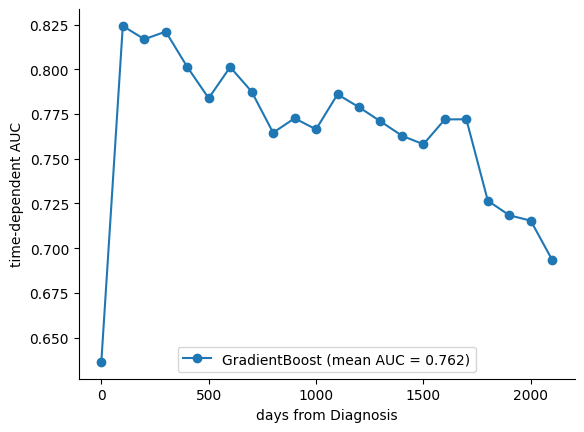

In [240]:
times=np.arange(0.001, 2191, 100)
gb_chf = estimator.predict_cumulative_hazard_function(X_val,return_array=False)
gb_risk_scores = np.row_stack([chf(times) for chf in gb_chf])

gb_auc, gb_mean_auc = cumulative_dynamic_auc(y_train, y_val, gb_risk_scores, times)

# plot cumulative dynamic auc
fig, ax = plt.subplots()
plt.plot(times, gb_auc, "o-", label="GradientBoost (mean AUC = {:.3f})".format(gb_mean_auc))
plt.xlabel('days from Diagnosis')
plt.ylabel('time-dependent AUC')
plt.legend(loc='lower center')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

In [266]:
from sklearn.model_selection import StratifiedKFold

def objective(trial):
    X_train, X_test, y_train, y_test=train_test_split(X, y, train_size=0.8)
    
    param_grid = {
        "n_estimators": trial.suggest_int("n_estimators", 300, 2000),
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.2),
        "max_depth": trial.suggest_int("max_depth", 3, 24),
        "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 8),
        "dropout_rate": trial.suggest_float("dropout_rate", 0, 0.5, step=0.1),
        "random_state": 8,
    }
    model = GradientBoostingSurvivalAnalysis(loss='coxph', **param_grid)
    model.fit(
        X_train,
        y_train,
             
    )
#     gb_chf = model.predict_cumulative_hazard_function(X_val,return_array=False)
#     gb_risk_scores = np.row_stack([chf(times) for chf in gb_chf])
#     gb_auc, gb_mean_auc = cumulative_dynamic_auc(y_train, y_val, gb_risk_scores, times)
#     scores = gb_mean_auc
    socres = model.score(X_val, y_val)
    pred_gb = model.predict(X_val)
    return scores


In [ ]:
import optuna
study = optuna.create_study(direction="maximize", study_name="Gradient Boost") 
study.optimize(objective, n_trials=15)


[I 2023-02-01 20:14:24,067] A new study created in memory with name: Gradient Boost


In [259]:
print(f"\tBest value (f1): {study.best_value:.5f}")
print(f"\tBest params:")

	Best value (f1): 0.98185
	Best params:


In [260]:
for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

		n_estimators: 872
		learning_rate: 0.15522414940569948
		max_depth: 13
		min_samples_leaf: 5
		dropout_rate: 0.0


In [261]:
GB=GradientBoostingSurvivalAnalysis(loss='coxph', **study.best_params).fit(X_train,y_train)

In [262]:
optuna.visualization.plot_param_importances(study)

In [263]:
survs = GB.predict_survival_function(X)
times=np.arange(0.001, 2191)
preds=np.asarray([[fn(t) for t in times] for fn in survs])
BS=integrated_brier_score(y, y, preds, times)
BS

0.04546707652806385

In [264]:
GB.score(X_train, y_train)

0.9942419047955655

In [265]:
GB.score(X_val, y_val)

0.6953606379122871

## survshap on RSF, source package code https://github.com/abdoush/SurvSHAP/blob/master/model.py

In [191]:
import time
import logging
import os
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import matthews_corrcoef as MCC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

from lifelines import CoxPHFitter

import pickle
from itertools import product
import shap

from sksurv.compare import compare_survival


class Loggable:
    @staticmethod
    def _configure_logger(results_folder, prefix_name, timestamp):
        name = f'Exp_{prefix_name}'
        logger = logging.getLogger(name)
        logger.setLevel(logging.INFO)
        formatter = logging.Formatter('%(asctime)s:%(message)s')
        file_handler = logging.FileHandler(f'{results_folder}/{prefix_name}_Experiment_{timestamp}.log')
        file_handler.setFormatter(formatter)
        logger.addHandler(file_handler)
        return logger

class XSurv(Loggable):
    def __init__(self, prefix_name, results_folder='Results', max_k=30, patience=3, z_explained_variance_ratio_threshold=0.99, curves_diff_significance_level=0.05, verbose=True):
        self.results_folder = results_folder + '/' + prefix_name
        if not os.path.exists(self.results_folder):
            os.makedirs(self.results_folder)

        self.prefix_name = prefix_name
        self.timestamp = time.strftime("%Y%m%d-%H%M%S")
        self.logger = self._configure_logger(results_folder=self.results_folder, prefix_name=self.prefix_name, timestamp=self.timestamp)
        self.max_k = max_k
        self.patience = patience
        self.z_explained_variance_ratio_threshold=z_explained_variance_ratio_threshold
        self.curves_diff_significance_level = curves_diff_significance_level
        self.verbose = verbose

    def fit(self, xte_data, survival_curves, event_times, pretrained_clustering_model=None, k=None):

        # explain f(x)=s by explaining h(x): z=t(s), g(z)=c, h(x)=c  , h(x)=g(t(s))

        # data prepatation x, s
        (self.x_train, self.y_train, self.e_train,
         self.x_val, self.y_val, self.e_val,
         self.x_test, self.y_test, self.e_test) = xte_data
        # special for sksurv
        dt = np.dtype('bool,float')
        self.ey_train_surv = np.array([(bool(e), y) for e, y in zip(self.e_train, self.y_train)], dtype=dt)
        self.ey_val_surv = np.array([(bool(e), y) for e, y in zip(self.e_val, self.y_val)], dtype=dt)
        self.ey_test_surv = np.array([(bool(e), y) for e, y in zip(self.e_test, self.y_test)], dtype=dt)
        self.survival_curves_train, self.survival_curves_val, self.survival_curves_test = survival_curves
        self.event_times = event_times

        # transformation to lower dimentions (s -> z), z=t(s)
        self.z_train, self.z_val, self.z_test = self._get_z()

        # clustering (z -> c), c=g(z)
        if k is None:
            self.optimal_k = self._find_optimal_clusters_number()
        else:
            self.optimal_k = k

        self.labels_train, self.labels_val, self.labels_test = self._cluster_in_z(pretrained_model=pretrained_clustering_model)

        if self.verbose:
            #self._plot_z(z, labels, label='train')
            self._plot_z(self.z_train, self.labels_train, label='train')
            self._plot_z(self.z_val, self.labels_val, label='val')
            self._plot_z(self.z_test, self.labels_test, label='test')
            self._plot_curves(curves=self.survival_curves_train, clusters=self.labels_train, event_times=self.event_times, fig_name='Concepts')
            self._plot_context(curves=self.survival_curves_train, clusters=self.labels_train, event_times=self.event_times)

        # classification (x -> c), c=h(x)
        self.classication_model = self._classify()
        self.logger.info('Classification Scores')
        self._classification_evaluation(self.classication_model, self.x_train, self.labels_train, label='Train')
        self._classification_evaluation(self.classication_model, self.x_val, self.labels_val, label='Val')
        self._classification_evaluation(self.classication_model, self.x_test, self.labels_test, label='Test')

    def _classification_evaluation(self, clf, x, y, label):
        self.logger.info(f'{label} Accuracy: {clf.score(x, y)}')
        y_pred = clf.predict(x)

        self.logger.info(f'{label} MCC: {MCC(y, y_pred)}')

        cmx = confusion_matrix(y, y_pred)
        cmx_p = cmx / np.expand_dims(cmx.sum(axis=1), axis=1)

        self.logger.info(cmx)
        self.logger.info(cmx_p)

        all_scores = precision_recall_fscore_support(y, y_pred)
        for measure, scores in zip(['Prec', 'Recall', 'F1', 'Support'], all_scores):
            self.logger.info(measure)
            for i, v in enumerate(scores):
                self.logger.info(f'Pattern_{i}: {v}')
            self.logger.info(f'Avg: {np.mean(scores)}')

    def _get_z(self):
        pca = PCA(n_components=1)
        print("shape:",self.survival_curves_train.shape[1])
        for i in range(1, self.survival_curves_train.shape[1]+1):
            pca = PCA(n_components=i)
            pca.fit(self.survival_curves_train)
            if (pca.explained_variance_ratio_.sum() >= self.z_explained_variance_ratio_threshold) or (pca.explained_variance_ratio_.sum() >= 0.999):
                self.logger.info(f'Z Space Dimensions: {i}')
                break

        z_train = pca.transform(self.survival_curves_train)
        z_val = pca.transform(self.survival_curves_val)
        z_test = pca.transform(self.survival_curves_test)
        if self.verbose:
            if z_train.shape[1] >= 2:
                fig, ax = plt.subplots(1, 3, figsize=(15, 5))
                ax[0].scatter(z_train[:, 0], z_train[:, 1], c=self._get_colors(self.e_train.astype(int)), alpha=0.1)
                ax[1].scatter(z_val[:, 0], z_val[:, 1], c=self._get_colors(self.e_val.astype(int)), alpha=0.1)
                ax[2].scatter(z_test[:, 0], z_test[:, 1], c=self._get_colors(self.e_test.astype(int)), alpha=0.1)
            else:
                plt.figure()
                plt.hist(z_train[:, 0], bins=100)
            plt.savefig(f'{self.results_folder}/{self.prefix_name}_{self.timestamp}_z.pdf', format='pdf', bbox_inches='tight')
            plt.show()
        return z_train, z_val, z_test

    def _cluster_in_z(self, pretrained_model=None):
        if pretrained_model is None:
            self.clustering_mdl = self._base_clustering_model(number_clusters=self.optimal_k).fit(self.z_train)
            pickle.dump(self.clustering_mdl,
                        open(f'{self.results_folder}/{self.prefix_name}_clustering_model_{self.optimal_k}_{self.timestamp}.mdl', 'wb'))
        else:
            self.clustering_mdl = pickle.load(open(pretrained_model, 'rb'))

        labels_train = self.clustering_mdl.predict(self.z_train)
        labels_val = self.clustering_mdl.predict(self.z_val)
        labels_test = self.clustering_mdl.predict(self.z_test)

        return labels_train, labels_val, labels_test

    def _classify(self):
        pass

    def _find_optimal_clusters_number(self):
        diffs = []
        diffs_stds = []
        diffs_means = []
        ntrials = self.patience + 1
        for k in range(2, self.max_k):
            if ntrials == 0:
                break
            diffs_temp = []
            for i in range(10):
                d = self._count_logrank_diffs(self.z_train, ye=self.ey_train_surv, e=self.e_train, number_clusters=k, random_state=i)
                diffs_temp.append(d)
            diffs_means.append(np.mean(diffs_temp))
            diffs.append(np.median(diffs_temp))
            diffs_stds.append(np.std(diffs_temp))
            if diffs[-1] == 1:
                ntrials = self.patience
            else:
                ntrials -= 1


        diffs = list(diffs)
        max_k_with_max_diffs = len(diffs) - diffs[::-1].index(max(diffs)) + 1

        diffs = np.array(diffs)
        diffs_stds = np.array(diffs_stds)
        ks = list(range(2, len(diffs)+2))

        if self.verbose:
            plt.figure(figsize=(4, 4))
            plt.plot(ks, diffs)
            highs = diffs + diffs_stds
            highs = [1 if x>1 else x for x in highs]
            lows = diffs - diffs_stds
            plt.fill_between(ks, lows, highs, alpha=0.2)
            plt.vlines(max_k_with_max_diffs, ymin=min(diffs), ymax=1, color='C1', linestyle='--', label='Last Max')

            plt.xticks(ks, rotation=90)
            #plt.title(f'{max_k_with_max_diffs} Significanly Different Survival Patterns')
            plt.ylabel('% of Different Patterns')
            plt.xlabel('Number of Clusters')
            plt.legend()
            plt.savefig(f'{self.results_folder}/{self.prefix_name}_{self.timestamp}_clusters_number.pdf', format='pdf', bbox_inches='tight')
            plt.show()

        return max_k_with_max_diffs

    def _count_logrank_diffs(self, data, ye, e, number_clusters, random_state=None):
        mdl = self._base_clustering_model(number_clusters=number_clusters, random_state=random_state).fit(data)
        labels = mdl.predict(data)
        total_diffs = 0
        total_comps = 0
        for i, j in product(range(number_clusters), range(number_clusters)):
            if i < j:
                is_diff = self._is_different(i=i, j=j, ye=ye, e=e, group=labels, sig_threshold=self.curves_diff_significance_level)
                total_diffs += int(is_diff)
                total_comps += 1

        return total_diffs / total_comps

    def _def_clustering_model(self, number_clusters):
        pass

    @staticmethod
    def _is_different(i, j, ye, e, group, sig_threshold=0.05):
        f = (group == i) | (group == j)
        ye_sub = ye[f]
        g_sub = group[f]
        e_sub = e[f]

        if (e_sub == 1).any():  # there should be at least one event
            # logrank_test
            try:
                _, p = compare_survival(y=ye_sub, group_indicator=g_sub)
            except:
                p = 1
        else:
            p = 1
        return p <= sig_threshold

    def _plot_z(self, z, labels, label='train'):
        plt.figure(figsize=(5, 5))
        if self.z_train.shape[1] >= 2:
            plt.figure(figsize=(5, 5))
            plt.scatter(z[:, 0], z[:, 1], c=self._get_colors(labels), alpha=0.2)
            plt.xlabel('PC1')
            plt.ylabel('PC2')
        else:
            for i in set(labels):
                f = (labels == i)
                plt.hist(z[f, 0], bins=100, color=f'C{i}')

        plt.savefig(f'{self.results_folder}/{self.prefix_name}_{self.timestamp}_z_clusters_{label}.pdf', format='pdf', bbox_inches='tight')
        plt.show()

    def _plot_curves(self, curves, clusters, event_times, title='', alpha=0.02, sameplot=False, figsize=None, fig_name='curves'):
        if figsize is None:
            figsize = (3, 2)
        else:
            figsize = figsize

        if sameplot:
            n = 1
        else:
            n = len(set(clusters))

        fig, ax = plt.subplots(1, n, figsize=(figsize[0] * n, figsize[1]))
        if n > 1:
            for i, s in enumerate(zip(curves, clusters)):
                ax[s[1]].step(event_times, s[0], where="post", c='C' + str(s[1]), alpha=alpha)
                ax[s[1]].set_xlabel('Time')
                ax[s[1]].set_ylabel('S(t)')
                ax[s[1]].set_ylim(0, 1)
                ax[s[1]].set_title(f'Pattern {s[1]}')
                ax[s[1]].grid(True)
        else:
            for i, s in enumerate(zip(curves, clusters)):
                ax.step(event_times, s[0], where="post", c='C' + str(s[1]), alpha=alpha, label=f'Pattern {i}')
                ax.set_xlabel('Time')
                ax.set_ylabel('S(t)')
                ax.set_ylim(0, 1)
                ax.grid(True)
            lgnd = plt.legend(loc=(1, 0))
            for handle in lgnd.legendHandles:
                handle.set_alpha(1)

        if (not sameplot) and (n > 1):
            for i in set(clusters):
                x_avg = curves[clusters == i].mean(axis=0)
                ax[i].plot(event_times, x_avg, c='k', linestyle='dashed', alpha=1)

        fig.suptitle(title)
        plt.grid(True)
        plt.savefig(f'{self.results_folder}/{self.prefix_name}_{self.timestamp}_{fig_name}_s.pdf', format='pdf', bbox_inches='tight')
        plt.show()

    def _plot_context(self, curves, clusters, event_times):
        fig_name = 'Context'
        means = []
        ccolors = []
        for i in range(self.optimal_k):
            avg_ci = curves[clusters == i].mean(axis=0)
            means.append(avg_ci)
            ccolors.append(i)
        patterns = np.array(means)
        self._plot_curves(curves=patterns, clusters=ccolors, event_times=event_times, sameplot=True, alpha=0.5, figsize=(5, 3), fig_name=fig_name)

    @staticmethod
    def _get_colors(labels):
        return ['C' + str(i) for i in labels]


class ShapExplainer:
    def explain(self, x, features_names_list, classes=None, suffex='test', max_display_total=20, max_display_subgroups=7):
        if classes is None:
            classes = list(range(self.optimal_k))
        self.shap_values = shap.TreeExplainer(self.classication_model).shap_values(x)
        shap.summary_plot(self.shap_values, x, plot_type="bar", class_names=classes, feature_names=features_names_list, show=False, max_display=max_display_total)
        plt.savefig(f'{self.results_folder}/{self.prefix_name}_{self.timestamp}__SHAP_All_{suffex}.pdf', format='pdf', bbox_inches='tight')
        plt.show()
        for i in range(self.optimal_k):
            plt.title(f'Pattern {i}')
            shap.summary_plot(self.shap_values[i], x, feature_names=features_names_list, show=False, max_display=max_display_subgroups)
            # save the drawing to disk
            plt.savefig(f'{self.results_folder}/{self.prefix_name}_{self.timestamp}_SHAP_Class_{suffex}_{i}.pdf', format='pdf', bbox_inches='tight')
            plt.show()


class SurvSHAP(XSurv, ShapExplainer):
    def __init__(self, max_depth=10, *args, **kwargs):
        self.max_depth = max_depth
        super().__init__(*args, **kwargs)

    def _base_clustering_model(self, number_clusters, random_state=10):
        return KMeans(n_clusters=number_clusters, n_init=10, random_state=random_state)

    def _classify(self): # 22
        rf = RandomForestClassifier(max_depth=self.max_depth, random_state=0, oob_score=True, class_weight='balanced_subsample')
        rf.fit(self.x_train, self.labels_train)
        return rf

In [192]:
from sklearn.preprocessing import StandardScaler
from itertools import permutations
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split


class Dataset:

    def __init__(self, dataset_file_path=None, number_of_splits=5,
                 drop_percentage=0, events_only=True, drop_feature=None,
                 random_seed=20, drop_corr_level=None):

        self.random_seed = random_seed
        self.dataset_file_path = dataset_file_path
        self.number_of_splits = number_of_splits
        self.drop_percentage = drop_percentage
        self.events_only = events_only
        self.drop_feature = drop_feature
        self.drop_corr_level = drop_corr_level
        self._load_data()
        self._get_n_splits(seed=random_seed)

        self.features_names = list(self.df.columns.drop(['T', 'E']))


        self.print_dataset_summery()

    @staticmethod
    def _get_corrolated_columns(ohdf, corr_level=0.999):
        # Dropping corrolated features
        cor = ohdf.corr()
        cor = cor[(cor >= corr_level) | (cor <= -corr_level)]
        cor = cor.dropna(thresh=2).dropna(how='all', axis=1).fillna(0)

        cols_to_drop = []
        for col in cor.columns:
            # print('Col:', col)
            # print('Dropped Cols', cols_to_drop)
            # print(not (col in cols_to_drop))
            if not (col in cols_to_drop):
                cor_cols = cor.loc[cor[col] != 0, [col]].index.to_list()
                print('Col:', col)
                print('Corrolated with:', cor_cols)
                cor_cols.remove(col)
                # print(cor_cols)
                cols_to_drop.extend(cor_cols)
        for col in ['T', 'E']:
            if col in cols_to_drop: cols_to_drop.remove(col)
        return cols_to_drop

    def get_dataset_name(self):
        pass

    def _preprocess_x(self, x_df):
        pass

    def _preprocess_y(self, y_df, normalizing_val=None):
        pass

    def _preprocess_e(self, e_df):
        pass

    def _fill_missing_values(self, x_train_df, x_val_df, x_test_df=None, x_tune_df=None):
        pass

    def _load_data(self):
        pass

    def get_x_dim(self):
        return self.df.shape[1]-2

    def _scale_x(self, x_train_df, x_val_df, x_test_df=None, x_tune_df=None):
        if (x_test_df is not None) & (x_tune_df is not None):
            return x_train_df.to_numpy(), x_val_df.to_numpy(), x_test_df.to_numpy(), x_tune_df.to_numpy()
        elif x_test_df is not None:
            return x_train_df.to_numpy(), x_val_df.to_numpy(), x_test_df.to_numpy()
        else:
            return x_train_df.to_numpy(), x_val_df.to_numpy()

    def print_dataset_summery(self):
        s = 'Dataset Description =======================\n'
        s += 'Dataset Name: {}\n'.format(self.get_dataset_name())
        s += 'Dataset Shape: {}\n'.format(self.df.shape)
        s += 'Events: %.2f %%\n' % (self.df['E'].sum()*100 / len(self.df))
        s += 'NaN Values: %.2f %%\n' % (self.df.isnull().sum().sum()*100 / self.df.size)
        s += f'Events % in splits: '
        for split in self.n_splits:
            s += '{:.2f}, '.format((split["E"].mean()*100))
        s += '\n'
        s += '===========================================\n'
        print(s)
        return s

    @staticmethod
    def max_transform(df, cols, powr):
        df_transformed = df.copy()
        for col in cols:
            df_transformed[col] = ((df_transformed[col]) / df_transformed[col].max()) ** powr
        return df_transformed

    @staticmethod
    def log_transform(df, cols):
        df_transformed = df.copy()
        for col in cols:
            df_transformed[col] = np.abs(np.log(df_transformed[col] + 1e-8))
        return df_transformed

    @staticmethod
    def power_transform(df, cols, powr):
        df_transformed = df.copy()
        for col in cols:
            df_transformed[col] = df_transformed[col] ** powr
        return df_transformed

    def _get_n_splits(self, seed=20):
        k = self.number_of_splits
        train_df = self.df
        df_splits = []
        for i in range(k, 1, -1):
            train_df, test_df = train_test_split(train_df, test_size=(1 / i), random_state=seed, shuffle=True,
                                                 stratify=train_df['E'])
            df_splits.append(test_df)
            if i == 2:
                df_splits.append(train_df)
        self.n_splits = df_splits
        #return df_splits

    def get_train_val_test_from_splits(self, val_id, test_id):
        df_splits_temp = self.n_splits.copy()
        val_df = df_splits_temp[val_id]
        test_df = df_splits_temp[test_id]
        train_df_splits = [df_splits_temp[i] for i in range(len(df_splits_temp)) if i not in [val_id, test_id]]
        train_df = pd.concat(train_df_splits)

        self.train_df = train_df
        self.val_df = val_df
        self.test_df = test_df

        x_train_df, y_train_df, e_train_df = self._split_columns(train_df)
        x_val_df, y_val_df, e_val_df = self._split_columns(val_df)
        x_test_df, y_test_df, e_test_df = self._split_columns(test_df)

        self._fill_missing_values(x_train_df, x_val_df, x_test_df)

        x_train, x_val, x_test = self._preprocess_x(x_train_df), \
                                 self._preprocess_x(x_val_df), \
                                 self._preprocess_x(x_test_df)

        x_train, x_val, x_test = self._scale_x(x_train, x_val, x_test)

        y_normalizing_val = y_train_df.max()

        y_train, y_val, y_test = self._preprocess_y(y_train_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_val_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_test_df, normalizing_val=y_normalizing_val)

        e_train, e_val, e_test = self._preprocess_e(e_train_df), \
                                 self._preprocess_e(e_val_df), \
                                 self._preprocess_e(e_test_df)

        ye_train, ye_val, ye_test = np.array(list(zip(y_train, e_train))), \
                                    np.array(list(zip(y_val, e_val))), \
                                    np.array(list(zip(y_test, e_test)))

        return (x_train, ye_train, y_train, e_train,
                x_val, ye_val, y_val, e_val,
                x_test, ye_test, y_test, e_test)

    def get_val_test_train_exclude_one_from_splits(self, val_id, test_id, excluded_id):
        df_splits_temp = self.n_splits.copy()
        val_df = df_splits_temp[val_id]
        test_df = df_splits_temp[test_id]
        train_df_splits = [df_splits_temp[i] for i in range(len(df_splits_temp)) if i not in [val_id, test_id, excluded_id]]
        train_df = pd.concat(train_df_splits)

        x_train_df, y_train_df, e_train_df = self._split_columns(train_df)
        x_val_df, y_val_df, e_val_df = self._split_columns(val_df)
        x_test_df, y_test_df, e_test_df = self._split_columns(test_df)

        self._fill_missing_values(x_train_df, x_val_df, x_test_df)

        x_train, x_val, x_test = self._preprocess_x(x_train_df), \
                                 self._preprocess_x(x_val_df), \
                                 self._preprocess_x(x_test_df)

        x_train, x_val, x_test = self._scale_x(x_train, x_val, x_test)

        y_normalizing_val = y_train_df.max()

        y_train, y_val, y_test = self._preprocess_y(y_train_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_val_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_test_df, normalizing_val=y_normalizing_val)

        e_train, e_val, e_test = self._preprocess_e(e_train_df), \
                                 self._preprocess_e(e_val_df), \
                                 self._preprocess_e(e_test_df)

        ye_train, ye_val, ye_test = np.array(list(zip(y_train, e_train))), \
                                    np.array(list(zip(y_val, e_val))), \
                                    np.array(list(zip(y_test, e_test)))

        return (x_train, ye_train, y_train, e_train,
                x_val, ye_val, y_val, e_val,
                x_test, ye_test, y_test, e_test)

    def get_val_test_sampled_train_from_splits(self, val_id, test_id, frac=0.8, replace=True, seed=20):
        df_splits_temp = self.n_splits.copy()
        val_df = df_splits_temp[val_id]
        test_df = df_splits_temp[test_id]
        train_df_splits = [df_splits_temp[i] for i in range(len(df_splits_temp)) if i not in [val_id, test_id]]
        train_df = pd.concat(train_df_splits)

        sampled_train_df = train_df.sample(frac=frac, replace=replace, random_state=seed)

        x_train_df, y_train_df, e_train_df = self._split_columns(sampled_train_df)
        x_val_df, y_val_df, e_val_df = self._split_columns(val_df)
        x_test_df, y_test_df, e_test_df = self._split_columns(test_df)

        self._fill_missing_values(x_train_df, x_val_df, x_test_df)

        x_train, x_val, x_test = self._preprocess_x(x_train_df), \
                                 self._preprocess_x(x_val_df), \
                                 self._preprocess_x(x_test_df)

        x_train, x_val, x_test = self._scale_x(x_train, x_val, x_test)

        y_normalizing_val = y_train_df.max()

        y_train, y_val, y_test = self._preprocess_y(y_train_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_val_df, normalizing_val=y_normalizing_val), \
                                 self._preprocess_y(y_test_df, normalizing_val=y_normalizing_val)

        e_train, e_val, e_test = self._preprocess_e(e_train_df), \
                                 self._preprocess_e(e_val_df), \
                                 self._preprocess_e(e_test_df)

        ye_train, ye_val, ye_test = np.array(list(zip(y_train, e_train))), \
                                    np.array(list(zip(y_val, e_val))), \
                                    np.array(list(zip(y_test, e_test)))

        return (x_train, ye_train, y_train, e_train,
                x_val, ye_val, y_val, e_val,
                x_test, ye_test, y_test, e_test)

    def get_train_val_test_tune_from_splits(self, val_id, test_id, tune_id):
        df_splits_temp = self.n_splits.copy()
        val_df = df_splits_temp[val_id]
        tune_df = df_splits_temp[tune_id]
        test_df = df_splits_temp[test_id]
        train_df_splits = [df_splits_temp[i] for i in range(len(df_splits_temp)) if i not in [val_id, test_id, tune_id]]
        train_df = pd.concat(train_df_splits)

        x_train_df, y_train_df, e_train_df = self._split_columns(train_df)
        x_val_df, y_val_df, e_val_df = self._split_columns(val_df)
        x_test_df, y_test_df, e_test_df = self._split_columns(test_df)
        x_tune_df, y_tune_df, e_tune_df = self._split_columns(tune_df)

        self._fill_missing_values(x_train_df, x_val_df, x_test_df, x_tune_df)

        x_train, x_val, x_test, x_tune = self._preprocess_x(x_train_df), \
                                         self._preprocess_x(x_val_df), \
                                         self._preprocess_x(x_test_df), \
                                         self._preprocess_x(x_tune_df)

        x_train, x_val, x_test = self._scale_x(x_train, x_val, x_test)

        y_normalizing_val = y_train_df.max()

        y_train, y_val, y_test, y_tune = self._preprocess_y(y_train_df, normalizing_val=y_normalizing_val), \
                                         self._preprocess_y(y_val_df, normalizing_val=y_normalizing_val), \
                                         self._preprocess_y(y_test_df, normalizing_val=y_normalizing_val), \
                                         self._preprocess_y(y_tune_df, normalizing_val=y_normalizing_val)

        e_train, e_val, e_test, e_tune = self._preprocess_e(e_train_df), \
                                         self._preprocess_e(e_val_df), \
                                         self._preprocess_e(e_test_df), \
                                         self._preprocess_e(e_tune_df)

        ye_train, ye_val, ye_test, ye_tune = np.array(list(zip(y_train, e_train))), \
                                             np.array(list(zip(y_val, e_val))), \
                                             np.array(list(zip(y_test, e_test))), \
                                             np.array(list(zip(y_tune, e_tune)))

        return (x_train, ye_train, y_train, e_train,
                x_val, ye_val, y_val, e_val,
                x_test, ye_test, y_test, e_test,
                x_tune, ye_tune, y_tune, e_tune)


    @staticmethod
    def get_shuffled_pairs(x, y, e, seed=None):
        x_sh, y_sh, e_sh = shuffle(x, y, e, random_state=seed)
        y_diff = y_sh - y
        fltr = (e == 1) & (y_diff > 0)  # choose the first item in the pair to be an event
        return x[fltr], y[fltr], x_sh[fltr], y_sh[fltr], y_diff[fltr]

    def get_train_val_from_splits(self, val_id):
        df_splits_temp = self.n_splits.copy()
        val_df = df_splits_temp[val_id]
        train_df_splits = [df_splits_temp[i] for i in range(len(df_splits_temp)) if i not in [val_id]]
        train_df = pd.concat(train_df_splits)

        x_train_df, y_train_df, e_train_df = self._split_columns(train_df)
        x_val_df, y_val_df, e_val_df = self._split_columns(val_df)

        self._fill_missing_values(x_train_df, x_val_df)

        x_train, x_val = self._preprocess_x(x_train_df), self._preprocess_x(x_val_df)

        x_train, x_val = self._scale_x(x_train, x_val)

        y_train, y_val = self._preprocess_y(y_train_df), self._preprocess_y(y_val_df)

        e_train, e_val = self._preprocess_e(e_train_df), self._preprocess_e(e_val_df)

        ye_train, ye_val = np.array(list(zip(y_train, e_train))), np.array(list(zip(y_val, e_val)))

        return (x_train, ye_train, y_train, e_train,
                x_val, ye_val, y_val, e_val)

    @staticmethod
    def _split_columns(df):
        y_df = df['T']
        e_df = df['E']
        x_df = df.drop(['T', 'E'], axis=1)
        return x_df, y_df, e_df

    def test_dataset(self):
        combs = list(permutations(range(self.number_of_splits), 2))
        for i, j in combs:
            (x_train, ye_train, y_train, e_train,
             x_val, ye_val, y_val, e_val,
             x_test, ye_test, y_test, e_test) = self.get_train_val_test_from_splits(i, j)
            assert np.isnan(x_train).sum() == 0
            assert np.isnan(x_val).sum() == 0
            assert np.isnan(x_test).sum() == 0


class Flchain(Dataset):
    def _load_data(self):
        df = pd.read_csv(self.dataset_file_path, index_col='index')
        df['SEX'] = df['SEX'].map(lambda x: 0 if x == '1' else 1)
#         df.drop('chapter', axis=1, inplace=True)
#         df['sample.yr'] = df['sample.yr'].astype('category')
#         df['flc.grp'] = df['flc.grp'].astype('category')
        df.rename(columns={'T': 'T', 'E': 'E'}, inplace=True)
        ohdf = pd.get_dummies(df)
        self.df = ohdf
        #return ohdf

    def get_dataset_name(self):
        return 'flchain'

#     def _fill_missing_values(self, x_train_df, x_val_df, x_test_df=None, x_tune_df=None):
#         m = x_train_df['creatinine'].median()
#         x_train_df['creatinine'].fillna(m, inplace=True)
#         x_val_df['creatinine'].fillna(m, inplace=True)
#         if x_test_df is not None:
#             x_test_df['creatinine'].fillna(m, inplace=True)
#         if x_tune_df is not None:
#             x_tune_df['creatinine'].fillna(m, inplace=True)

    def _preprocess_x(self, x_df):
        return x_df

    def _preprocess_y(self, y_df, normalizing_val=None):
        if normalizing_val is None:
            normalizing_val = y_df.max()
        return ((y_df / normalizing_val).to_numpy() ** 0.5).astype('float32')

    def _preprocess_e(self, e_df):
        return e_df.to_numpy().astype('float32')

    def _scale_x(self, x_train_df, x_val_df, x_test_df=None, x_tune_df=None):
        scaler = StandardScaler().fit(x_train_df)
        x_train = scaler.transform(x_train_df)
        x_val = scaler.transform(x_val_df)
        if (x_tune_df is not None) & (x_test_df is not None):
            x_test = scaler.transform(x_test_df)
            x_tune = scaler.transform(x_tune_df)
            return x_train, x_val, x_test, x_tune
        elif x_test_df is not None:
            x_test = scaler.transform(x_test_df)
            return x_train, x_val, x_test
        else:
            return x_train, x_val


class FlchainSub1(Flchain):
    def _load_data(self):
        df = pd.read_csv(self.dataset_file_path, index_col='index')
        df['SEX'] = df['SEX'].map(lambda x: 0 if x == '1' else 1)
#         df['SigmaFLC'] = df['kappa'] + df['lambda']
#         df.drop(['chapter', 'sample.yr', 'flc.grp', 'kappa', 'lambda', 'mgus'], axis=1, inplace=True)

        df.rename(columns={'futime': 'T', 'death': 'E'}, inplace=True)
        ohdf = pd.get_dummies(df)
        self.df = ohdf

    def get_dataset_name(self):
        return 'flchain_sub1'

In [193]:
ds=df_cox
ds=ds.rename(columns={'PSEUDO_PATIENTID':'idx', 'INTERVAL_DIAG_TO_VS':'T', 'VITALSTATUS':'E'})

In [194]:
ds=ds.reset_index()
ds.rename(columns={'index':'idx'})


,idx,BIGTUMOURCOUNT,AGE,SEX,E,T,Resection,Biopsy,INCOME_QUINTILE_2015_Least deprived,INCOME_QUINTILE_2015_Middle deprived,...,SITE_ICD10_O2_C71,SITE_ICD10_O2_C72,TMZ-Palliative_0,TMZ-Palliative_1,TMZ-Curative_0,TMZ-Curative_1,PCV-Palliative_0,PCV-Palliative_1,PCV-Curative_0,PCV-Curative_1
0,36,1,66,1,0,735.0,0,1,1,0,...,1,0,1,0,1,0,1,0,0,1
1,81,1,44,2,0,1869.0,0,1,0,1,...,1,0,1,0,1,0,1,0,1,0
2,128,1,44,2,0,398.0,1,0,0,1,...,1,0,1,0,1,0,1,0,0,1
3,188,1,28,1,0,922.0,1,0,1,0,...,1,0,1,0,1,0,1,0,0,1
4,208,1,45,2,0,611.0,1,0,0,0,...,1,0,1,0,1,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1266,51853,1,46,2,0,1409.0,1,0,1,0,...,1,0,1,0,1,0,1,0,1,0
1267,51922,1,42,2,0,734.0,1,0,1,0,...,1,0,0,1,1,0,0,1,1,0
1268,52045,1,60,1,0,1213.0,0,1,1,0,...,1,0,1,0,1,0,1,0,1,0
1269,52058,1,29,1,0,1639.0,1,0,0,1,...,1,0,1,0,1,0,1,0,1,0


In [195]:
outputpath='../19_Rare tumours/SHAPds.csv'
ds.to_csv(outputpath,sep=',',index=False,header=True)

In [196]:
ds=FlchainSub1('../19_Rare tumours/SHAPds.csv')
(x_train, ye_train, y_train, e_train,
 x_val, ye_val, y_val, e_val,
 x_test, ye_test, y_test, e_test) = ds.get_train_val_test_from_splits(test_id=0, val_id=1)


Dataset Description =======================
Dataset Name: flchain_sub1
Dataset Shape: (1271, 31)
Events: 23.05 %
NaN Values: 0.00 %
Events % in splits: 23.14, 23.23, 22.83, 23.23, 22.83, 



(762,) (254,)
Train cindex 81.45
Val cindex 80.23
Test cindex 77.58
oob cindex 76.58
shape: 164


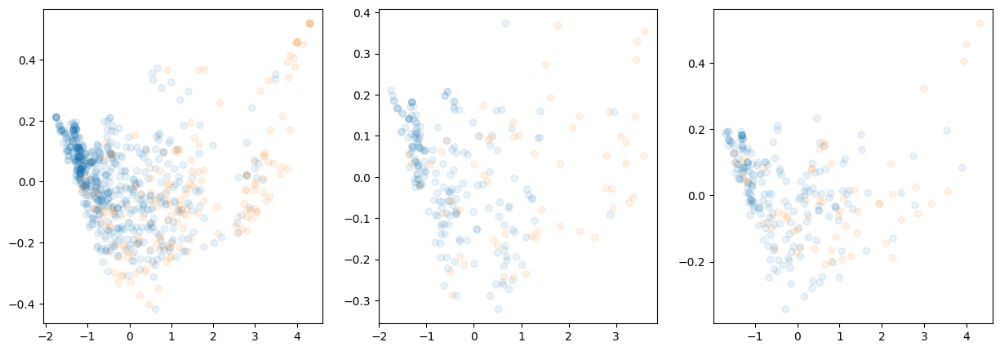

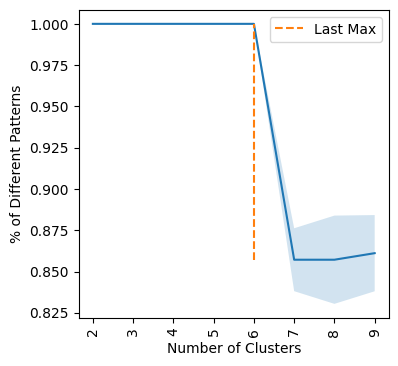

<Figure size 500x500 with 0 Axes>

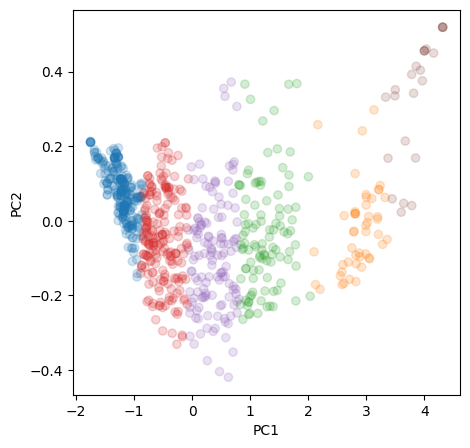

<Figure size 500x500 with 0 Axes>

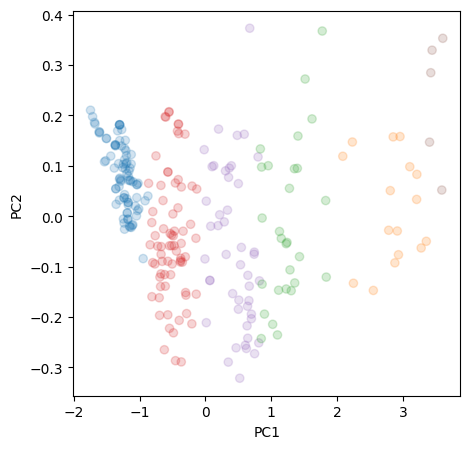

<Figure size 500x500 with 0 Axes>

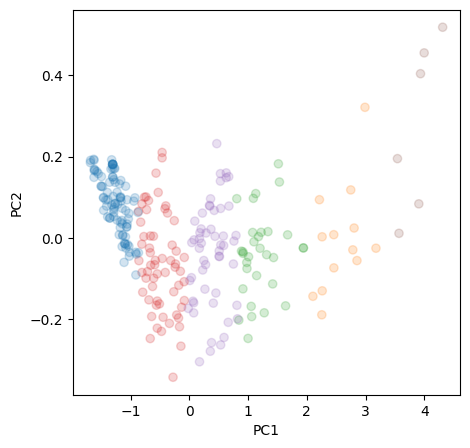

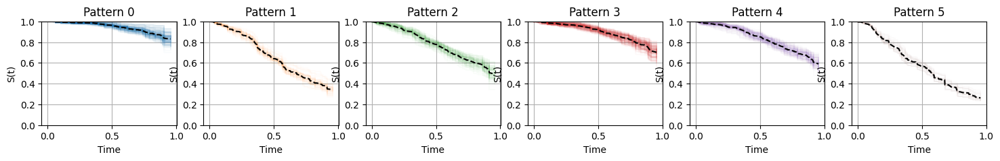

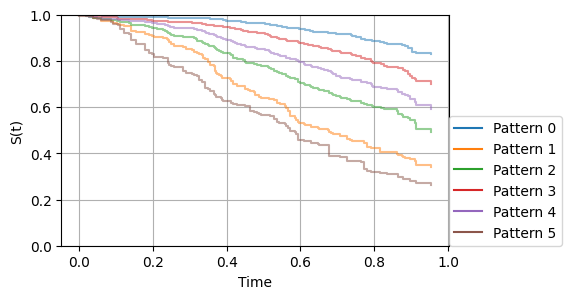

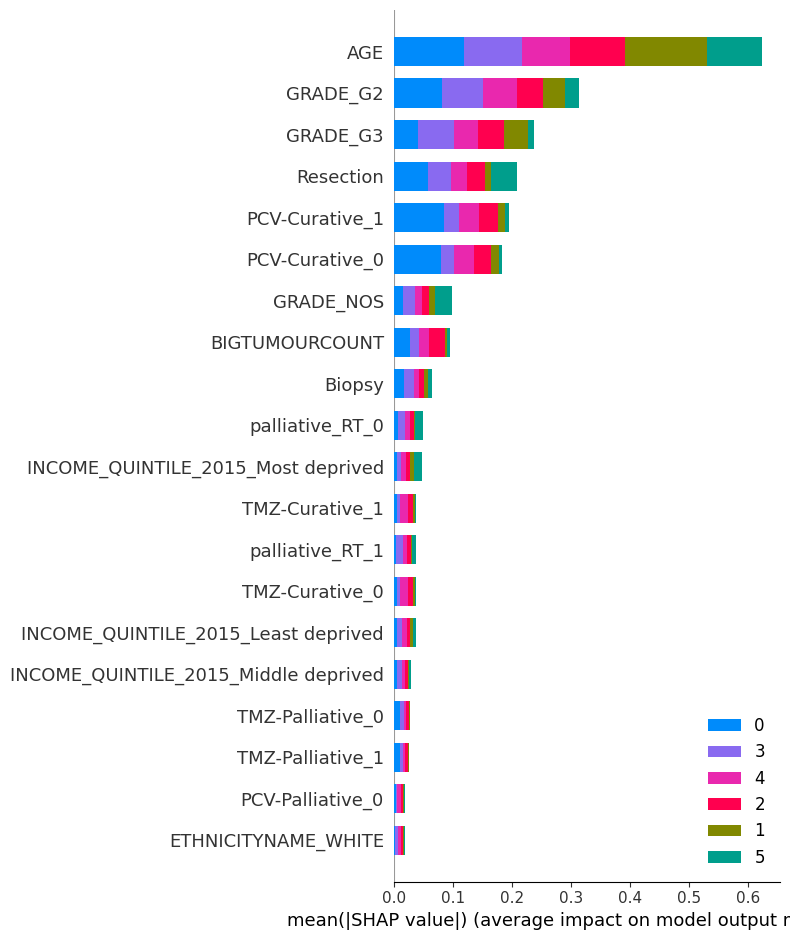

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


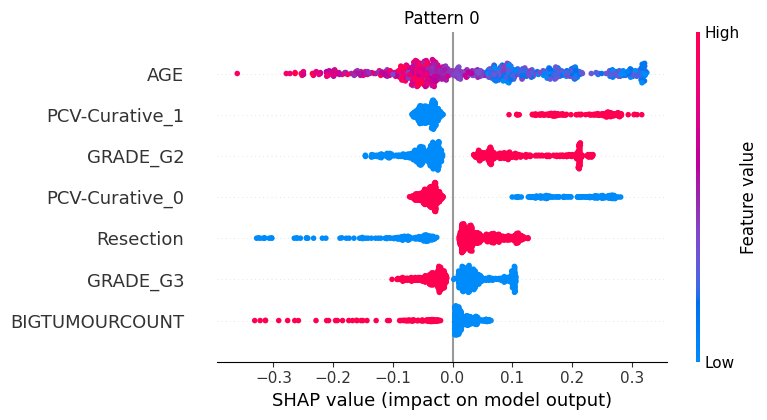

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


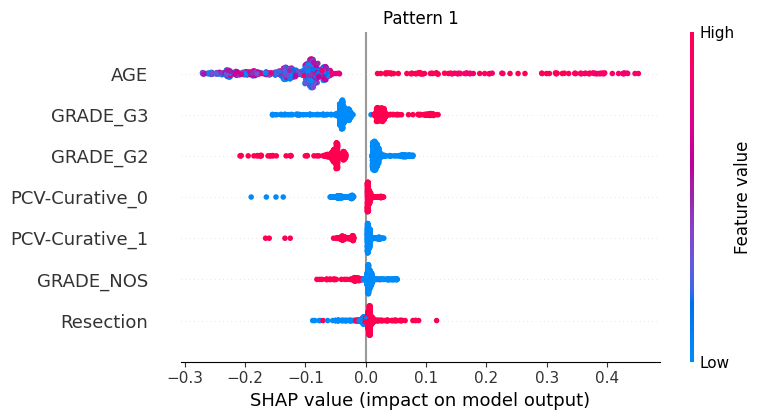

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


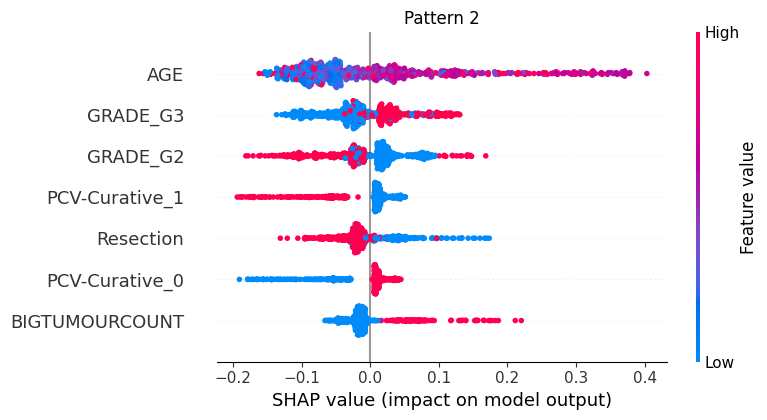

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


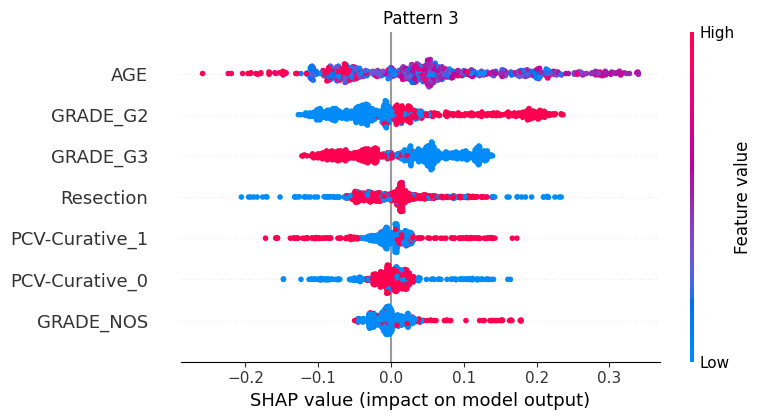

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


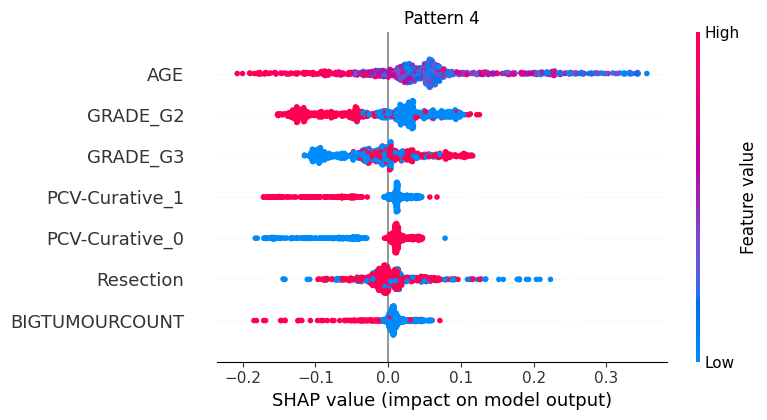

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


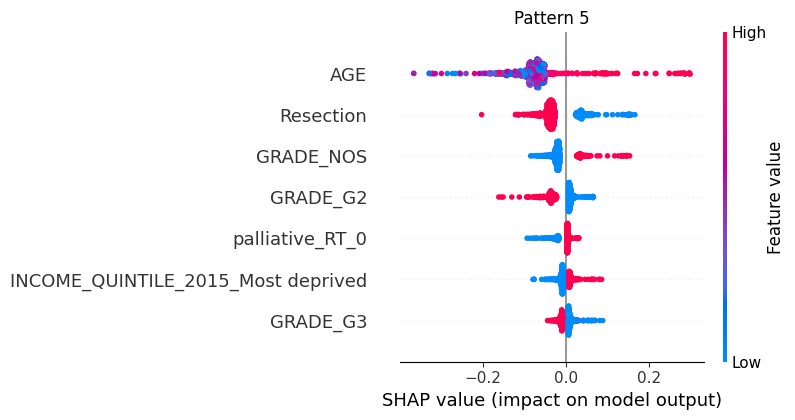

In [266]:
# special for RSF
dt = np.dtype('bool,float')
y_train_surv = np.array([(bool(e), y) for e, y in zip(e_train, y_train)], dtype=dt)
y_val_surv = np.array([(bool(e), y) for e, y in zip(e_val, y_val)], dtype=dt)
y_test_surv = np.array([(bool(e), y) for e, y in zip(e_test, y_test)], dtype=dt)
print(y_train_surv.shape, y_val_surv.shape)

# train RSF
rsf = RandomSurvivalForest(n_estimators=1001,
                           min_samples_split=3,
                           min_samples_leaf=14,
                           max_features="sqrt",
                           oob_score=True,
                           n_jobs=-1,
                           max_depth=23,
                           random_state=8)

rsf.fit(x_train, y_train_surv)

cindex_train = rsf.score(x_train, y_train_surv)
cindex_oob = rsf.oob_score_
cindex_val = rsf.score(x_val, y_val_surv)
cindex_test = rsf.score(x_test, y_test_surv)

print('Train cindex {:.2f}'.format(cindex_train*100))
print('Val cindex {:.2f}'.format(cindex_val*100))
print('Test cindex {:.2f}'.format(cindex_test*100))
print('oob cindex {:.2f}'.format(cindex_oob*100))

surv_train = rsf.predict_survival_function(x_train, return_array=True)
surv_val = rsf.predict_survival_function(x_val, return_array=True)
surv_test = rsf.predict_survival_function(x_test, return_array=True)

event_times=rsf.event_times_

# Prepare Data for Explanation
xte_data = (x_train, y_train, e_train,
            x_val, y_val, e_val,
            x_test, y_test, e_test)

survival_curves = (surv_train, surv_val, surv_test)

# Explain
explainer = SurvSHAP(prefix_name='flchain_sub1_example', max_depth=64)
explainer.fit(xte_data=xte_data, survival_curves=survival_curves, event_times=event_times)
shap_values_train = explainer.explain(x=x_train, features_names_list=ds.features_names, suffex='train')

(762,) (254,)
Train cindex 81.45
Val cindex 80.23
Test cindex 77.58
oob cindex 76.58
shape: 164


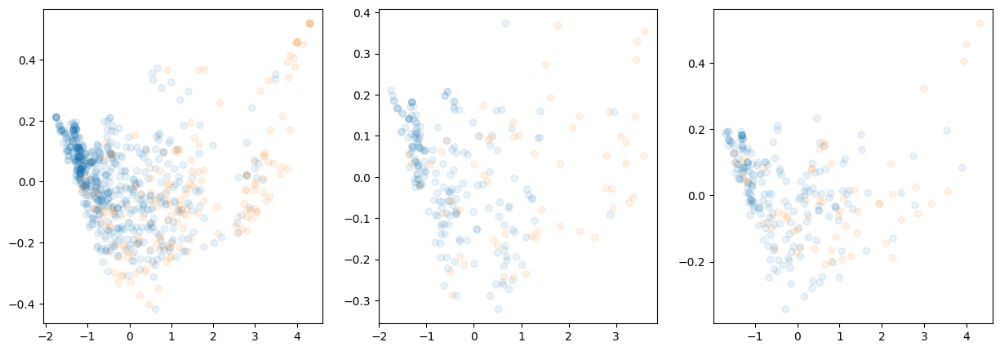

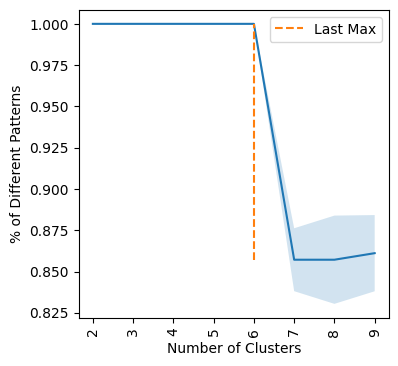

<Figure size 500x500 with 0 Axes>

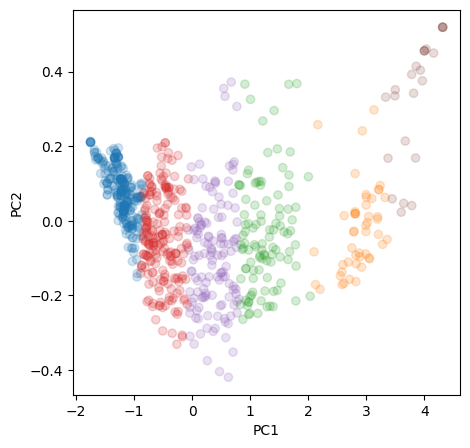

<Figure size 500x500 with 0 Axes>

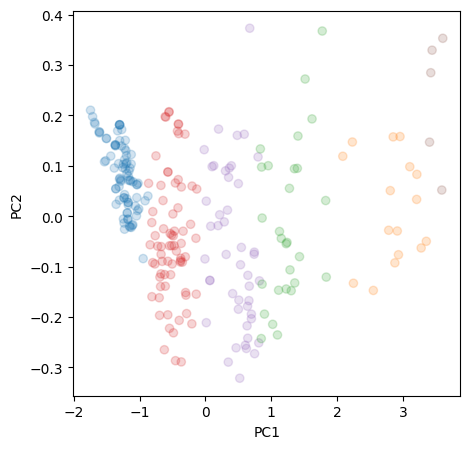

<Figure size 500x500 with 0 Axes>

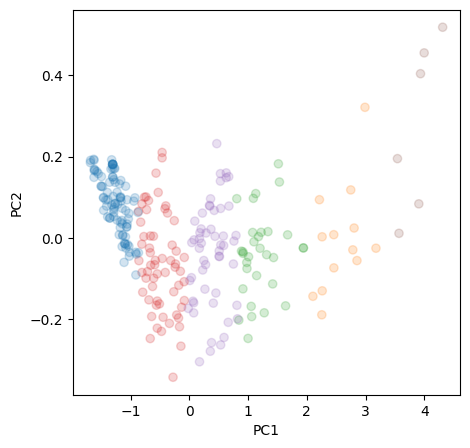

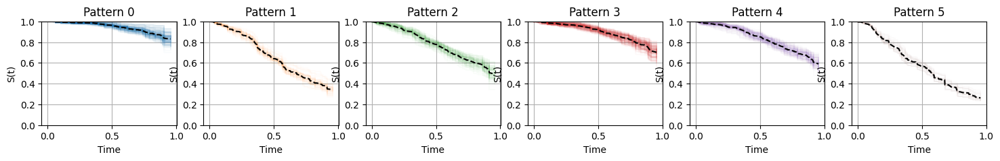

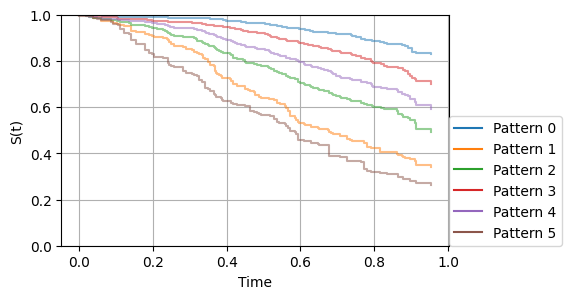

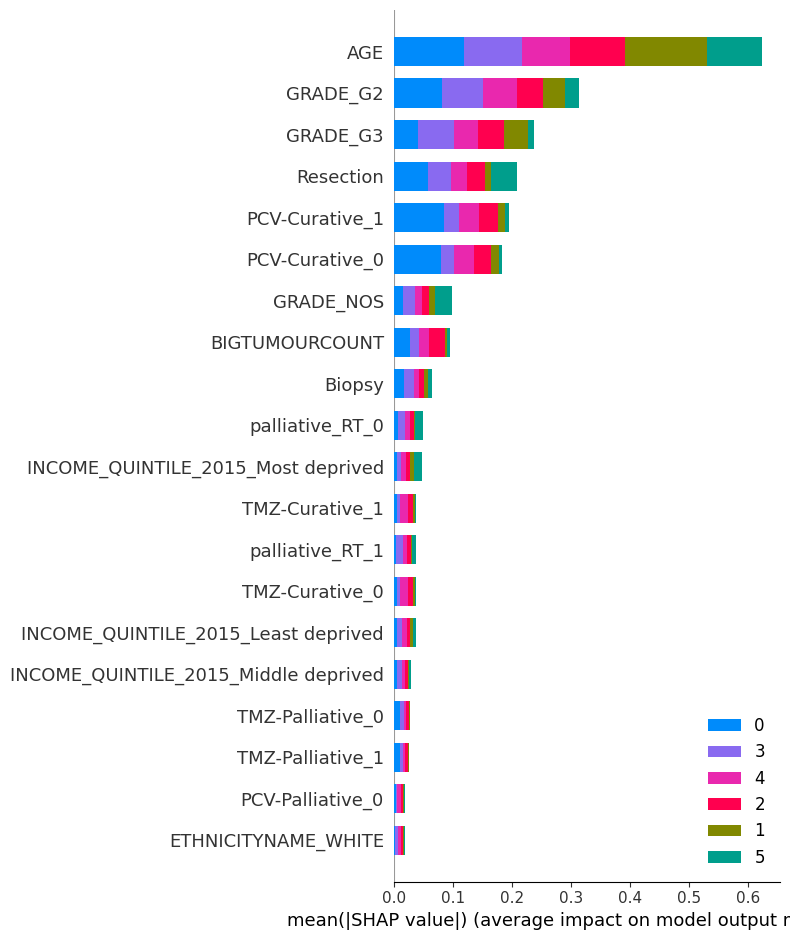

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


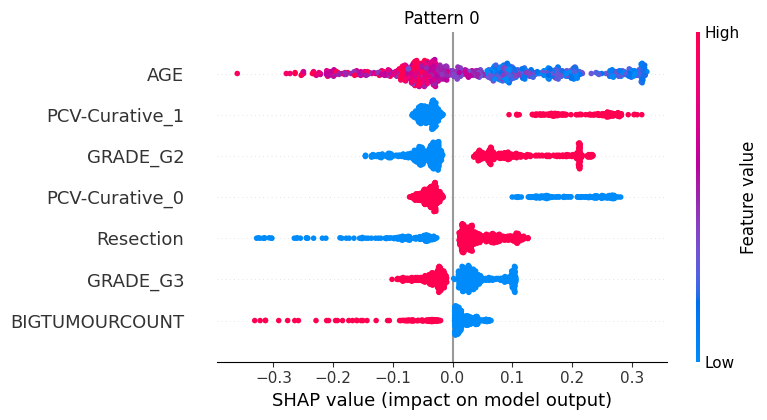

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


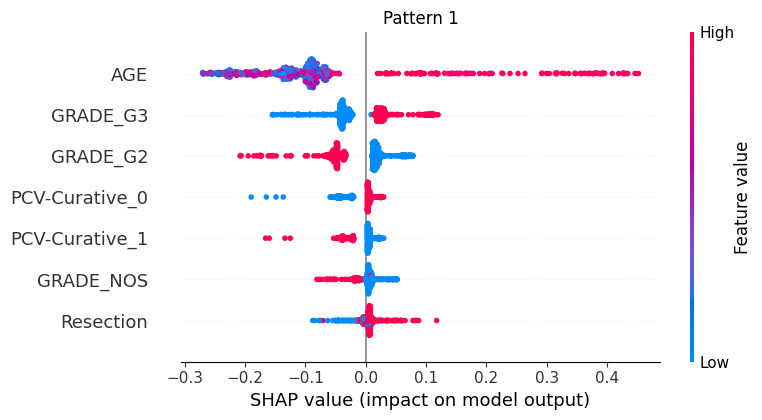

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


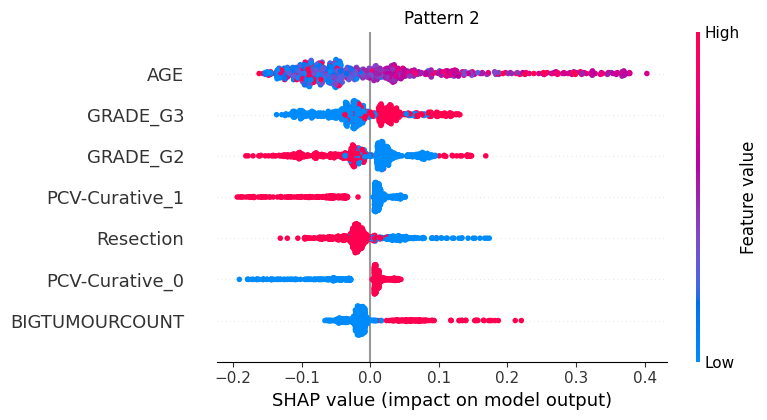

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


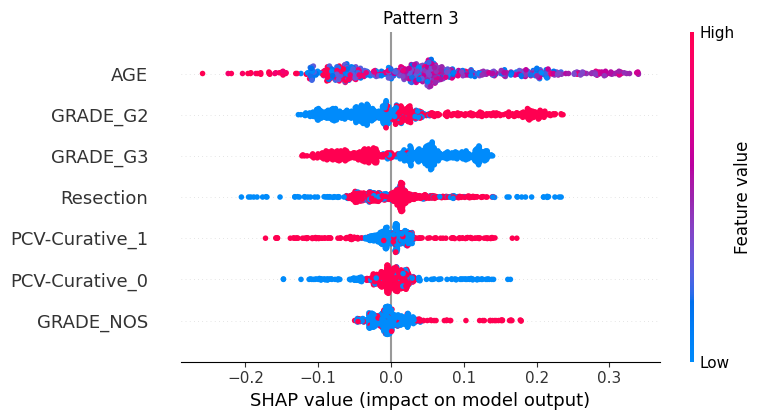

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


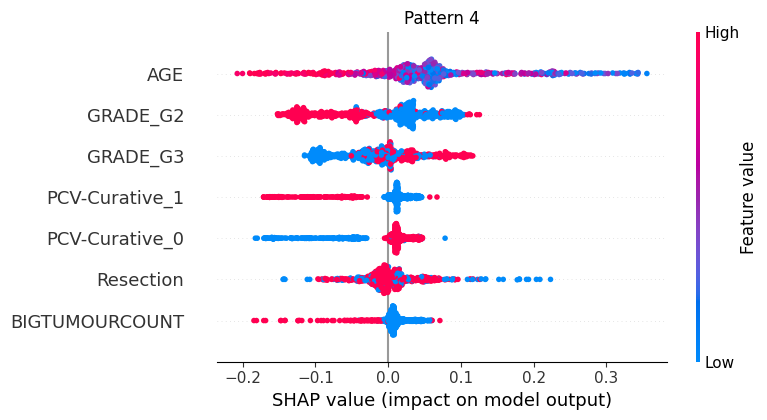

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


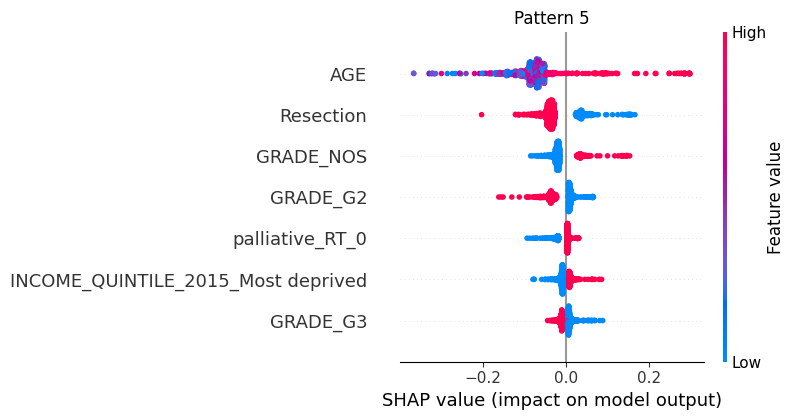

In [200]:
# special for RSF
from sksurv.ensemble import RandomSurvivalForest
dt = np.dtype('bool,float')
y_train_surv = np.array([(bool(e), y) for e, y in zip(e_train, y_train)], dtype=dt)
y_val_surv = np.array([(bool(e), y) for e, y in zip(e_val, y_val)], dtype=dt)
y_test_surv = np.array([(bool(e), y) for e, y in zip(e_test, y_test)], dtype=dt)
print(y_train_surv.shape, y_val_surv.shape)

# train RSF
rsf = RandomSurvivalForest(n_estimators=1001,
                           min_samples_split=3,
                           min_samples_leaf=14,
                           max_features="sqrt",
                           oob_score=True,
                           n_jobs=-1,
                           max_depth=23,
                           random_state=8)

rsf.fit(x_train, y_train_surv)

cindex_train = rsf.score(x_train, y_train_surv)
cindex_oob = rsf.oob_score_
cindex_val = rsf.score(x_val, y_val_surv)
cindex_test = rsf.score(x_test, y_test_surv)

print('Train cindex {:.2f}'.format(cindex_train*100))
print('Val cindex {:.2f}'.format(cindex_val*100))
print('Test cindex {:.2f}'.format(cindex_test*100))
print('oob cindex {:.2f}'.format(cindex_oob*100))

surv_train = rsf.predict_survival_function(x_train, return_array=True)
surv_val = rsf.predict_survival_function(x_val, return_array=True)
surv_test = rsf.predict_survival_function(x_test, return_array=True)

event_times=rsf.event_times_

# Prepare Data for Explanation
xte_data = (x_train, y_train, e_train,
            x_val, y_val, e_val,
            x_test, y_test, e_test)

survival_curves = (surv_train, surv_val, surv_test)

# Explain
explainer = SurvSHAP(prefix_name='flchain_sub1_example', max_depth=512)
explainer.fit(xte_data=xte_data, survival_curves=survival_curves, event_times=event_times)
shap_values_train = explainer.explain(x=x_train, features_names_list=ds.features_names, suffex='train')

(762,) (254,)
Train cindex 81.45
Val cindex 80.23
Test cindex 77.58
oob cindex 76.58
shape: 164


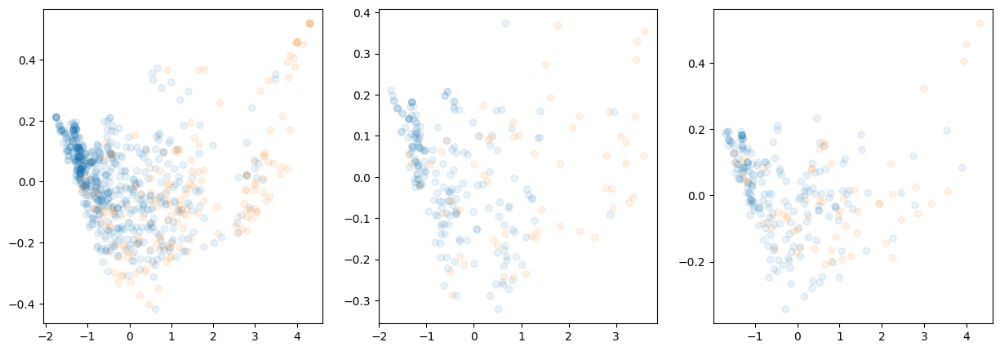

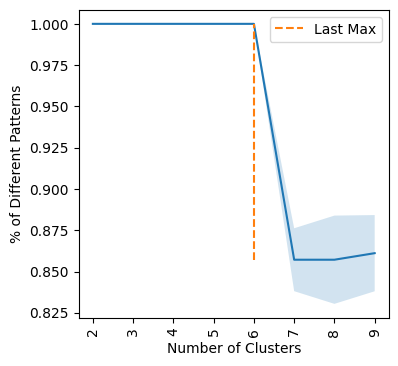

<Figure size 500x500 with 0 Axes>

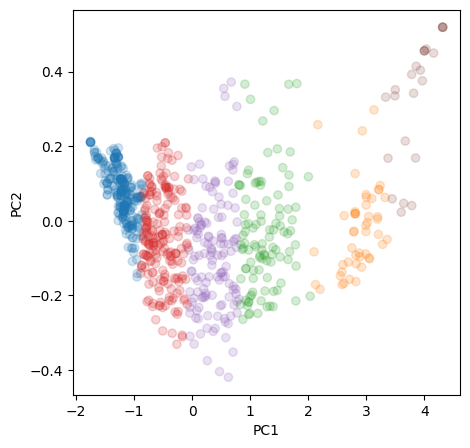

<Figure size 500x500 with 0 Axes>

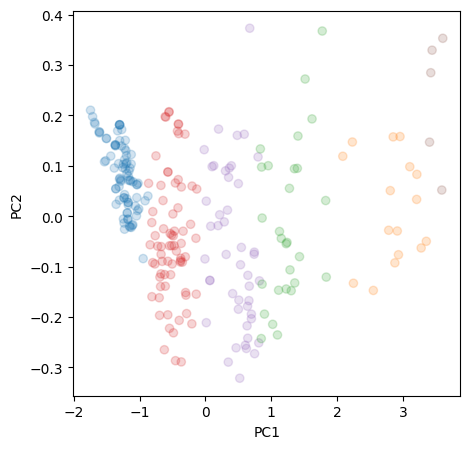

<Figure size 500x500 with 0 Axes>

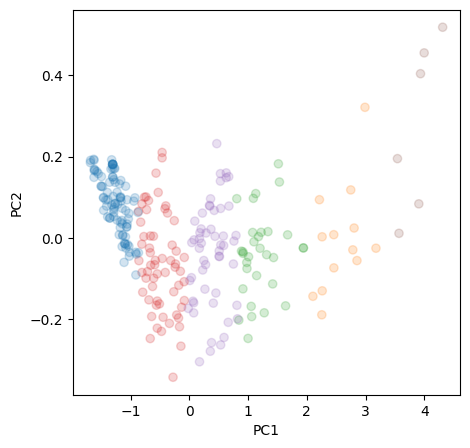

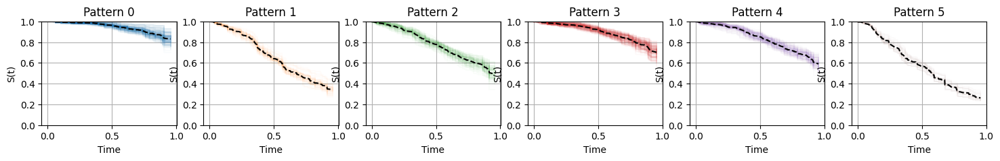

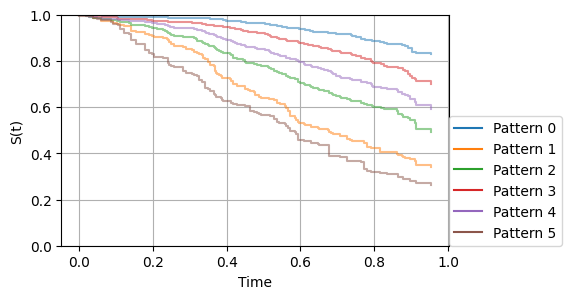

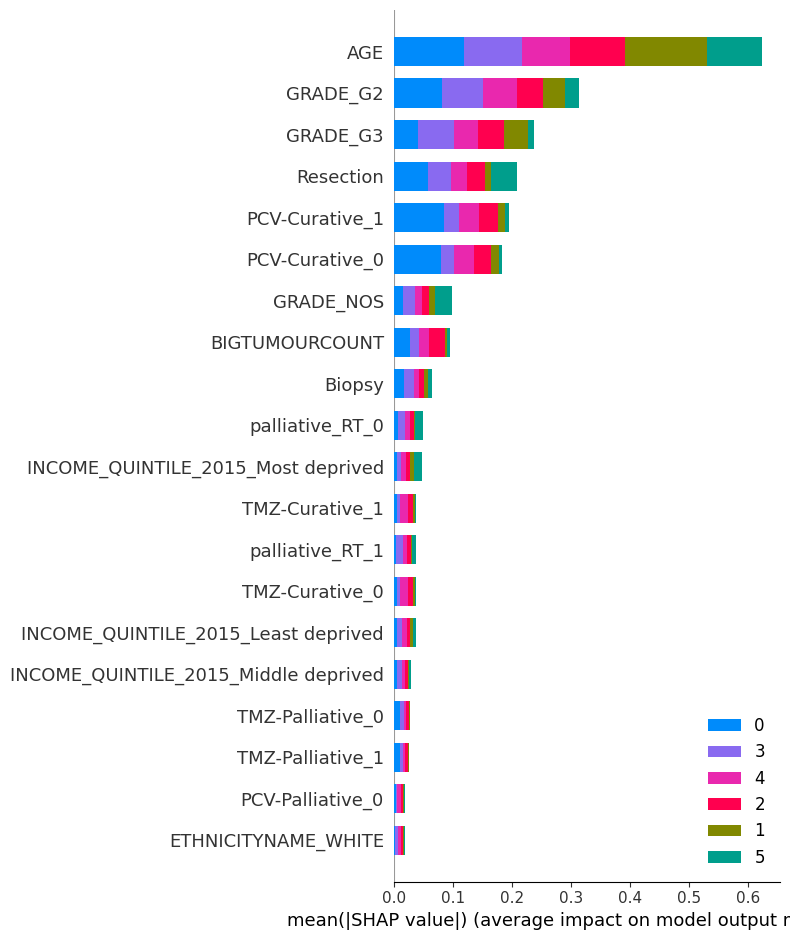

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


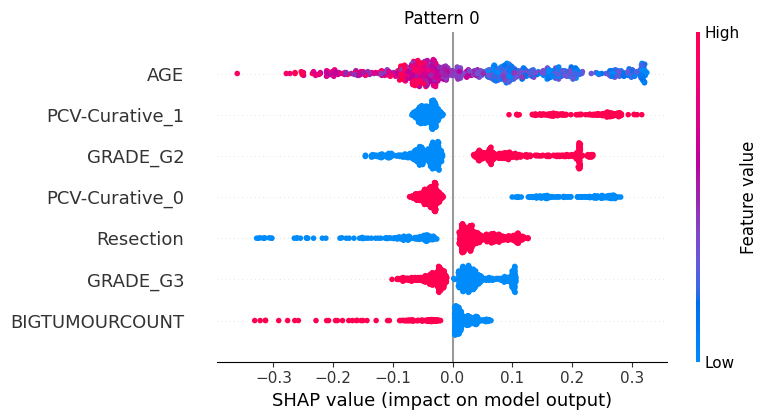

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


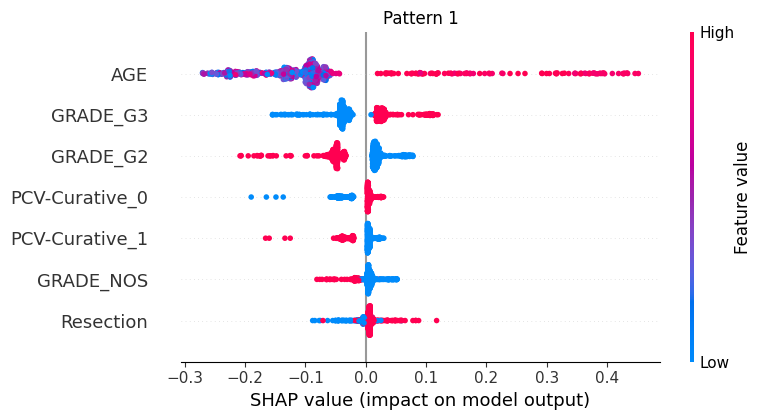

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


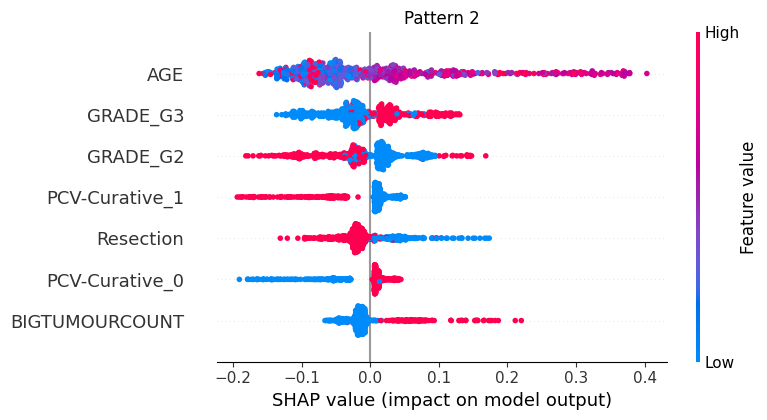

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


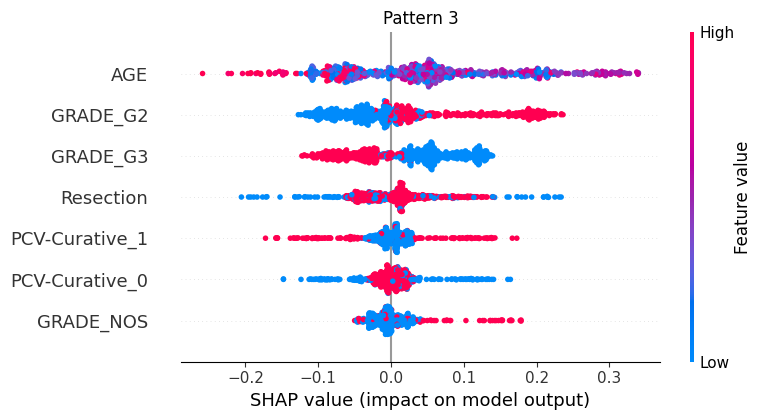

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


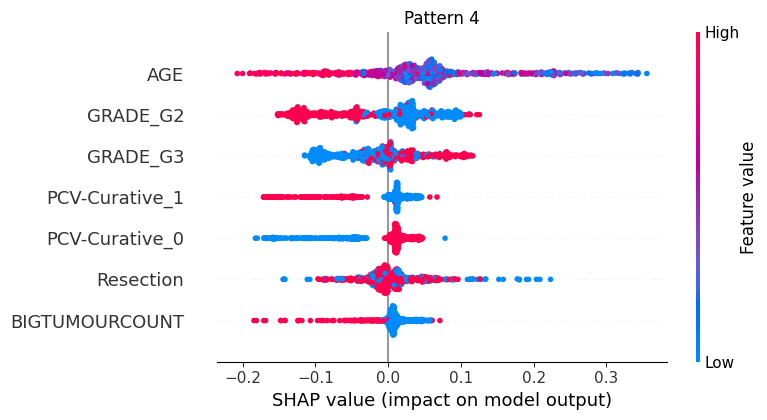

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


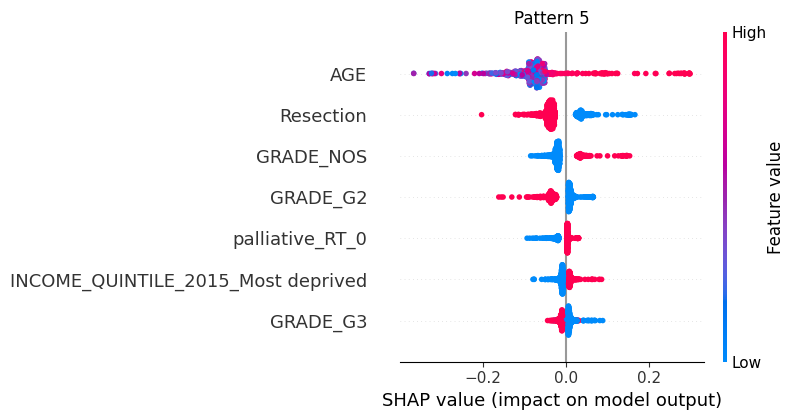

In [201]:
# special for RSF
from sksurv.ensemble import RandomSurvivalForest
dt = np.dtype('bool,float')
y_train_surv = np.array([(bool(e), y) for e, y in zip(e_train, y_train)], dtype=dt)
y_val_surv = np.array([(bool(e), y) for e, y in zip(e_val, y_val)], dtype=dt)
y_test_surv = np.array([(bool(e), y) for e, y in zip(e_test, y_test)], dtype=dt)
print(y_train_surv.shape, y_val_surv.shape)

# train RSF
rsf = RandomSurvivalForest(n_estimators=1001,
                           min_samples_split=3,
                           min_samples_leaf=14,
                           max_features="sqrt",
                           oob_score=True,
                           n_jobs=-1,
                           max_depth=23,
                           random_state=8)

rsf.fit(x_train, y_train_surv)

cindex_train = rsf.score(x_train, y_train_surv)
cindex_oob = rsf.oob_score_
cindex_val = rsf.score(x_val, y_val_surv)
cindex_test = rsf.score(x_test, y_test_surv)

print('Train cindex {:.2f}'.format(cindex_train*100))
print('Val cindex {:.2f}'.format(cindex_val*100))
print('Test cindex {:.2f}'.format(cindex_test*100))
print('oob cindex {:.2f}'.format(cindex_oob*100))

surv_train = rsf.predict_survival_function(x_train, return_array=True)
surv_val = rsf.predict_survival_function(x_val, return_array=True)
surv_test = rsf.predict_survival_function(x_test, return_array=True)

event_times=rsf.event_times_

# Prepare Data for Explanation
xte_data = (x_train, y_train, e_train,
            x_val, y_val, e_val,
            x_test, y_test, e_test)

survival_curves = (surv_train, surv_val, surv_test)

# Explain
explainer = SurvSHAP(prefix_name='flchain_sub1_example', max_depth=1024)
explainer.fit(xte_data=xte_data, survival_curves=survival_curves, event_times=event_times)
shap_values_train = explainer.explain(x=x_train, features_names_list=ds.features_names, suffex='train')